# Statistics for Michel electron candidate

### Created by Shu, 202508---

<br />
<br />
<br />
<br />
<br />
<br />

## WVF Coincidence Explore:

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D


import os

# ------------------------------------------------------------
# 1️⃣ Define which dates to include
# ------------------------------------------------------------
dates = ["20251010", "20251011", "20251012", "20251013", "20251014", "20251015", "20251016", 
         "20251017", "20251018", "20251019", "20251020", "20251021", "20251022", "20251023",
         "20251024", "20251025", "20251026", "20251027", "20251028", "20251029", "20251030",
         "20251031", "20251032",
         "20251042", "20251043", "20251044", "20251045"]  # ✅ modify as needed

coinNum = []     # waveform coincidence numbers
coinTrueE = []   # candidate energies
coinPDG = []     # candidate PDG codes


# ------------------------------------------------------------
# 2️⃣ Read waveform coincidence counts
# ------------------------------------------------------------
for d in dates:
    fname = f"./statResult_pds/print_wvfCoin_count{d}.txt"
    if not os.path.exists(fname):
        print(f"[WARN] File not found: {fname}")
        continue

    with open(fname, "r") as file:
        for line in file:
            line = line.strip()
            if not line:
                continue
            parts = line.split(":")
            if len(parts) >= 2:
                try:
                    number = int(parts[1].strip())
                    coinNum.append(number)
                except ValueError:
                    print(f"[WARN] Could not convert '{parts[1].strip()}' in {fname} to an integer.")


# ------------------------------------------------------------
# 3️⃣ Read candidate energies
# ------------------------------------------------------------
for d in dates:
    fname = f"./statResult_pds/print_trueE{d}.txt"
    if not os.path.exists(fname):
        print(f"[WARN] File not found: {fname}")
        continue

    with open(fname, "r") as file:
        for line in file:
            value = line.strip()
            if value:
                try:
                    coinTrueE.append(float(value))
                except ValueError:
                    print(f"[WARN] Could not convert '{value}' in {fname} to float.")


# ------------------------------------------------------------
# 4️⃣ Read candidate PDG codes
# ------------------------------------------------------------
for d in dates:
    fname = f"./statResult_pds/print_truePDG{d}.txt"
    if not os.path.exists(fname):
        print(f"[WARN] File not found: {fname}")
        continue

    with open(fname, "r") as file:
        for line in file:
            value = line.strip()
            if value:
                try:
                    coinPDG.append(int(value))
                except ValueError:
                    print(f"[WARN] Could not convert '{value}' in {fname} to int.")


# ------------------------------------------------------------
# ✅ Summary
# ------------------------------------------------------------


print("Track candidates (TPC cut)  : 4431 (4431)")
print("Track candidates with NO wvf: 794 (794)")
print("Number of track candidates  :", len(coinNum))

#coinNum.extend([0] * (88+95))



print("\nLength of track coinTrueE: ", len(coinTrueE))
print("Length of track coinPDG  : ", len(coinPDG))


Track candidates (TPC cut)  : 4431 (4431)
Track candidates with NO wvf: 794 (794)
Number of track candidates  : 125871

Length of track coinTrueE:  125871
Length of track coinPDG  :  125871


Purity of coinNum:  98092 / 125871 (77.93%)
Michel e:  17563 / 98092 (17.90%)
Michel p:  80529 / 98092 (82.10%)

Candidates with #opWvf>=4:  107984 / 125871 (85.79%)
Purity:  83642 / 107984 (77.46%)

Values here are based on MS>0.2 & MH>2...


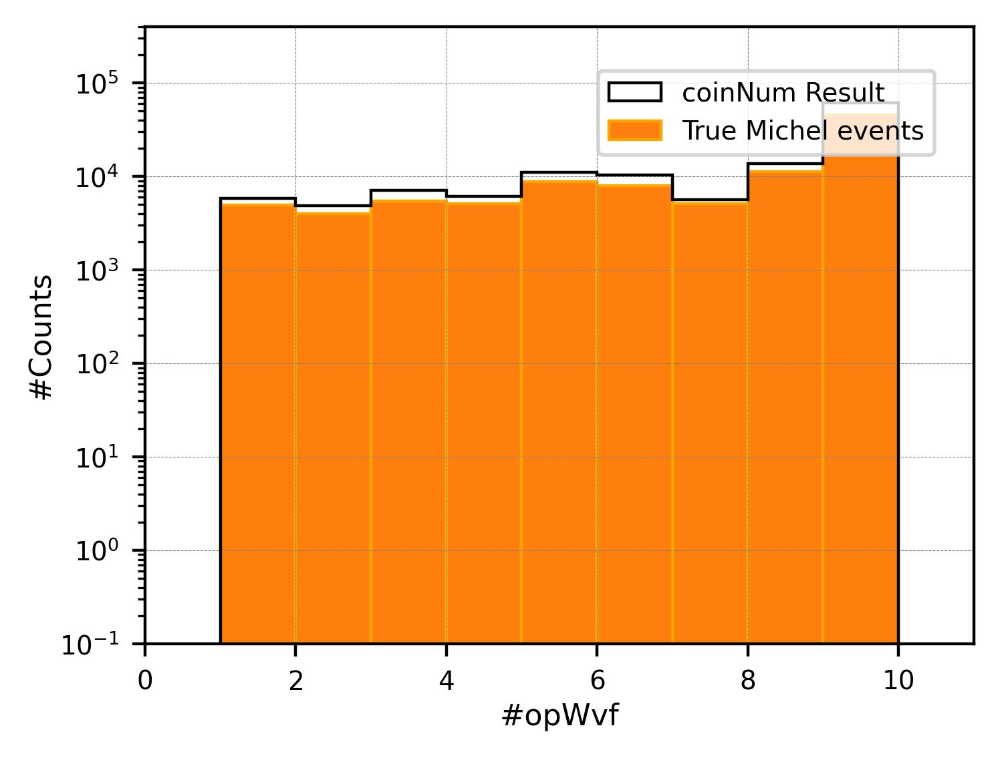

<Figure size 1600x1200 with 0 Axes>

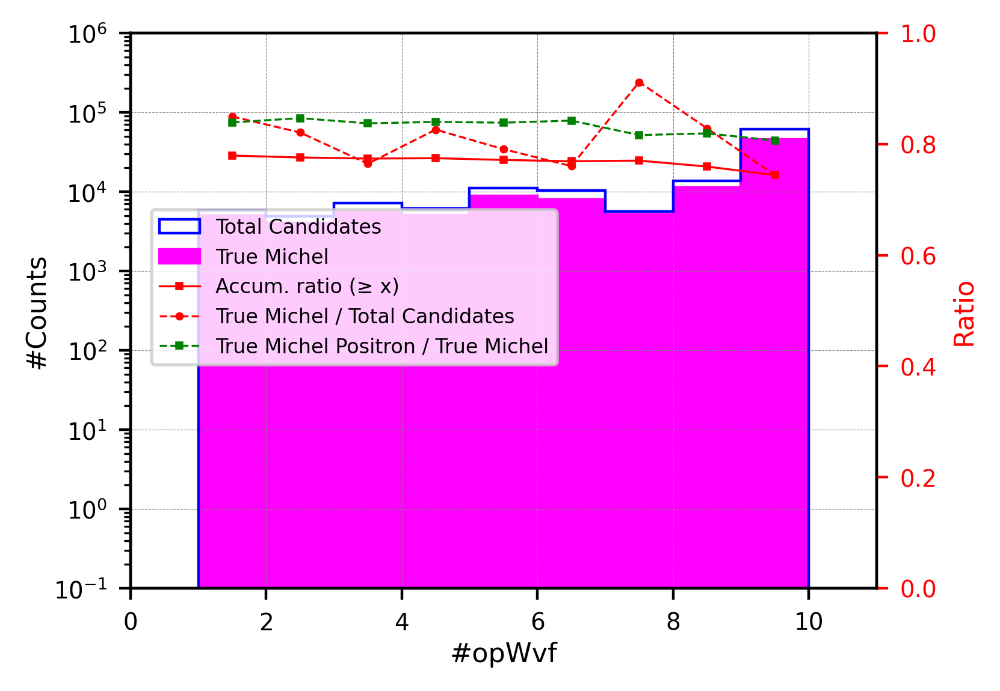

In [164]:

#Extract coinNum with trueE:===========================
coinNum_trueE = []
coinNum_trueE_e = [] #Michel electron
coinNum_trueE_p = [] #Michel positron
for i in range(0, len(coinTrueE)):
    count = coinNum[i]
    e = coinTrueE[i]
    pdg = coinPDG[i]

    if e > 0:
        coinNum_trueE.append(count)
        if pdg == 11:
            coinNum_trueE_e.append(count)
        if pdg == -11:
            coinNum_trueE_p.append(count)

print("Purity of coinNum: ", len(coinNum_trueE), "/", len(coinNum), "({:.2f}%)".format(len(coinNum_trueE)/len(coinNum)*100))
print("Michel e: ", len(coinNum_trueE_e), "/", len(coinNum_trueE), "({:.2f}%)".format(len(coinNum_trueE_e)/len(coinNum_trueE)*100))
print("Michel p: ", len(coinNum_trueE_p), "/", len(coinNum_trueE), "({:.2f}%)".format(len(coinNum_trueE_p)/len(coinNum_trueE)*100))





#Apply preliminary cut #opWvf >=4:=====================
coinNum_cut5 = []
coinNum_trueE_cut5 = []
for i in range(0, len(coinNum)):
    coin = coinNum[i]
    trueE = coinTrueE[i]

    if coin >=4:
        coinNum_cut5.append(coin)
    
        if trueE > 0:
            coinNum_trueE_cut5.append(trueE)

print("\nCandidates with #opWvf>=4: ", len(coinNum_cut5), "/", len(coinNum), "({:.2f}%)".format(len(coinNum_cut5)/len(coinNum)*100))
print("Purity: ", len(coinNum_trueE_cut5), "/", len(coinNum_cut5), "({:.2f}%)".format(len(coinNum_trueE_cut5)/len(coinNum_cut5)*100))

print("\nValues here are based on MS>0.2 & MH>2...")



# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 1
range_min = 0
range_max = 11
bins = np.arange(range_min, range_max + bin_width, bin_width)

#plt.plot([5, 5], [0, 1200], color="black", linewidth=1.5, linestyle='--')

plt.hist(coinNum, bins=bins, range=(range_min, range_max), edgecolor='black', 
         histtype='step', linewidth=0.8, label='coinNum Result')
plt.hist(coinNum_trueE, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='bar', linewidth=0.8, label="True Michel events")



plt.legend(loc='upper center', bbox_to_anchor=(0.75, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.xlim(0, 11)
#plt.ylim(0, 50)
plt.xlabel('#opWvf', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 400000)
plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show() 








#Michel score distribution (Original)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

# Define the range and bin width
bin_width = 1
range_min = 1
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Compute histograms
hist_total, _ = np.histogram(coinNum, bins=bins, range=(range_min, range_max))
hist_true, _ = np.histogram(coinNum_trueE, bins=bins, range=(range_min, range_max))
hist_trueP, _ = np.histogram(coinNum_trueE_p, bins=bins, range=(range_min, range_max))#True positron

# Compute bin centers (midpoints of bins)
bin_centers = bins[:-1] + bin_width / 2

fig, ax1 = plt.subplots(figsize=(4,3), dpi=400)

# Primary y-axis (Counts)
ax1.hist(bin_centers, bins=bins, weights=hist_total, edgecolor='blue', histtype='step', linewidth=0.8, label="Total Candidates")
ax1.hist(bin_centers, bins=bins, weights=hist_true, edgecolor='magenta', color='magenta', histtype='bar', 
         linewidth=0.8, label="True Michel")
#ax1.hist(bin_centers, bins=bins, weights=hist_trueP, edgecolor='green', color='green', histtype='bar', 
#         linewidth=0.8, label="True Michel Positron")


#ax1.plot([4, 4], [0, 1400], color="blue", linewidth=0.8, linestyle='-')


ax1.set_xlim(0, 11)
ax1.set_xlabel('#opWvf', labelpad=2, fontsize=8)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=8)
ax1.set_ylim(0.1, 1000000)
ax1.set_yscale('log')
ax1.tick_params(labelsize=7)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})

# Secondary y-axis (Ratio)
ax2 = ax1.twinx()
ratio = np.divide(hist_true, hist_total, out=np.zeros_like(hist_true, dtype=float), where=hist_total!=0)  # Avoid division by zero

ratio2 = np.divide(hist_trueP, hist_true, out=np.zeros_like(hist_trueP, dtype=float), where=hist_total!=0)  # Avoid division by zero

# --- Accumulated (>= x) ratio ---
# Cumulative sums from the right (>= x)
cum_total = np.cumsum(hist_total[::-1])[::-1]
cum_true  = np.cumsum(hist_true[::-1])[::-1]
acc_ratio = np.divide(cum_true, cum_total,
                      out=np.zeros_like(cum_true, dtype=float),
                      where=cum_total != 0)

# Add the accumulated ratio curve on the secondary y-axis
ax2.plot(bin_centers, acc_ratio, color='red', marker='s', markersize=1.5,
         linestyle='-', linewidth=0.6, label='Accum. ratio (≥ x)')


ax2.plot(bin_centers, ratio, color='red', marker='o', markersize=1.5, linestyle='--', 
         linewidth=0.6, label="True Michel / Total Candidates")

ax2.plot(bin_centers, ratio2, color='green', marker='s', markersize=1.5, linestyle='--', 
         linewidth=0.6, label="True Michel Positron / True Michel")



ax2.set_ylabel('Ratio', fontsize=8, color='red')
ax2.set_ylim(0.0, 1.0)

ax2.tick_params(axis='y', labelsize=7, colors='red')



# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center', bbox_to_anchor=(0.3, 0.7),
           fontsize=9, ncol=1, prop={'size': 6})



plt.show()



<br />
<br />
<br />
<br />
<br />
<br />

## Process WVF:
### After TPC cuts & (#opWvf >= 4) (This can be taken as "PDS Cut 1")

In [52]:
from dataclasses import dataclass
from typing import Optional
import matplotlib.pyplot as plt
import numpy as np
import re
from mpl_toolkits.mplot3d import Axes3D



# ------------------- Dataclass -------------------
@dataclass
class PdsEvent:
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    third_time: Optional[int] = None             # NEW
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None      # NEW
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    energy: Optional[float] = None
    lifetime: Optional[float] = None
    pdg: Optional[int] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None
    # muon
    mu_leftTurn: Optional[int] = None
    mu_rightTurn: Optional[int] = None
    mu_leftHeight: Optional[float] = None
    mu_rightHeight: Optional[float] = None
    # michel
    mi_leftTurn: Optional[int] = None
    mi_rightTurn: Optional[int] = None
    mi_leftHeight: Optional[float] = None
    mi_rightHeight: Optional[float] = None
    # third peak
    th_leftTurn: Optional[int] = None            # NEW
    th_rightTurn: Optional[int] = None           # NEW
    th_leftHeight: Optional[float] = None        # NEW
    th_rightHeight: Optional[float] = None       # NEW
    # Michel-level attributes
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None            # ✅ NEW



# ------------------- Helpers -------------------
def parse_event_track(path_str: str):
    """Extract eventID and trackID from a file path string."""
    m = re.search(r"event(\d+)_trackID(\d+)", path_str)
    if m:
        return int(m.group(1)), int(m.group(2))
    return None, None



def read_total_files(files, dates, kind="muon"):
    """
    Read *_total_xxx.txt files.
    Each line: path: t, I, leftTurn, leftHeight, rightTurn, rightHeight
    """
    records = []
    for fname, date in zip(files, dates):
        try:
            with open(fname, "r") as f:
                for line in f:
                    line = line.strip()
                    if not line:
                        continue
                    parts = line.split(":")
                    if len(parts) < 2:
                        continue

                    path_part = parts[0].strip()
                    values = [v.strip() for v in parts[1].split(",")]
                    if len(values) < 6:
                        print(f"[WARN] Malformed line in {fname}: {line}")
                        continue

                    try:
                        time_val = int(values[0])
                        inten_val = float(values[1])
                        left_turn = int(values[2])
                        left_h = float(values[3])
                        right_turn = int(values[4])
                        right_h = float(values[5])
                    except ValueError:
                        print(f"[WARN] Could not parse numbers in {line}")
                        continue

                    evID, trID = parse_event_track(path_part)
                    rec = {"eventID": evID, "trackID": trID, "date": int(date)}

                    if kind == "muon":
                        rec.update({
                            "muon_time": time_val,
                            "muon_intensity": inten_val,
                            "mu_leftTurn": left_turn,
                            "mu_leftHeight": left_h,
                            "mu_rightTurn": right_turn,
                            "mu_rightHeight": right_h
                        })
                    elif kind == "michel":
                        rec.update({
                            "michel_time": time_val,
                            "michel_intensity": inten_val,
                            "mi_leftTurn": left_turn,
                            "mi_leftHeight": left_h,
                            "mi_rightTurn": right_turn,
                            "mi_rightHeight": right_h
                        })
                    elif kind == "third":
                        rec.update({
                            "third_time": time_val,
                            "third_intensity": inten_val,
                            "th_leftTurn": left_turn,
                            "th_leftHeight": left_h,
                            "th_rightTurn": right_turn,
                            "th_rightHeight": right_h
                        })

                    records.append(rec)
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return records




def read_plain_files(files, cast_type=float):
    """Read one or more plain text files with one number per line and return concatenated values."""
    values = []
    for fname in files:
        try:
            with open(fname, "r") as file:
                for line in file:
                    value = line.strip()
                    if value:
                        try:
                            values.append(cast_type(value))
                        except ValueError:
                            print(f"Could not convert {value} in {fname}")
        except FileNotFoundError:
            print(f"File not found: {fname}")
    return values



# ------------------- Load data -------------------
dates = ["20251010", "20251011", "20251012", "20251013", "20251014", "20251015", "20251016", "20251017", "20251018", 
         "20251019", "20251020", "20251021", "20251022", "20251023", "20251024", "20251025", "20251026", "20251027",
         "20251028", "20251029", "20251030", "20251031", "20251032",
         "20251042", "20251043", "20251044", "20251045"]

muon_files   = [f"./statResult_pds/muon_total_{d}.txt" for d in dates]
michel_files = [f"./statResult_pds/michel_total_{d}.txt" for d in dates]
third_files  = [f"./statResult_pds/third_total_{d}.txt" for d in dates]

muon_records   = read_total_files(muon_files, dates, kind="muon")
michel_records = read_total_files(michel_files, dates, kind="michel")
third_records  = read_total_files(third_files, dates, kind="third")

# --- plain text attributes ---
posX     = read_plain_files([f"./statResult_pds/posX_extract_{d}.txt" for d in dates])
posY     = read_plain_files([f"./statResult_pds/posY_extract_{d}.txt" for d in dates])
posZ     = read_plain_files([f"./statResult_pds/posZ_extract_{d}.txt" for d in dates])
energy   = read_plain_files([f"./statResult_pds/energy_extract_{d}.txt" for d in dates])
lifetime = read_plain_files([f"./statResult_pds/lifetime_extract_{d}.txt" for d in dates])
pdg      = read_plain_files([f"./statResult_pds/pdg_extract_{d}.txt" for d in dates], cast_type=int)
miScore  = read_plain_files([f"./statResult_pds/michelScore_extract_{d}.txt" for d in dates])
miHits   = read_plain_files([f"./statResult_pds/michelHits_extract_{d}.txt" for d in dates], cast_type=int)



# ------------------- Build dataset -------------------
events_veryInitial = []
n_events = min(
    len(muon_records), len(michel_records), len(third_records),
    len(posX), len(posY), len(posZ),
    len(energy), len(lifetime), len(pdg),
    len(miScore), len(miHits)
)

for i in range(n_events):
    rec_mu = muon_records[i]
    rec_mi = michel_records[i]
    rec_th = third_records[i]

    ev = PdsEvent(
        eventID=rec_mu.get("eventID", rec_mi.get("eventID", rec_th.get("eventID"))),
        trackID=rec_mu.get("trackID", rec_mi.get("trackID", rec_th.get("trackID"))),
        date=rec_mu.get("date", rec_mi.get("date", rec_th.get("date"))),

        # muon
        muon_time=rec_mu.get("muon_time"),
        muon_intensity=rec_mu.get("muon_intensity"),
        mu_leftTurn=rec_mu.get("mu_leftTurn"),
        mu_leftHeight=rec_mu.get("mu_leftHeight"),
        mu_rightTurn=rec_mu.get("mu_rightTurn"),
        mu_rightHeight=rec_mu.get("mu_rightHeight"),

        # michel
        michel_time=rec_mi.get("michel_time"),
        michel_intensity=rec_mi.get("michel_intensity"),
        mi_leftTurn=rec_mi.get("mi_leftTurn"),
        mi_leftHeight=rec_mi.get("mi_leftHeight"),
        mi_rightTurn=rec_mi.get("mi_rightTurn"),
        mi_rightHeight=rec_mi.get("mi_rightHeight"),
        michel_score=miScore[i],
        michel_hits=miHits[i],

        # third
        third_time=rec_th.get("third_time"),
        third_intensity=rec_th.get("third_intensity"),
        th_leftTurn=rec_th.get("th_leftTurn"),
        th_leftHeight=rec_th.get("th_leftHeight"),
        th_rightTurn=rec_th.get("th_rightTurn"),
        th_rightHeight=rec_th.get("th_rightHeight"),

        # physical properties
        posX=posX[i], posY=posY[i], posZ=posZ[i],
        energy=energy[i], lifetime=lifetime[i], pdg=pdg[i]
    )
    events_veryInitial.append(ev)

print("Very initial dataset:", len(events_veryInitial))

example = events_veryInitial[0]
print("\nExample Event (index 0):")
for field, value in vars(example).items():
    print(f"  {field:20s}: {value}")









#Apply cuts on peak intensities-----------------------------
events_reco_initial = []
events_true_initial = []

for ev in events_veryInitial:
    muIntensity = ev.muon_intensity
    miIntensity = ev.michel_intensity
    e = ev.energy

    ms = ev.michel_score
    mh = ev.michel_hits

    #mu & mi are cuts in following block already!
    if muIntensity > 0.3  and miIntensity > -0.1 and ms > 0.4 and mh > 5:
        events_reco_initial.append(ev)

        if e > 0:
            events_true_initial.append(ev)

print("\nDataset after initial intensity-cut----------------------")
print("Michel initial dataset   : ", len(events_reco_initial))
print("Michel purity (true/reco): ", len(events_true_initial), "/ ", len(events_reco_initial), 
      "({:.2f}%)".format(len(events_true_initial)/len(events_reco_initial)*100)) 







Very initial dataset: 107984

Example Event (index 0):
  muon_time           : 124
  michel_time         : 307
  third_time          : 425
  muon_intensity      : 2.98215
  michel_intensity    : 0.947823
  third_intensity     : 0.579398
  posX                : 25.1604
  posY                : 325.254
  posZ                : 299.216
  energy              : 47.022
  lifetime            : 2.95245
  pdg                 : -11
  eventID             : 10007
  trackID             : 13
  date                : 20251010
  mu_leftTurn         : 104
  mu_rightTurn        : 145
  mu_leftHeight       : 3.33479
  mu_rightHeight      : 2.98215
  mi_leftTurn         : 283
  mi_rightTurn        : 325
  mi_leftHeight       : 1.27985
  mi_rightHeight      : 0.947823
  th_leftTurn         : 399
  th_rightTurn        : 442
  th_leftHeight       : 0.579398
  th_rightHeight      : 0.586691
  michel_score        : 0.85711
  michel_hits         : 14

Dataset after initial intensity-cut----------------------
Miche

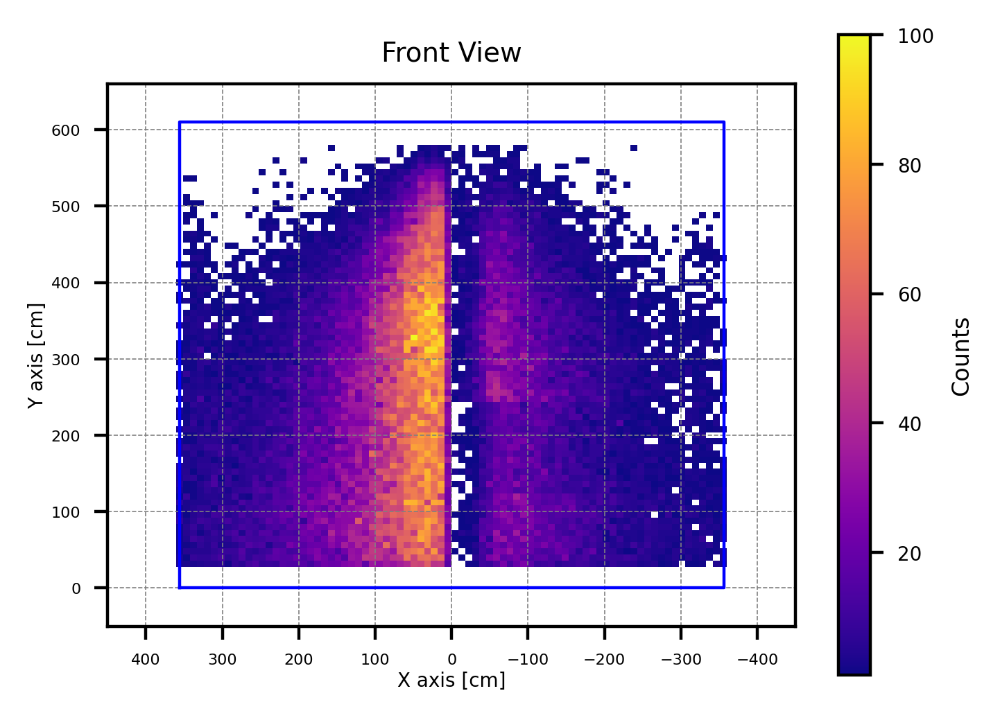

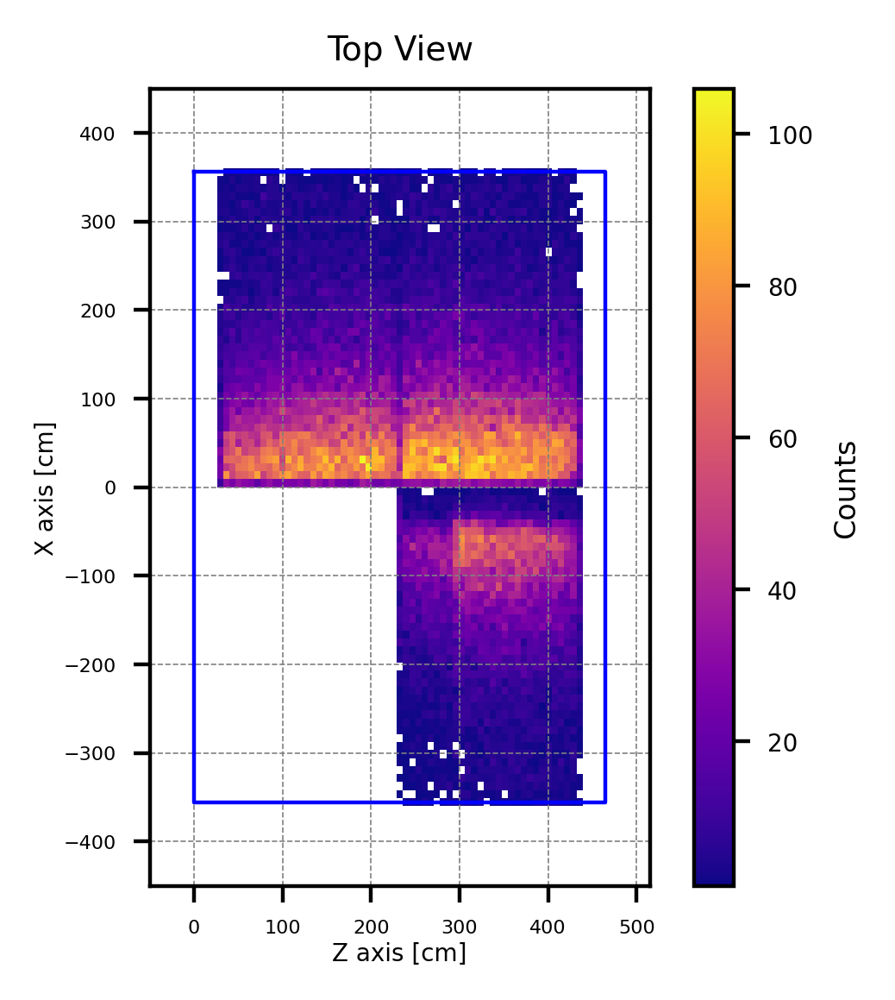


Decay points distribution (TPC & #opWvf cuts): 
# of X < 0 :  18803 (25.09%)
# of X >= 0:  56127 (74.91%)

Michel purity:  67149 /  74930 (89.62%)

Bin Center | Final / Initial Ratio
-------------------------------
   -355.0 | 0.120
   -345.0 | 0.823
   -335.0 | 0.829
   -325.0 | 0.814
   -315.0 | 0.919
   -305.0 | 0.883
   -295.0 | 0.820
   -285.0 | 0.817
   -275.0 | 0.829
   -265.0 | 0.859
   -255.0 | 0.889
   -245.0 | 0.918
   -235.0 | 0.887
   -225.0 | 0.890
   -215.0 | 0.864
   -205.0 | 0.877
   -195.0 | 0.879
   -185.0 | 0.888
   -175.0 | 0.863
   -165.0 | 0.877
   -155.0 | 0.891
   -145.0 | 0.869
   -135.0 | 0.877
   -125.0 | 0.903
   -115.0 | 0.891
   -105.0 | 0.881
    -95.0 | 0.884
    -85.0 | 0.898
    -75.0 | 0.892
    -65.0 | 0.892
    -55.0 | 0.872
    -45.0 | 0.833
    -35.0 | 0.859
    -25.0 | 0.884
    -15.0 | 0.809
     -5.0 | 0.681
      5.0 | 0.922
     15.0 | 0.948
     25.0 | 0.954
     35.0 | 0.946
     45.0 | 0.894
     55.0 | 0.895
     65.0 | 0.893
     75.0 

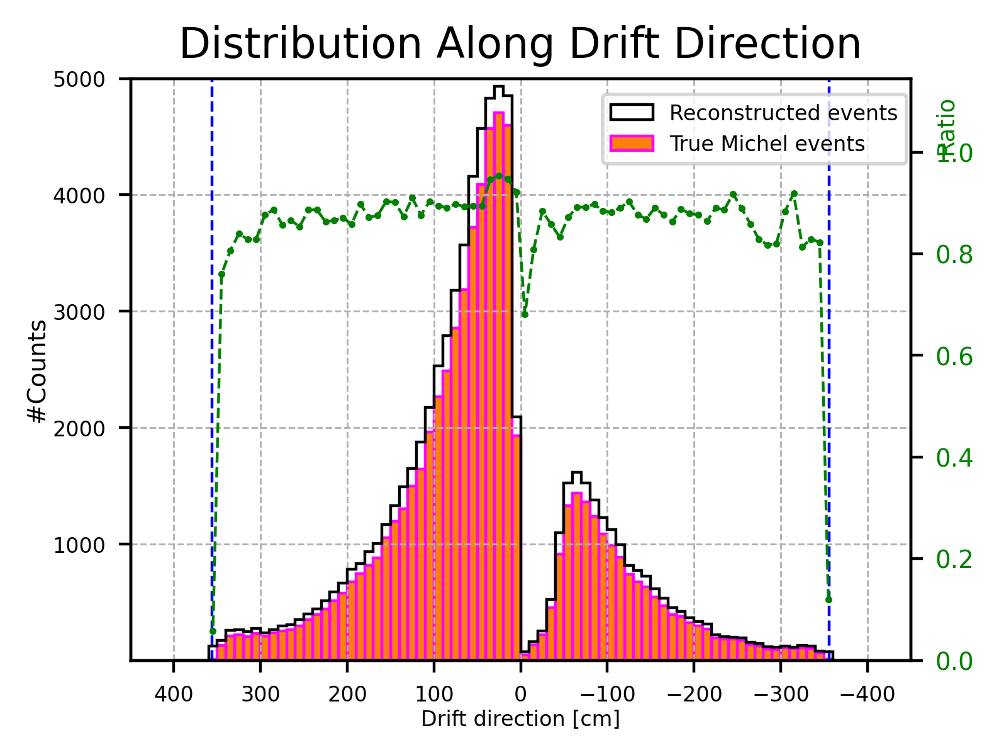

In [53]:
posX = [ev.posX for ev in events_reco_initial]
posY = [ev.posY for ev in events_reco_initial]
posZ = [ev.posZ for ev in events_reco_initial]

posX_true = [ev.posX for ev in events_true_initial]




#Y-X plane ploting (Front View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#Set the limts of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

#Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


#auxiliary line, along y(geo) and x axis---
aux2 = [0, 610, 610, 0, 0] #y shoud be y---
aux1 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')


# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posX, posY, bins=(100, 100), range=[[xmin, xmax], [ymin, ymax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar()
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)


plt.axis('scaled')
plt.xlim(-450, 450)#z---
plt.ylim(-50, 660)
plt.gca().invert_xaxis()  # Flip x-axis
plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
plt.title('Front View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show() 




#Z-X plane ploting (Top View)----------------------------------------
plt.figure(figsize=(4,3),dpi=400)

#auxiliary line, along y(geo) and x axis---
aux1 = [0, 465, 465, 0, 0] #y shoud be y---
aux2 = [356, 356, -356, -356, 356]
plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# Create a custom colormap where zero-frequency regions are white
plasma = plt.cm.plasma.copy()
plasma.set_under('white')  # Sets zero values to white

# Create a 2D histogram
hist, xedges, yedges, img = plt.hist2d(posZ, posX, bins=(100, 100), range=[[zmin, zmax], [xmin, xmax]],
                                       cmap=plasma, cmin=1)  # cmin=1 ensures zero bins remain white

# Add color bar
cbar = plt.colorbar(pad=-0.3)
cbar.set_label('Counts', fontsize=6)
cbar.ax.tick_params(labelsize=5)

plt.axis('scaled')
plt.ylim(-450, 450)#z---
plt.xlim(-50, 515)
plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
plt.title('Top View', fontsize=7)
plt.tick_params(labelsize=4)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.show()








#Decay points distribution:==================================================================
print("\nDecay points distribution (TPC & #opWvf cuts): ")

posX = np.array(posX)
neg_X = np.sum(posX < 0)
pos_X = np.sum(posX >= 0)
print("# of X < 0 : ", neg_X, "({:.2f}%)".format(neg_X/len(posX)*100))
print("# of X >= 0: ", pos_X, "({:.2f}%)".format(pos_X/len(posX)*100))

print("\nMichel purity: ", len(events_true_initial), "/ ", len(events_reco_initial), 
      "({:.2f}%)".format(len(events_true_initial)/len(events_reco_initial)*100))         



# Plotting the histogram (X distribution)---------------
fig, ax1 = plt.subplots(figsize=(4, 3), dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)
bin_centers = (bins[:-1] + bins[1:]) / 2

# --- Histogram counts ---
n_initial, _ = np.histogram(posX, bins=bins)
n_final, _ = np.histogram(posX_true, bins=bins)

# --- Ratio Calculation (only for [-360, 360]) ---
ratio = []
ratio_centers = []

print("\nBin Center | Final / Initial Ratio")
print("-------------------------------")
for center, ni, nf in zip(bin_centers, n_initial, n_final):
    if -360 <= center <= 360:
        r = nf / ni if ni > 0 else np.nan
        ratio.append(r)
        ratio_centers.append(center)
        if ni > 0:
            print(f"{center:9.1f} | {r:.3f}")
        else:
            print(f"{center:9.1f} |   NaN")


# Filter out NaN values for min/max calculation
valid_ratios = [r for r in ratio if not np.isnan(r)]

if valid_ratios:
    print("\nMaximum ratio: {:.3f}".format(np.max(valid_ratios)))
    print("Minimum ratio: {:.3f}".format(np.min(valid_ratios)))
else:
    print("\nNo valid ratios to compute min/max.")

#APA planes---
plt.plot([-356, -356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([356, 356], [0, 10000], color="blue", linewidth=0.8, linestyle='--')

# Plot histograms
ax1.hist(bins[:-1], bins=bins, weights=n_initial, edgecolor='black',
         histtype='step', linewidth=0.8, label='Reconstructed events')
ax1.hist(bins[:-1], bins=bins, weights=n_final, edgecolor='magenta',
         histtype='bar', linewidth=0.8, label='True Michel events')

ax1.set_ylabel('Counts')
ax1.grid(True, linestyle='--', linewidth=0.5)
ax1.legend(loc='upper center', bbox_to_anchor=(0.8, 0.99), fontsize=9, markerscale=5, ncol=1, prop={'size': 6})
ax1.set_xlim(-450, 450)
ax1.set_ylim(0.1, 5000)
ax1.set_xlabel('Drift direction [cm]', labelpad=1, fontsize=6)
ax1.set_ylabel('#Counts', labelpad=1, fontsize=7)
ax1.invert_xaxis()
#ax1.set_yscale('log')
ax1.tick_params(labelsize=6)

# Secondary y-axis for ratio
ax2 = ax1.twinx()

ax2.plot(ratio_centers, ratio, 'o--', color='green', markersize=1, linewidth=0.8, label='Final / Initial Ratio')

ax2.set_ylabel('Ratio', labelpad=1, fontsize=6.6, color='green', rotation=90)
ax2.yaxis.set_label_position("right")
ax2.yaxis.set_label_coords(1.03, 0.92)  # (x, y) in axis coordinates

ax2.tick_params(labelsize=7, axis='y', labelcolor='green')
ax2.set_ylim(0, np.nanmax(ratio) * 1.2)

# Final layout
#plt.tight_layout()

plt.title('Distribution Along Drift Direction', fontsize=12)

plt.show()



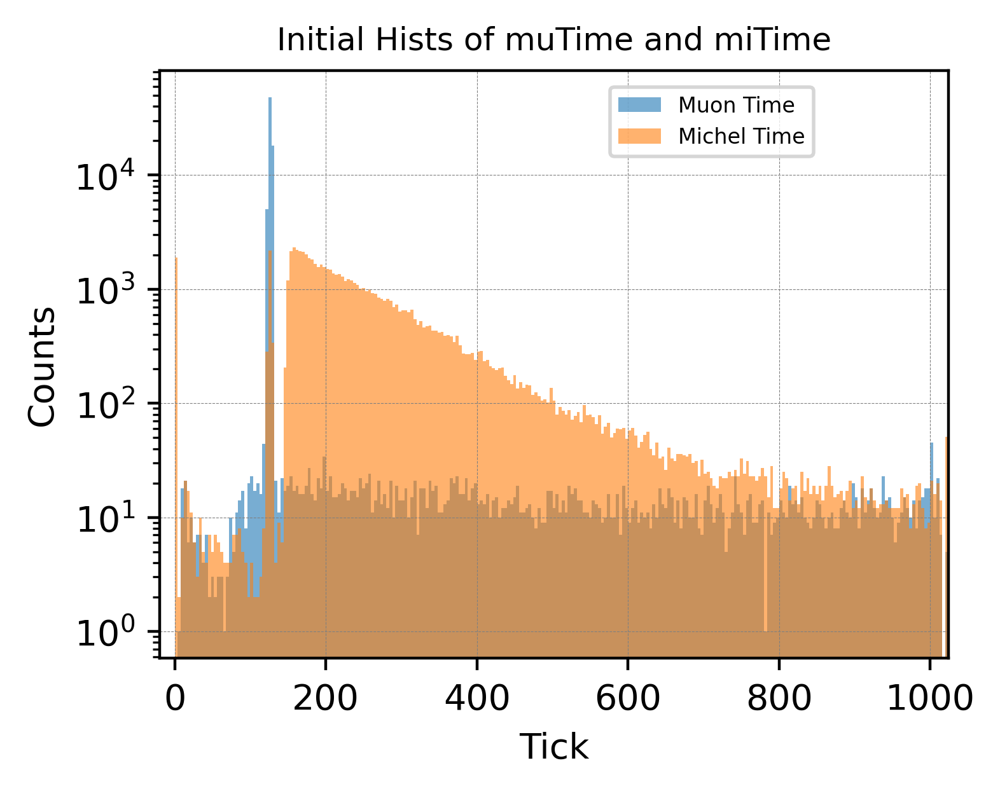

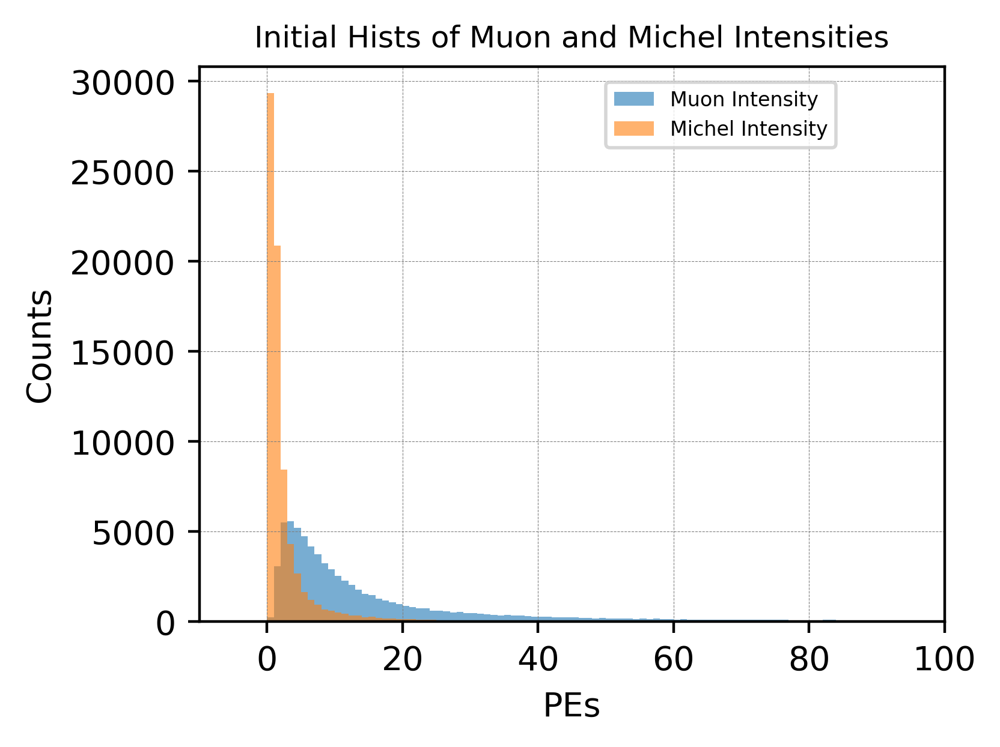

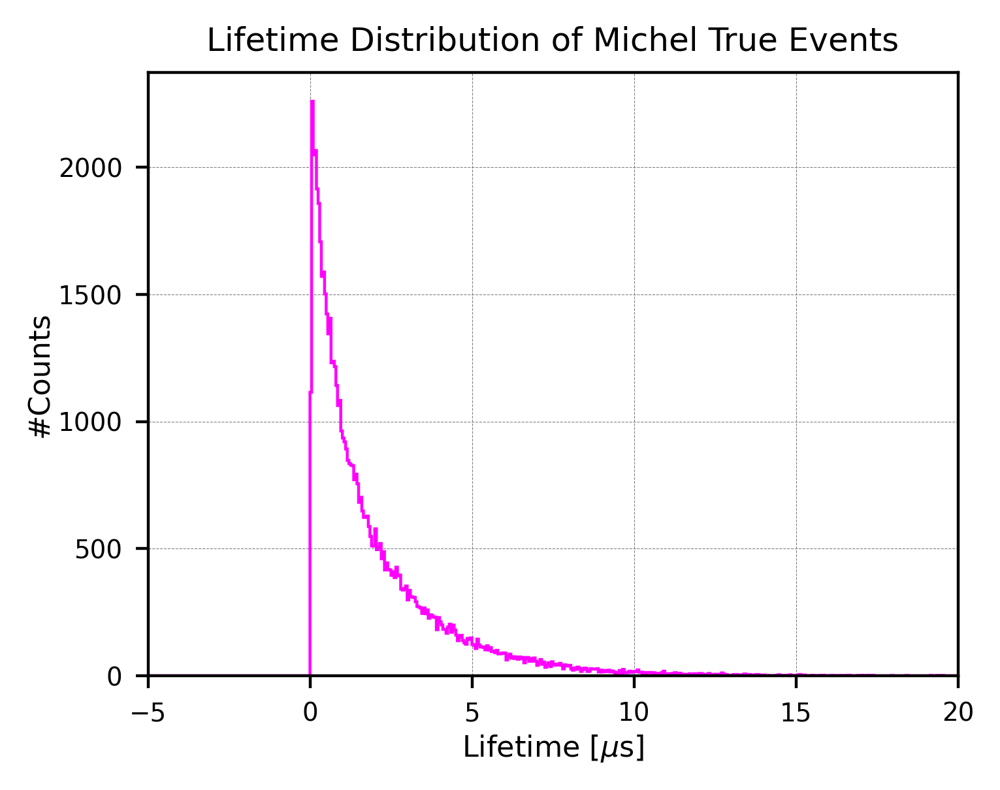

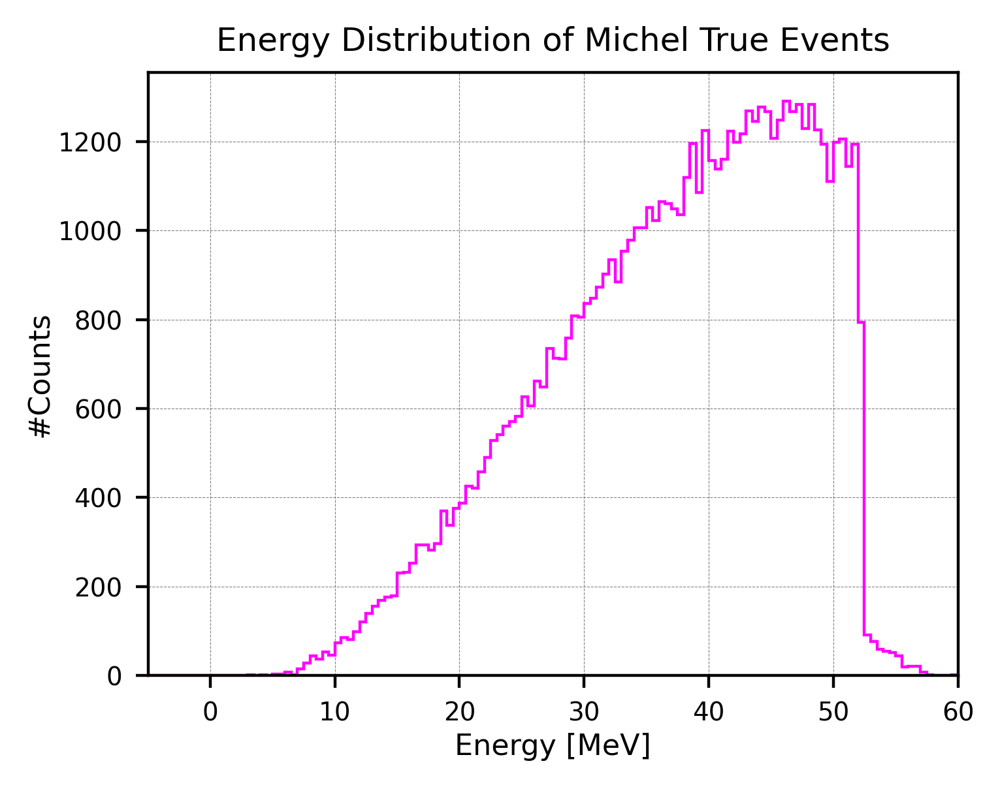

In [54]:
muon_time = [ev.muon_time for ev in events_reco_initial]
michel_time = [ev.michel_time for ev in events_reco_initial]

muon_intensity = [ev.muon_intensity for ev in events_reco_initial]
michel_intensity = [ev.michel_intensity for ev in events_reco_initial]

lifetime = [ev.lifetime for ev in events_true_initial] #true lifetime---
energy = [ev.energy for ev in events_true_initial] 


#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_time, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(michel_time, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Tick')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()




#Initial Mu and Michel intensity distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 100
bin_width_initial = 1  # You can change this value
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muon_intensity, bins=bins, alpha=0.6, label='Muon Intensity')
plt.hist(michel_intensity, bins=bins, alpha=0.6, label='Michel Intensity')

plt.xlabel('PEs')
plt.ylabel('Counts')
#plt.yscale('log')
plt.xlim(-10, 100)
plt.title('Initial Hists of Muon and Michel Intensities', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()







#True Lifetime distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = -20
range_max = 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(lifetime, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 20)
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distribution of Michel True Events', fontsize=9)
plt.show()  





#True Energy distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = -20
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(energy, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(-5, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 500)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Energy Distribution of Michel True Events', fontsize=9)
plt.show()  





<br />
<br />
<br />
<br />


### Purification / cut 2: remove abnormal muon signals (constrain muTime to [120, 130])

Muon events selection (mu peak constrained to [120, 130]):
Updated Muon events:  71520 (95.45%)
Length of time_difference (Updated):  71520

Michel purity:  64086 /  71520 (89.61%)


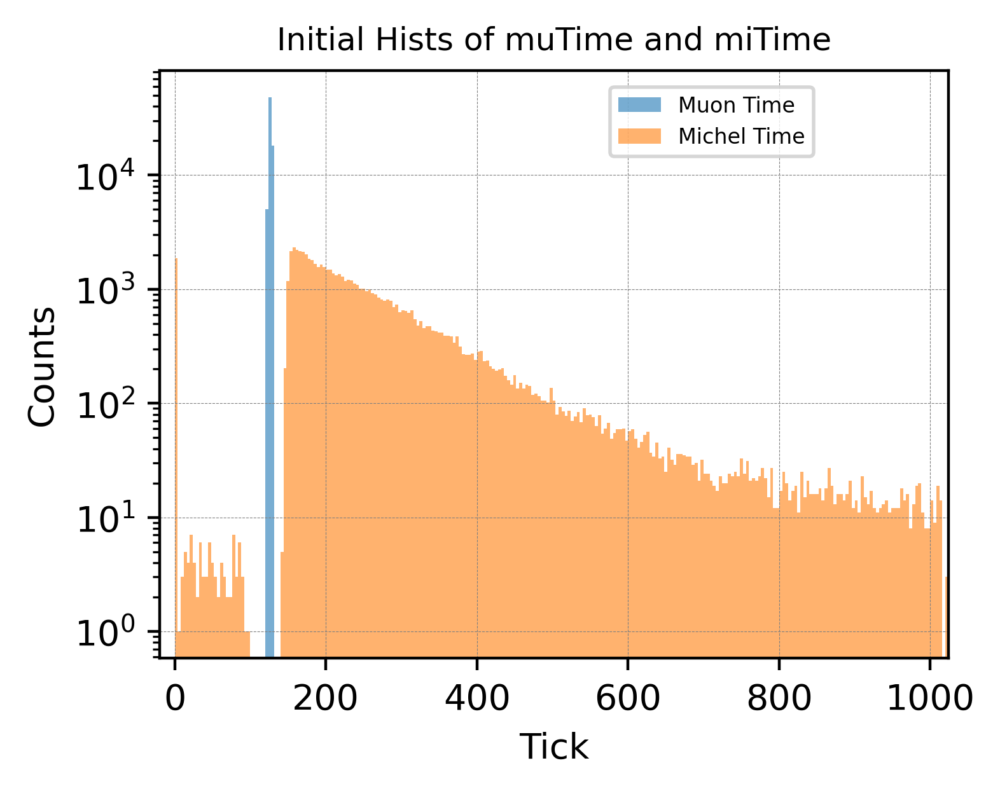




Lifetime distribution (Updated):
# Initial Candidates [-16000, 16000]:  71520


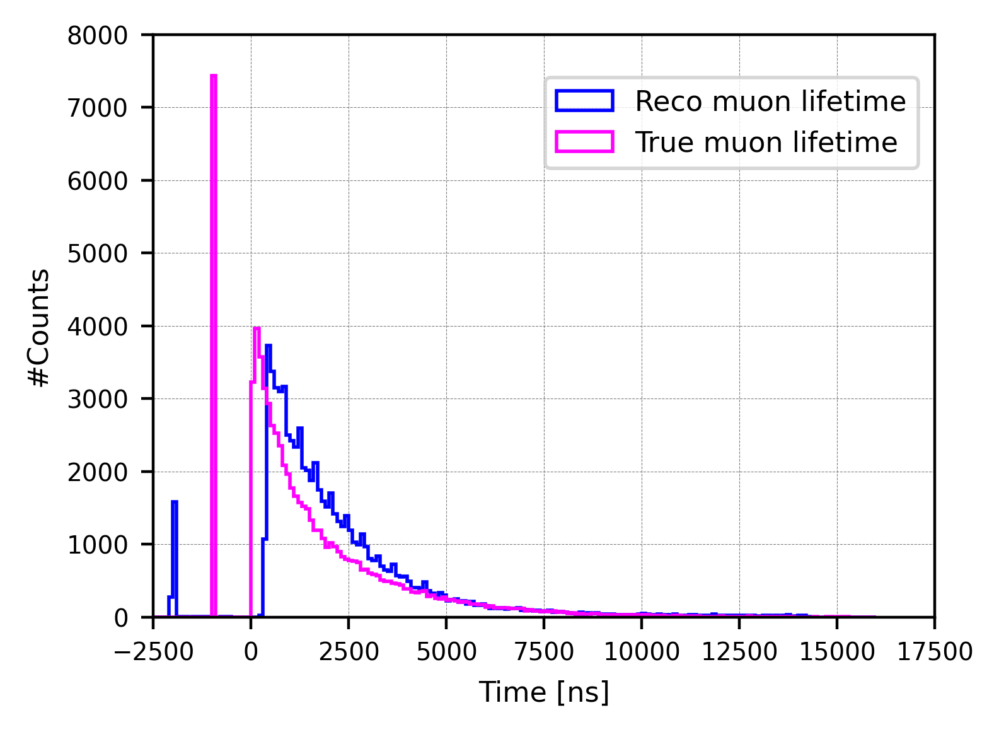

In [60]:
events_reco_update1 = []
events_true_update1 = []

lifetime_reco_update1 = []

for ev in events_reco_initial:
    muTime = ev.muon_time
    miTime = ev.michel_time
    energy = ev.energy

    if 120 <= muTime <= 130:
        events_reco_update1.append(ev)
        t = miTime-muTime
        lifetime_reco_update1.append(t)

        if energy > 0:
            events_true_update1.append(ev)


print("Muon events selection (mu peak constrained to [120, 130]):")
print("Updated Muon events: ", len(events_reco_update1),
       "({:.2f}%)".format(len(events_reco_update1)/len(events_reco_initial)*100))

# Element-wise subtraction: (mi - mu) for each corresponding element
print("Length of time_difference (Updated): ", len(lifetime_reco_update1))

print("\nMichel purity: ", len(events_true_update1), "/ ", len(events_reco_update1), 
      "({:.2f}%)".format(len(events_true_update1)/len(events_reco_update1)*100)) 









#Initial Mu and Michel time distributions=================================================
plt.figure(figsize=(4,3),dpi=400)

muTime_update = [ev.muon_time for ev in events_reco_update1]
miTime_update = [ev.michel_time for ev in events_reco_update1]


# Example: set your bin parameters
range_min_initial = 0
range_max_initial = 1024
bin_width_initial = 4  # You can change this value; default: 4
bins = np.arange(range_min_initial, range_max_initial + bin_width_initial, bin_width_initial)

# Plot histograms on the same canvas
plt.hist(muTime_update, bins=bins, alpha=0.6, label='Muon Time')
plt.hist(miTime_update, bins=bins, alpha=0.6, label='Michel Time')

plt.xlabel('Tick')
plt.ylabel('Counts')
plt.yscale('log')
plt.xlim(-20, 1024)
plt.title('Initial Hists of muTime and miTime', fontsize=9)

plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99), fontsize=9, markerscale=4, ncol=1, prop={'size':6})
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)

plt.show()









# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Convert to ns (assuming mu_lifetime is already defined)
timdeDiff_update_ns = [value * 16 for value in lifetime_reco_update1]#reco lifetime---

lifetime_true_update1 = [ev.lifetime for ev in events_reco_update1]
lifetime_update_ns = [value * 1000 for value in lifetime_true_update1]#True lifetime---


print("\n\n\nLifetime distribution (Updated):")
print("# Initial Candidates [-16000, 16000]: ", len(timdeDiff_update_ns))

# Define histogram parameters
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(timdeDiff_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')

plt.hist(lifetime_update_ns, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')


plt.xlim(-2500, 17500)
plt.ylim(0, 8000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()






<br />
<br />
<br />
<br />


### Purification / cut 3: remove events with unphysical lifetime (constrain lifetime to [500, inf))

#### (20251022): lifetime cut should be >0 here (we know later that 500 is NOT a good standard)




Lifetime distribution (Updated):
# Updated Candidates [0, 16000]:  69574

#Purity:  62266 / 69574 (89.50%)


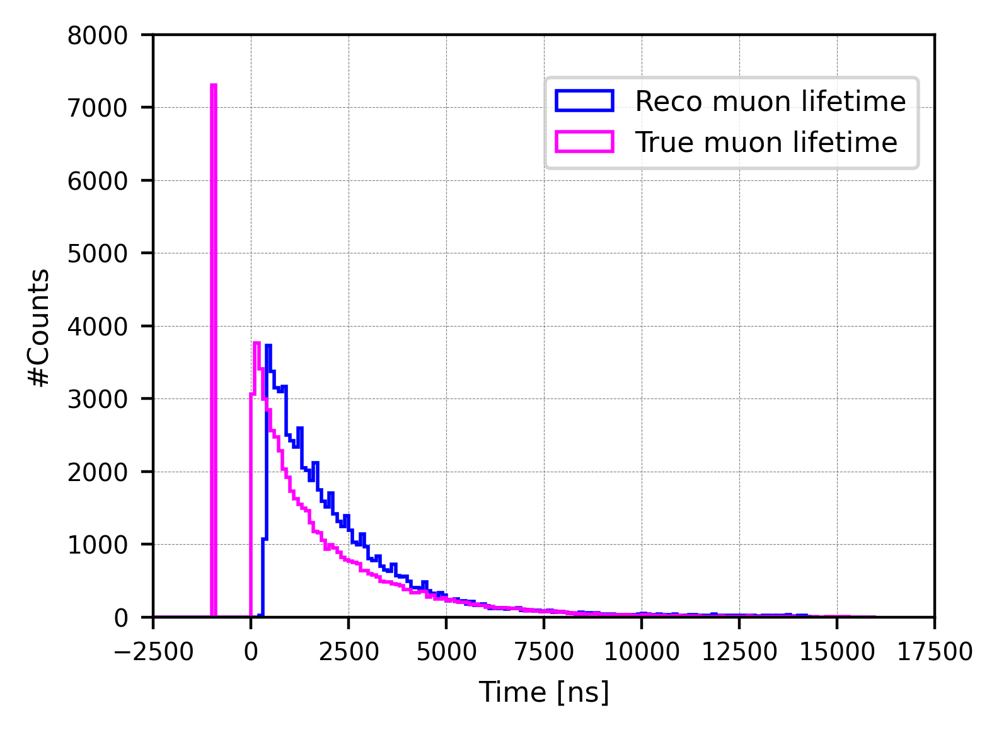


--------------------------------------
[-500, 500]:  38840 / 69574 (55.83%)


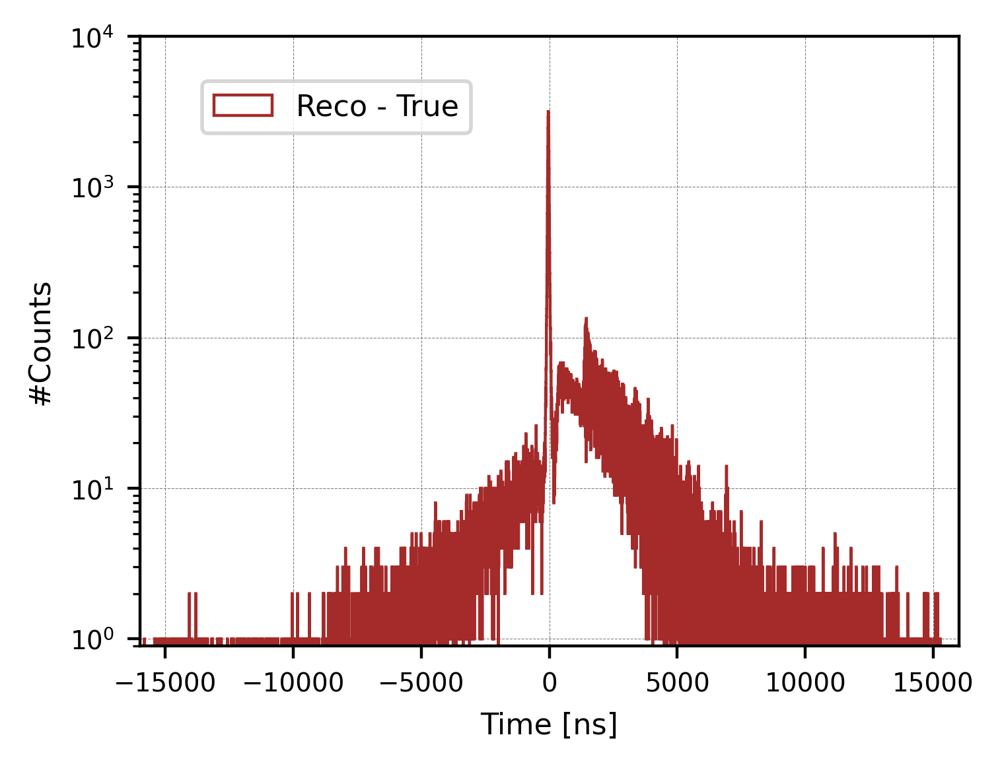



Explore the peak------


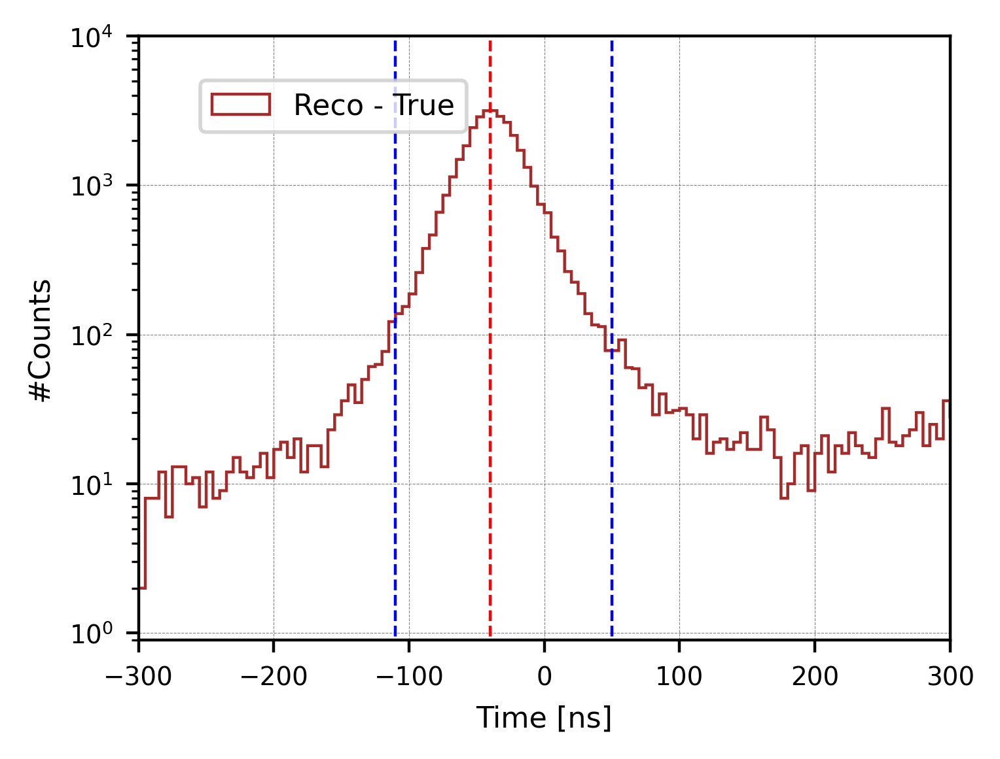

In [79]:
events_reco_update2 = []#Dataset after Purification 2---
events_true_update2 = []
lifetime_reco_update2 = []

for ev in events_reco_update1:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---
    e = ev.energy

    if 0 <= timeDiff: #keep physical events here---
        events_reco_update2.append(ev)
        lifetime_reco_update2.append(timeDiff)

        if e > 0:
            events_true_update2.append(ev)


print("\n\n\nLifetime distribution (Updated):")
print("# Updated Candidates [0, 16000]: ", len(events_reco_update2))

        
print("\n#Purity: ", len(events_true_update2), "/", len(events_reco_update2), 
     "({:.2f}%)".format(len(events_true_update2)/len(events_reco_update2)*100))







# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(lifetime_reco_update2, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')


lifetime_update_ns2 = [ev.lifetime * 1000 for ev in events_reco_update2]#True lifetime (contain false)---
plt.hist(lifetime_update_ns2, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')


plt.xlim(-2500, 17500)
plt.ylim(0, 8000)
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()







#---------------------------------------------------------------
#Reco True difference-------------------------------------------

diff_reco_true = []
for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---
    lifetime = ev.lifetime * 1000 #convert to ns---

    diff_reco_true.append(timeDiff-lifetime)


reco_true_count_500 = sum(-500 <= x <= 500 for x in diff_reco_true)
print("\n--------------------------------------")
print("[-500, 500]: ", reco_true_count_500, "/", len(diff_reco_true), 
     "({:.2f}%)".format(reco_true_count_500/len(diff_reco_true)*100))


#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 5
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')


plt.xlim(-16000, 16000)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()





#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

print("\n\nExplore the peak------")

# Plot histogram-----------------
plt.hist(diff_reco_true, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

plt.plot([-110, -110], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([50, 50], [0, 10000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([-40, -40], [0, 10000], color="red", linewidth=0.8, linestyle='--')

plt.xlim(-300, 300)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Ex=')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()

### Preliminary Lifetime fittings:

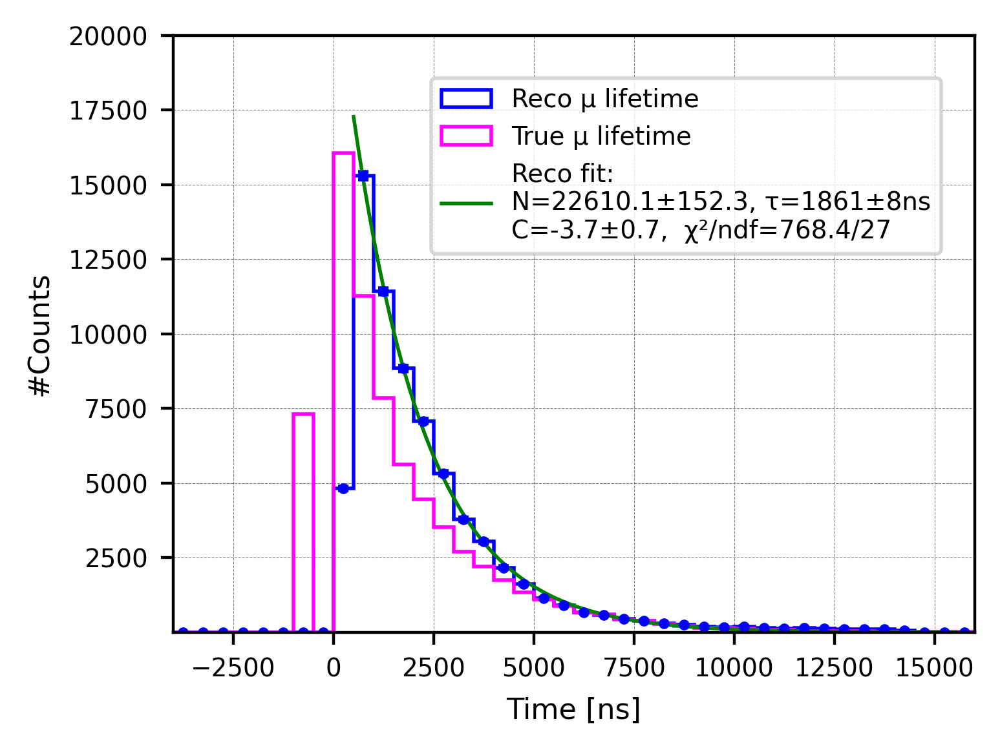

In [65]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt



#======Single Fitting==================================================
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 500
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histograms (Reco + True, but error bars only for Reco)
counts_reco, bin_edges_reco, _ = plt.hist(
    lifetime_reco_update2, bins=bins, range=(range_min, range_max),
    edgecolor='blue', histtype='step', linewidth=1.0,
    label='Reco μ lifetime'
)

# Add error bars for Reco
bin_centers_reco = 0.5 * (bin_edges_reco[:-1] + bin_edges_reco[1:])
errors_reco = np.sqrt(np.clip(counts_reco, 0, None))
plt.errorbar(
    bin_centers_reco, counts_reco, yerr=errors_reco,
    fmt='o', color='blue', markersize=2.0, elinewidth=0.8, capsize=1.5,
    label=None  # don’t duplicate legend entry
)

# True μ histogram
plt.hist(
    lifetime_update_ns2, bins=bins, range=(range_min, range_max),
    edgecolor='magenta', histtype='step', linewidth=1.0,
    label='True μ lifetime'
)

# ---------- add χ² fits with constant background ----------
def exp1C(t, N, tau, C):
    return N * np.exp(-t / tau) + C

def fit_and_overlay(sample, label, fit_min, fit_max, color=None, line_style='-'):
    # Use the SAME binning
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    # Select fit window
    m = (centers >= fit_min) & (centers <= fit_max)
    x = centers[m]
    y = counts[m].astype(float)

    if len(x) < 3 or y.sum() <= 0:
        print(f"[WARN] Not enough stats to fit {label}")
        return

    # Uncertainty per bin
    sigma = np.sqrt(np.clip(y, 1.0, None))

    # Initial guesses
    N0 = float(y.max())
    tau0 = max(100.0, (np.sum(y * (x - fit_min)) / max(np.sum(y), 1.0)))  # ns
    C0 = min(y)  # background level ~ lowest bin

    # Weighted least squares (χ²)
    popt, pcov = curve_fit(exp1C, x, y, p0=[N0, tau0, C0],
                           sigma=sigma, absolute_sigma=True, maxfev=20000)
    N_fit, tau_fit, C_fit = popt
    N_err, tau_err, C_err = np.sqrt(np.diag(pcov))

    # χ²/ndf
    yfit = exp1C(x, *popt)
    chi2 = np.sum(((y - yfit) / sigma) ** 2)
    ndf = max(len(x) - len(popt), 1)

    # Overlay smooth curve
    t_smooth = np.linspace(fit_min, fit_max, 400)
    plt.plot(
        t_smooth,
        exp1C(t_smooth, *popt),
        line_style,
        linewidth=1.0,
        color=color,
        label=(
            f"{label} fit:\n"
            f"N={N_fit:.1f}±{N_err:.1f}, τ={tau_fit:.0f}±{tau_err:.0f}ns\n"
            f"C={C_fit:.1f}±{C_err:.1f},  χ²/ndf={chi2:.1f}/{ndf}"
        ),
    )


# Fit windows
fit_and_overlay(lifetime_reco_update2, "Reco",  500, 15500, color="green", line_style='-')
#fit_and_overlay(lifetime_update_ns2, "True",     0, 15500, color="magenta")
# ---------- end fits ----------

plt.xlim(-4000, 16000)
plt.ylim(0.1, 20000)
#plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=9,
           markerscale=5, ncol=1, prop={'size':7})
plt.show()


#### Bin-integrated Fitting (best)

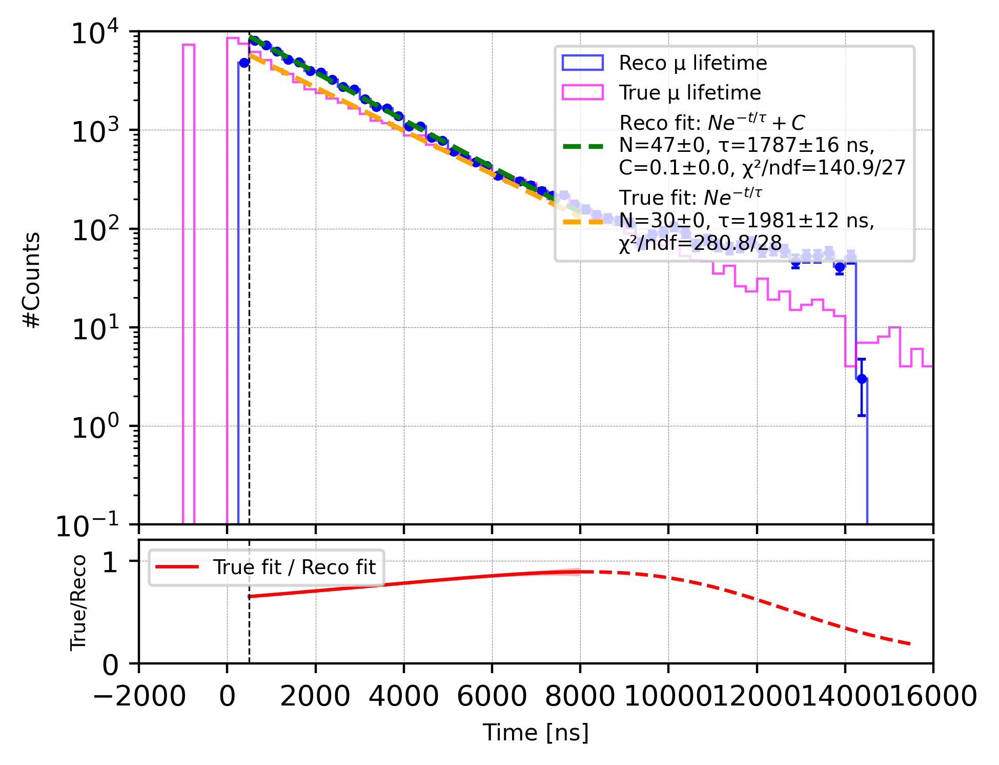

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from matplotlib.gridspec import GridSpec

#======Double Fitting with Ratio Panel==================================================
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

# Histogram binning
bin_width = 250
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# --- Bin-integrated models ---
def exp1_integrated(edges, N, tau):
    a, b = edges[:-1], edges[1:]
    return N * tau * (np.exp(-a/tau) - np.exp(-b/tau))

def exp1C_integrated(edges, N, tau, C):
    a, b = edges[:-1], edges[1:]
    return N * tau * (np.exp(-a/tau) - np.exp(-b/tau)) + C * (b - a)

# --- Helpers ---
def _safe_sigma(y):
    return np.sqrt(np.clip(y, 1.0, None))

def numerical_grad(func, params, cov, x, h=1e-6):
    """Compute propagated uncertainty for func(x,*params) given parameter covariance."""
    f0 = func(x, *params)
    nparams = len(params)
    grads = np.zeros((nparams, len(x)))

    # finite difference for each parameter
    for i in range(nparams):
        dp = np.zeros_like(params, dtype=float)
        dp[i] = h * (abs(params[i]) + 1.0)
        f1 = func(x, *(params+dp))
        f2 = func(x, *(params-dp))
        grads[i] = (f1 - f2) / (2*dp[i])

    # propagate covariance: per point variance
    var = np.zeros(len(x))
    for k in range(len(x)):
        gk = grads[:, k]               # gradient at point k
        var[k] = gk @ cov @ gk         # g^T Cov g
    return np.sqrt(var)


# --- Reco fit: N*exp(-t/tau) + C ---
def fit_and_overlay_exp1C(ax, sample, label, fit_min, fit_max, color=None, line_style='--'):
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    m = (centers >= fit_min) & (centers <= fit_max)
    y = counts[m]

    if len(y) < 3 or y.sum() <= 0:
        return None, None, None, None

    edges_fit = bin_edges[np.where(m)[0][0] : np.where(m)[0][-1] + 2]
    sigma = _safe_sigma(y)

    N0 = np.sum(y); tau0 = 2000.0; C0 = np.min(y)/max(bin_width,1)
    p0 = [N0, tau0, C0]

    popt, pcov = curve_fit(
        lambda e, N, tau, C: exp1C_integrated(e, N, tau, C),
        edges_fit, y, p0=p0, sigma=sigma,
        absolute_sigma=True, maxfev=20000
    )
    perr = np.sqrt(np.diag(pcov))

    chi2 = np.sum(((y - exp1C_integrated(edges_fit, *popt))/sigma)**2)
    ndf = len(y) - len(popt)

    t_smooth = np.linspace(fit_min, fit_max, 400)
    y_smooth = popt[0]*np.exp(-t_smooth/popt[1])*bin_width + popt[2]*bin_width

    ax.plot(t_smooth, y_smooth, line_style, linewidth=1.7, color=color, zorder=5,
            label=(rf"{label} fit: $Ne^{{-t/\tau}} + C$"
                   f"\nN={popt[0]:.0f}±{perr[0]:.0f}, "
                   f"τ={popt[1]:.0f}±{perr[1]:.0f} ns, "
                   f"\nC={popt[2]:.1f}±{perr[2]:.1f}, "
                   f"χ²/ndf={chi2:.1f}/{ndf}"))

    return t_smooth, y_smooth, popt, pcov

# --- True fit: N*exp(-t/tau) ---
def fit_and_overlay_exp1(ax, sample, label, fit_min, fit_max, color=None):
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    m = (centers >= fit_min) & (centers <= fit_max)
    y = counts[m]

    if len(y) < 3 or y.sum() <= 0:
        return None, None, None, None

    edges_fit = bin_edges[np.where(m)[0][0] : np.where(m)[0][-1] + 2]
    sigma = _safe_sigma(y)

    N0 = np.sum(y); tau0 = 2000.0
    p0 = [N0, tau0]

    popt, pcov = curve_fit(
        lambda e, N, tau: exp1_integrated(e, N, tau),
        edges_fit, y, p0=p0, sigma=sigma,
        absolute_sigma=True, maxfev=20000
    )
    perr = np.sqrt(np.diag(pcov))

    chi2 = np.sum(((y - exp1_integrated(edges_fit, *popt))/sigma)**2)
    ndf = len(y) - len(popt)

    t_smooth = np.linspace(fit_min, fit_max, 400)
    y_smooth = popt[0]*np.exp(-t_smooth/popt[1])*bin_width

    ax.plot(t_smooth, y_smooth, linestyle='--', linewidth=1.7, color=color, zorder=5,
            label=(rf"{label} fit: $Ne^{{-t/\tau}}$"
                   f"\nN={popt[0]:.0f}±{perr[0]:.0f}, "
                   f"τ={popt[1]:.0f}±{perr[1]:.0f} ns, "
                   f"\nχ²/ndf={chi2:.1f}/{ndf}"))

    return t_smooth, y_smooth, popt, pcov

# -------- Top panel --------
ax1 = fig.add_subplot(gs[0])

# Histograms (faint outlines) + errors
counts_reco, bin_edges_reco, _ = ax1.hist(
    lifetime_reco_update2, bins=bins, range=(range_min, range_max),
    edgecolor='blue', histtype='step', linewidth=0.8, alpha=0.7,
    label='Reco μ lifetime', zorder=1
)
bin_centers_reco = 0.5*(bin_edges_reco[:-1]+bin_edges_reco[1:])
ax1.errorbar(bin_centers_reco, counts_reco,
             yerr=np.sqrt(np.clip(counts_reco,0,None)),
             fmt='o', color='blue', markersize=2.5,
             elinewidth=0.8, capsize=1.5, zorder=3)

ax1.hist(lifetime_update_ns2, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=0.8,
         alpha=0.7, label='True μ lifetime', zorder=1)

# Fits
t_reco, fit_reco, popt_reco, pcov_reco = fit_and_overlay_exp1C(ax1, lifetime_reco_update2, "Reco",
                                                               500, 8000, color="green")
t_true, fit_true, popt_true, pcov_true = fit_and_overlay_exp1(ax1, lifetime_update_ns2, "True",
                                                              500, 8000, color="orange")

# Style
ax1.set_xlim(-2000, 16000)
ax1.tick_params(labelbottom=False)
ax1.set_ylim(0.1, 10000)
ax1.set_yscale('log')
ax1.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax1.set_ylabel('#Counts', fontsize=8)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.75, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

# -------- Bottom panel (ratio) --------
ax2 = fig.add_subplot(gs[1], sharex=ax1)
if (popt_reco is not None) and (popt_true is not None):
    t_common = np.linspace(500, 15500, 400)

    f_reco = lambda x, N, tau, C: N*np.exp(-x/tau)*bin_width + C*bin_width
    f_true = lambda x, N, tau: N*np.exp(-x/tau)*bin_width

    fit_reco_common = f_reco(t_common, *popt_reco)
    fit_true_common = f_true(t_common, *popt_true)
    ratio = np.divide(fit_true_common, fit_reco_common,
                      out=np.zeros_like(fit_true_common),
                      where=(fit_reco_common>0))

    # --- Error bands (only valid in fit range ≤ 8000) ---
    sigma_true = numerical_grad(f_true, np.array(popt_true), pcov_true, t_common)
    sigma_reco = numerical_grad(f_reco, np.array(popt_reco), pcov_reco, t_common)
    sigma_ratio = np.sqrt((sigma_true/fit_reco_common)**2 +
                          (fit_true_common * sigma_reco / fit_reco_common**2)**2)

    mask_fit = t_common <= 8000
    mask_extrap = t_common > 8000

    # Plot ratio: solid inside fit range, dashed outside
    ax2.plot(t_common[mask_fit], ratio[mask_fit],
             color='red', linewidth=1.2, label='True fit / Reco fit')
    ax2.plot(t_common[mask_extrap], ratio[mask_extrap],
             color='red', linewidth=1.2, linestyle='--')

    # Fill band only in fit range
    ax2.fill_between(t_common[mask_fit],
                     ratio[mask_fit] - sigma_ratio[mask_fit],
                     ratio[mask_fit] + sigma_ratio[mask_fit],
                     color='red', alpha=0.3, linewidth=0)

ax2.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax2.set_xlim(-2000, 16000)
ax2.set_ylim(0.0, 1.2)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('True/Reco', fontsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(fontsize=7, loc='upper left')

plt.show()


<br />
<br />
<br />
<br />
<br />
<br />
<br />

## Explore Dataset After purification 3 [RecoT>0]:

In [81]:
@dataclass
class PdsEventNew: #new class containing reco lifetime, true lifetime & diff
    muon_time: Optional[int] = None
    michel_time: Optional[int] = None
    muon_intensity: Optional[float] = None
    michel_intensity: Optional[float] = None
    third_intensity: Optional[float] = None
    posX: Optional[float] = None
    posY: Optional[float] = None
    posZ: Optional[float] = None
    energy: Optional[float] = None
    lifetime: Optional[float] = None #in unit of us---
    pdg: Optional[int] = None
    eventID: Optional[int] = None
    trackID: Optional[int] = None
    date: Optional[int] = None 
    michel_score: Optional[float] = None         # ✅ NEW
    michel_hits: Optional[int] = None 
    reco_lifetime: Optional[float] = None
    true_lifetime: Optional[float] = None # in unit of ns---
    diff_lifetime: Optional[float] = None
    michel_rise: Optional[float] = None
    michel_drop: Optional[float] = None



#Test print---------------
print("Size of events_reco_update2 (previous class): ", len(events_reco_update2))

#New calculated reco & true lifetime lists:
recoLife_update2 = []
trueLife_update2 = []  
diffLife_update2 = []

michel_rise_slope = []
michel_drop_slope = []

for ev in events_reco_update2:
    muTime = ev.muon_time
    miTime = ev.michel_time
    timeDiff = (miTime - muTime) * 16 #convert from tick to ns---

    recoLife_update2.append(timeDiff)
    trueLife_update2.append(ev.lifetime * 1000)
    diffLife_update2.append(timeDiff - ev.lifetime * 1000)

    left_slope = ev.mi_leftHeight / (miTime - ev.mi_leftTurn)
    right_slope = ev.mi_rightHeight / (ev.mi_rightTurn - miTime)

#    left_slope = (miTime - ev.mi_leftTurn)
#    right_slope = (ev.mi_rightTurn - miTime)

    michel_rise_slope.append(left_slope)
    michel_drop_slope.append(right_slope)

print("Size of lifetime_reco_update2               : ", len(recoLife_update2))
print("Size of lifetime_update_ns2                 : ", len(trueLife_update2))



#Final events with new features----------
events_newClass = []
for ev, reco_life, true_life, diff_life, rise, drop in zip(
    events_reco_update2, 
    recoLife_update2, 
    trueLife_update2, 
    diffLife_update2,
    michel_rise_slope,
    michel_drop_slope
    ):
    new_ev = PdsEventNew(
        muon_time=ev.muon_time,
        michel_time=ev.michel_time,
        muon_intensity=ev.muon_intensity,
        michel_intensity=ev.michel_intensity,
        third_intensity=ev.third_intensity,
        posX=ev.posX,
        posY=ev.posY,
        posZ=ev.posZ,
        energy=ev.energy,
        lifetime=ev.lifetime,
        pdg=ev.pdg,
        eventID=ev.eventID,
        trackID=ev.trackID,
        date=ev.date,
        michel_score=ev.michel_score,
        michel_hits=ev.michel_hits, 
        reco_lifetime=reco_life,
        true_lifetime=true_life,
        diff_lifetime=diff_life,
        michel_rise=rise,
        michel_drop=drop
    )
    events_newClass.append(new_ev)

print("\nLength of final dataset in format of new class: ", len(events_newClass))


events_diff500 = []
events_diff0 = []
true_newClass = []
for ev in events_newClass:
    if ev.energy > 0:
        true_newClass.append(ev)

#===========================================================================
    if ev.diff_lifetime > 50 or ev.diff_lifetime < -110:
        events_diff500.append(ev)
    if -110 < ev.diff_lifetime < 50:
        events_diff0.append(ev)
#===========================================================================

print("\nLength of final true in format of new class: ", len(true_newClass))

print("\nEvents with diff [-110, 50] : ", len(events_diff0), "/", len(events_newClass),
       "({:.2f}%)".format(len(events_diff0)/len(events_newClass)*100))
print("\nEvents with diff OTHERS: ", len(events_diff500), "/", len(events_newClass),
       "({:.2f}%)".format(len(events_diff500)/len(events_newClass)*100))


Size of events_reco_update2 (previous class):  69574
Size of lifetime_reco_update2               :  69574
Size of lifetime_update_ns2                 :  69574

Length of final dataset in format of new class:  69574

Length of final true in format of new class:  62266

Events with diff [-110, 50] :  34201 / 69574 (49.16%)

Events with diff OTHERS:  35373 / 69574 (50.84%)


### Purification 4:  Michel Intensity / Muon Intensity:

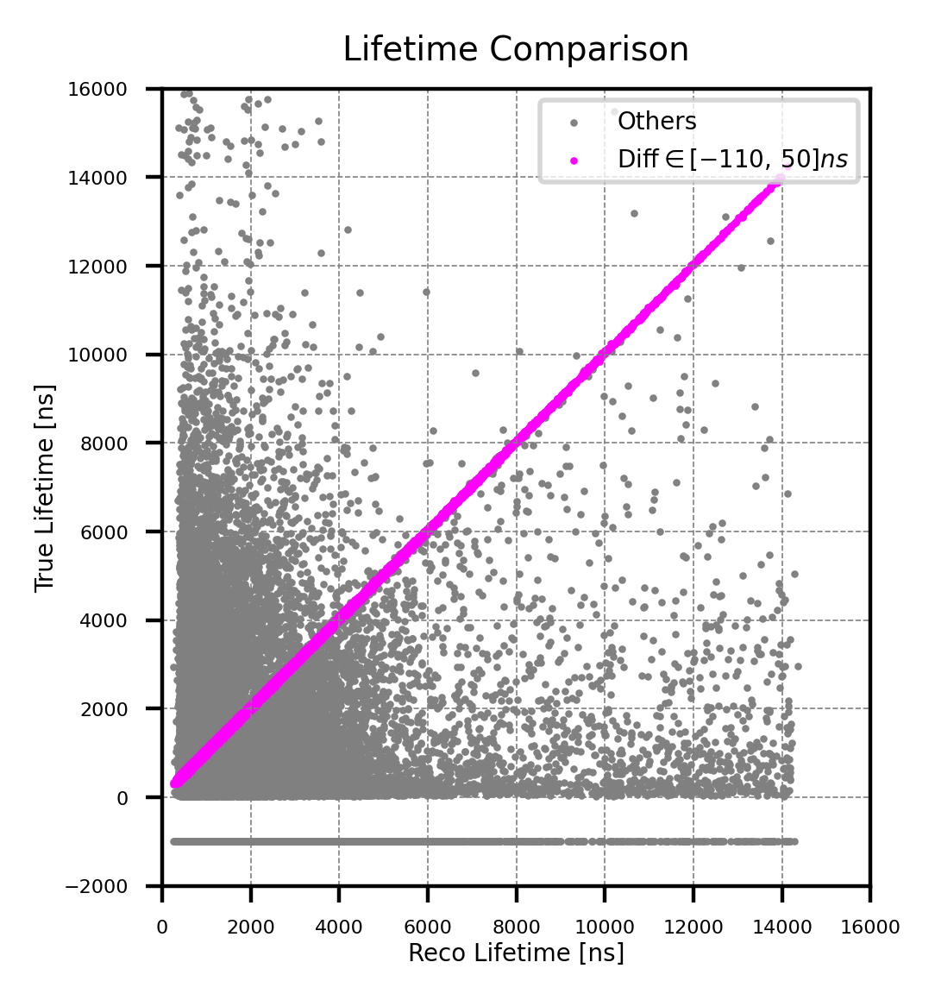

After lifetime cut (cut 3):
Purity (true / reco):  62266 / 69574 (89.50%)

(Diff [-110, 50]):  34201 / 69574 (49.16%)
(Diff OTHERS)    :  35373 / 69574 (50.84%)

(michel Intensity) / (muon intensity) (Cut 4):----------
Efficiency (cut4 / cut3):  37334 / 69574 (53.66%)
Purity (true / reco):  35866 / 37334 (96.07%)

(Diff [-110, 50]):  24457 / 37334 (65.51%)
(Diff Others)    :  12877 / 37334 (34.49%)


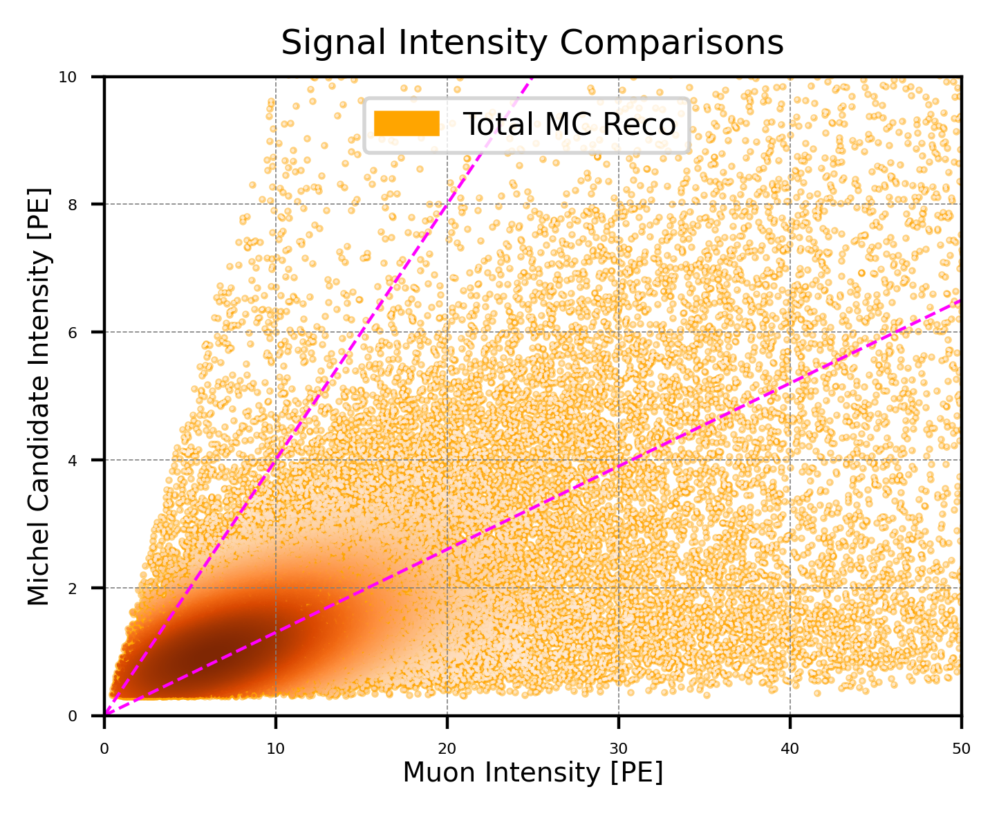


Purify 4----------------------


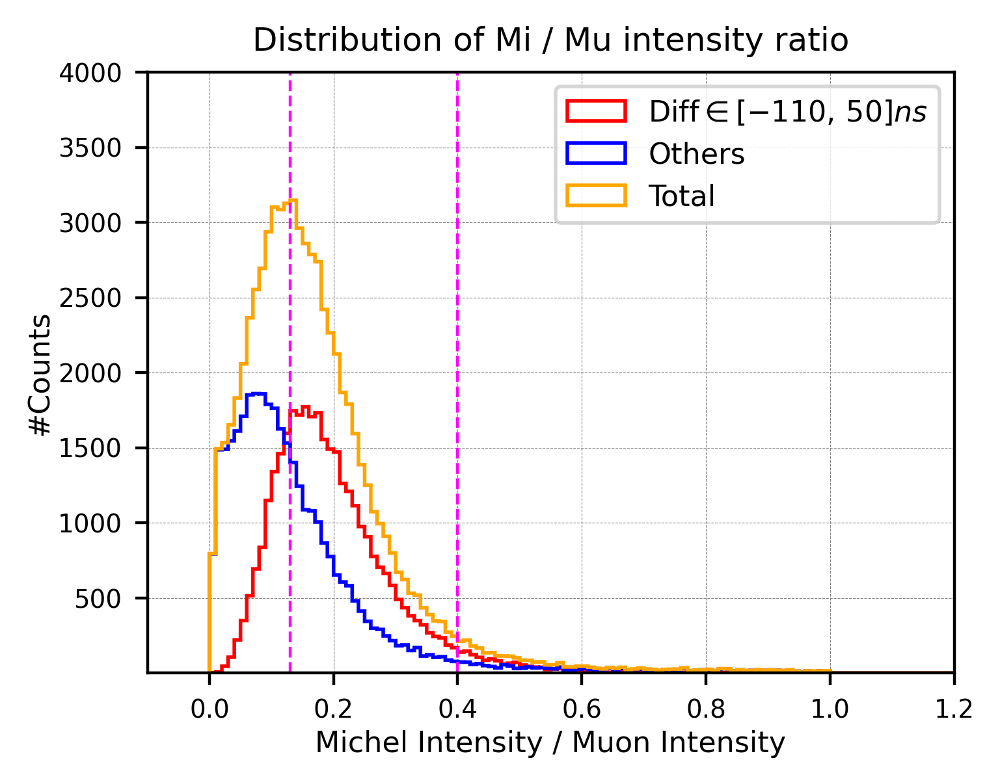

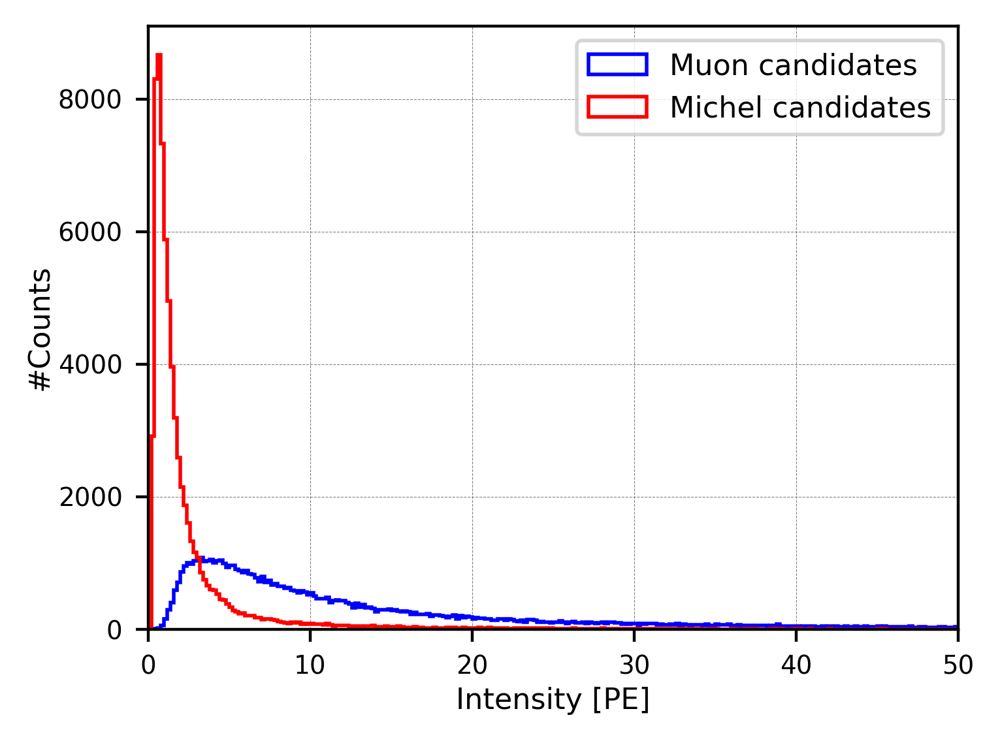

In [162]:
from scipy.stats import gaussian_kde
from matplotlib import colors 
import matplotlib.patches as mpatches

trueLife_diff500 = [ev.true_lifetime for ev in events_diff500]
recoLife_diff500 = [ev.reco_lifetime for ev in events_diff500]
muInt_diff500 = [ev.muon_intensity for ev in events_diff500]
miInt_diff500 = [ev.michel_intensity for ev in events_diff500]
X_diff500 = [ev.posX for ev in events_diff500]

trueLife_diff0 = [ev.true_lifetime for ev in events_diff0]
recoLife_diff0 = [ev.reco_lifetime for ev in events_diff0]
muInt_diff0 = [ev.muon_intensity for ev in events_diff0]
miInt_diff0 = [ev.michel_intensity for ev in events_diff0]
X_diff0 = [ev.posX for ev in events_diff0]

# Total---
muInt_total = [ev.muon_intensity for ev in events_newClass]
miInt_total = [ev.michel_intensity for ev in events_newClass]


# ==========================================================
# TrueLife VS RecoLife
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(recoLife_diff500, trueLife_diff500, s=0.3, c='grey', alpha=1.0, label="Others")
plt.scatter(recoLife_diff0, trueLife_diff0, s=0.3, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#-----------------------

plt.axis('scaled')
plt.xlim(0, 16000)
plt.ylim(-2000, 16000)
plt.ylabel('True Lifetime [ns]', labelpad=1, fontsize=5)
plt.xlabel('Reco Lifetime [ns]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(fontsize=5, loc="upper right")
plt.show()








#Michel Intensity Cut (Cut 4)================================================
print("After lifetime cut (cut 3):")

n_valid = sum(1 for ev in events_newClass if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_newClass),
      "({:.2f}%)".format(n_valid/len(events_newClass)*100))

print("\n(Diff [-110, 50]): ", len(events_diff0), "/", len(events_newClass),
       "({:.2f}%)".format(len(events_diff0)/len(events_newClass)*100))
print("(Diff OTHERS)    : ", len(muInt_diff500), "/", len(events_newClass),
       "({:.2f}%)".format(len(muInt_diff500)/len(events_newClass)*100))



thre1 = 6.5 / 50
thre2 = 40 / 100

# filter the actual events
events_diff0_purify4 = [
    ev for ev in events_diff0
    if ev.muon_intensity != 0 and thre1 < ev.michel_intensity / ev.muon_intensity < thre2
]
events_diff500_purify4 = [
    ev for ev in events_diff500
    if ev.muon_intensity != 0 and thre1 < ev.michel_intensity / ev.muon_intensity < thre2
]
#-------------------------------

print("\n(michel Intensity) / (muon intensity) (Cut 4):----------")
events_total_purify4 = events_diff0_purify4 + events_diff500_purify4

print("Efficiency (cut4 / cut3): ", len(events_total_purify4), "/", len(events_newClass),
      "({:.2f}%)".format(len(events_total_purify4)/len(events_newClass)*100))

n_valid = sum(1 for ev in events_total_purify4 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_total_purify4),
      "({:.2f}%)".format(n_valid/len(events_total_purify4)*100))

print("\n(Diff [-110, 50]): ", len(events_diff0_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff0_purify4)/len(events_total_purify4)*100))
print("(Diff Others)    : ", len(events_diff500_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff500_purify4)/len(events_total_purify4)*100))










# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff500), np.array(miInt_diff500)
x2, y2 = np.array(muInt_diff0), np.array(miInt_diff0)
x3, y3 = np.array(muInt_total), np.array(miInt_total)#total---
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Density for group total ---
xy3 = np.vstack([x3, y3])
z3 = gaussian_kde(xy3)(xy3)
idx3 = z3.argsort()
x3, y3, z3 = x3[idx3], y3[idx3], z3[idx3]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
#plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
#plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x3, y3, s=0.8, color="orange", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
#plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x3, y3, c=z3, s=0.8, cmap="Oranges", alpha=0.8, edgecolors="none", label="MC Reco Total")
#---------------------------------

plt.plot([0, 500], [0, 65], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 1000], [0, 400], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50)#(-5, 400)
plt.ylim(0, 10)#(-5, 60)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
#red_patch = mpatches.Patch(color="blue", label="Others")
#blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
#           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

orange_patch = mpatches.Patch(color="orange", label="Total MC Reco")
plt.legend(handles=[orange_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()






#Ratio distribution===================================
print("\nPurify 4----------------------")

ratio_diff500_purify3 = [mi / mu for mi, mu in zip(miInt_diff500, muInt_diff500) if mu != 0]
ratio_diff0_purify3 = [mi / mu for mi, mu in zip(miInt_diff0, muInt_diff0) if mu != 0]
ratio_total_purify3 = [mi / mu for mi, mu in zip(miInt_total, muInt_total) if mu != 0]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff0_purify3, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(ratio_diff500_purify3, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")
plt.hist(ratio_total_purify3, bins=bins, range=(range_min, range_max), edgecolor='orange', 
         histtype='step', linewidth=1.0, label="Total")

plt.plot([0.13, 0.13], [0, 4000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.4, 0.4], [0, 4000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 1.2)
plt.xlabel('Michel Intensity / Muon Intensity', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 4000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 





#Single Intensities===================================

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.2
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_total, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Muon candidates")
plt.hist(miInt_total, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label="Michel candidates")

#plt.plot([1, 1], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([4, 4], [0, 400000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(0, 50)
plt.xlabel('Intensity [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 30000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
#plt.title('Distribution of Mi / Mu intensity ratio', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 


#### Cut 5: Michel intensity & Muon intensity: 

After cut 4):
Purity (true / reco):  35866 / 37334 (96.07%)

(Diff 【-110, 50】:  24457 / 37334 (65.51%)
(Diff Others     :  12877 / 37334 (34.49%)

Michel Intensity Cut (Cut 5):--------------
Efficiency (cut5 / cut4):  26085 / 37334 (69.87%)
Purity (true / reco)    :  25088 / 26085 (96.18%)

(Diff [-110, 50]:  20645 / 26085 (79.15%)
(Diff OTHERS    :  5440 / 26085 (20.85%)


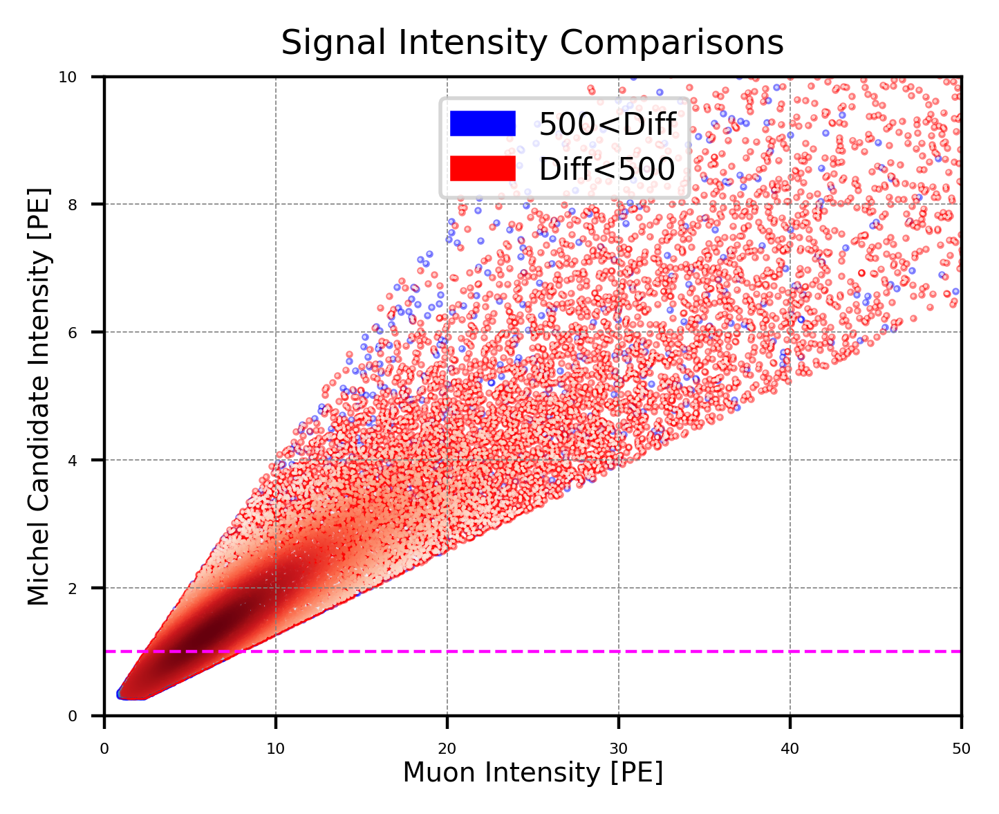


Purify 5----------------------


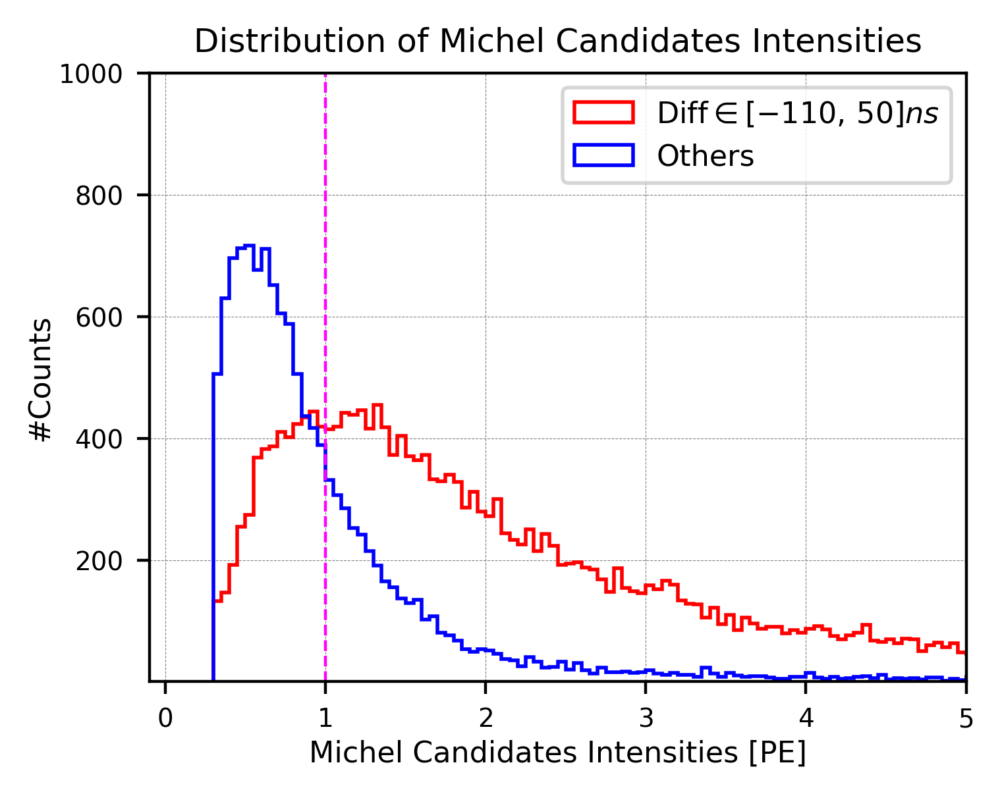

In [87]:
#Michel & Muon Intensities Cut (Cut 5)================================================
print("After cut 4):")

n_valid = sum(1 for ev in events_total_purify4 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco): ", n_valid, "/", len(events_total_purify4),
      "({:.2f}%)".format(n_valid/len(events_total_purify4)*100))

print("\n(Diff 【-110, 50】: ", len(events_diff0_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff0_purify4)/len(events_total_purify4)*100))
print("(Diff Others     : ", len(events_diff500_purify4), "/", len(events_total_purify4),
       "({:.2f}%)".format(len(events_diff500_purify4)/len(events_total_purify4)*100))



thre_muInt = 0.3 # mu Int will automatically higher than mi---
thre_miInt = 0.9

# filter the actual events
events_diff0_purify5 = [
    ev for ev in events_diff0_purify4
    if thre_miInt < ev.michel_intensity and thre_muInt < ev.muon_intensity
]
events_diff500_purify5 = [
    ev for ev in events_diff500_purify4
    if thre_miInt < ev.michel_intensity and thre_muInt < ev.muon_intensity
]
#-------------------------------

print("\nMichel Intensity Cut (Cut 5):--------------")

events_total_purify5 = events_diff0_purify5 + events_diff500_purify5

print("Efficiency (cut5 / cut4): ", len(events_total_purify5), "/", len(events_total_purify4),
      "({:.2f}%)".format(len(events_total_purify5)/len(events_total_purify4)*100))

n_valid = sum(1 for ev in events_total_purify5 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5),
      "({:.2f}%)".format(n_valid/len(events_total_purify5)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff0_purify5)/len(events_total_purify5)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff500_purify5)/len(events_total_purify5)*100))







# ==========================================================
# Mu Intensity VS Michel Intensity
# ==========================================================
muInt_diff500_purify4 = [ev.muon_intensity for ev in events_diff500_purify4]#Events after purification 4---
miInt_diff500_purify4 = [ev.michel_intensity for ev in events_diff500_purify4]

muInt_diff0_purify4 = [ev.muon_intensity for ev in events_diff0_purify4]
miInt_diff0_purify4 = [ev.michel_intensity for ev in events_diff0_purify4]



plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(muInt_diff500_purify4), np.array(miInt_diff500_purify4)
x2, y2 = np.array(muInt_diff0_purify4), np.array(miInt_diff0_purify4)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")

#---------------------------------

plt.plot([0, 100], [1.0, 1.0], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 50)
plt.ylim(0, 10)
plt.xlabel('Muon Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Michel Candidate Intensity [PE]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="500<Diff")
blue_patch = mpatches.Patch(color="red", label="Diff<500")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})


plt.show()







#Michel Intensity distribution===================================
print("\nPurify 5----------------------")

#miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
#miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 10
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(miInt_diff0_purify4, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(miInt_diff500_purify4, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([1.0, 1.0], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 5)
plt.xlabel('Michel Candidates Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Michel Candidates Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





#### Mu & Michel intensity distributions after Cut 5:

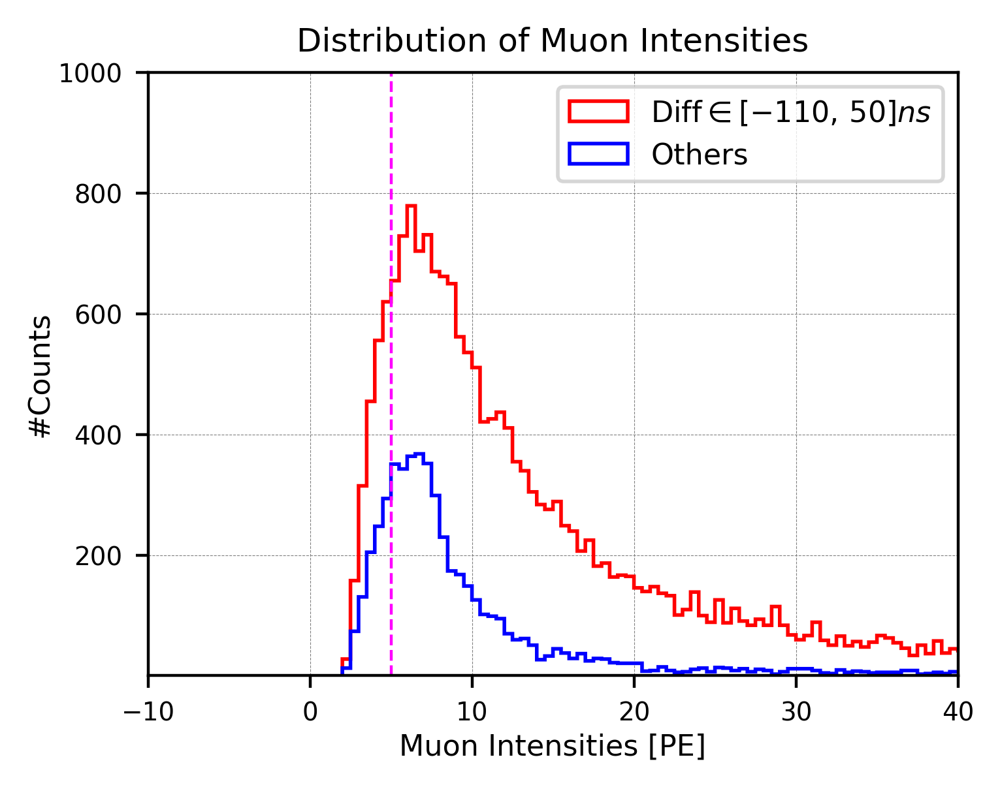

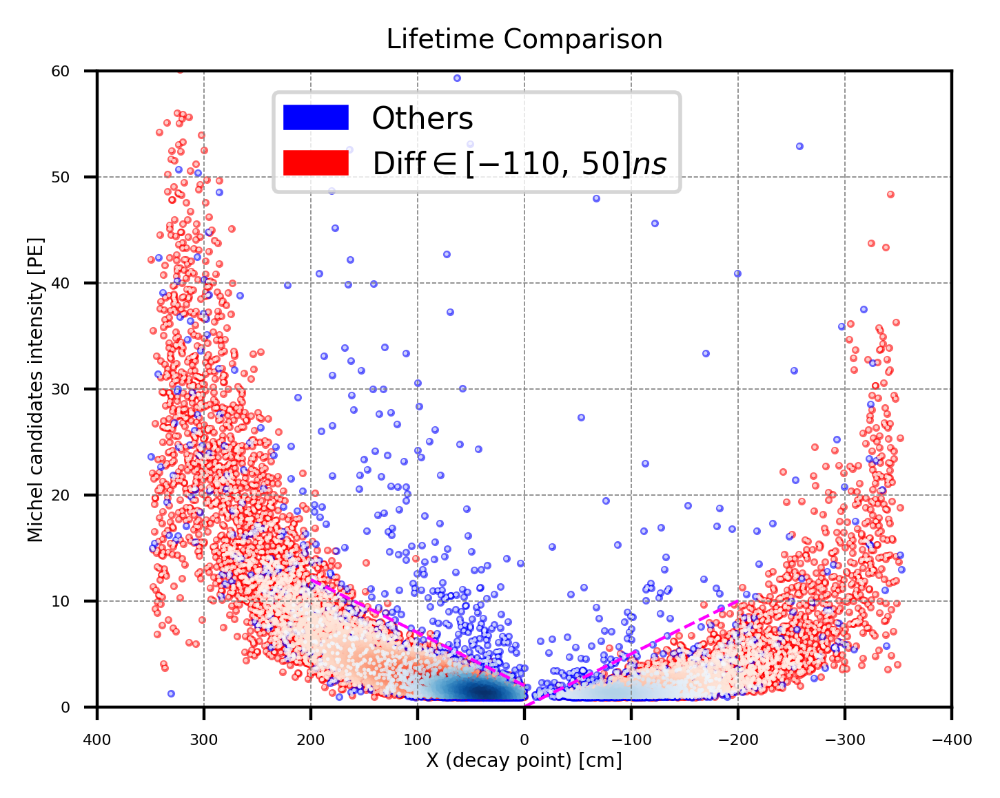

In [89]:
#Muon Intensity distribution===================================

muInt_diff500_purify5 = [ev.muon_intensity for ev in events_diff500_purify5]
muInt_diff0_purify5 = [ev.muon_intensity for ev in events_diff0_purify5]

plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.5
range_min = 0
range_max = 300
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(muInt_diff0_purify5, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(muInt_diff500_purify5, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([5, 5], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-10, 40)
plt.xlabel('Muon Intensities [PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Muon Intensities', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 





#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_diff500_purify5 = [ev.posX for ev in events_diff500_purify5]
posX_diff0_purify5 = [ev.posX for ev in events_diff0_purify5]
miInt_diff500_purify5 = [ev.michel_intensity for ev in events_diff500_purify5]
miInt_diff0_purify5 = [ev.michel_intensity for ev in events_diff0_purify5]

# Scatter plot----------
# --- Diff<500 (red group) ---
x0 = np.array(posX_diff0_purify5, dtype=float)
y0 = np.array(miInt_diff0_purify5, dtype=float)
xy0 = np.vstack([x0, y0])
z0 = gaussian_kde(xy0)(xy0)

# --- 500<Diff (blue group) ---
x1 = np.array(posX_diff500_purify5, dtype=float)
y1 = np.array(miInt_diff500_purify5, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x0, y0, s=1, color="red", alpha=0.6, label="_nolegend_")
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x0, y0, c=z0, s=1, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [0, 10], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()

#### Cut 5': Michel signal VS Distance cut:

After cut 5:---------
Purity (true / reco)    :  25088 / 26085 (96.18%)

(Diff [-110, 50]:  20645 / 26085 (79.15%)
(Diff OTHERS    :  5440 / 26085 (20.85%)

After Cut 5' (Michel vs Distance):--------------
Efficiency (cut5' / cut5):  25658 / 26085 (98.36%)
Purity (true / reco)    :  24749 / 25658 (96.46%)

(Diff [-110, 50]:  20568 / 25658 (80.16%)
(Diff OTHERS    :  5090 / 25658 (19.84%)


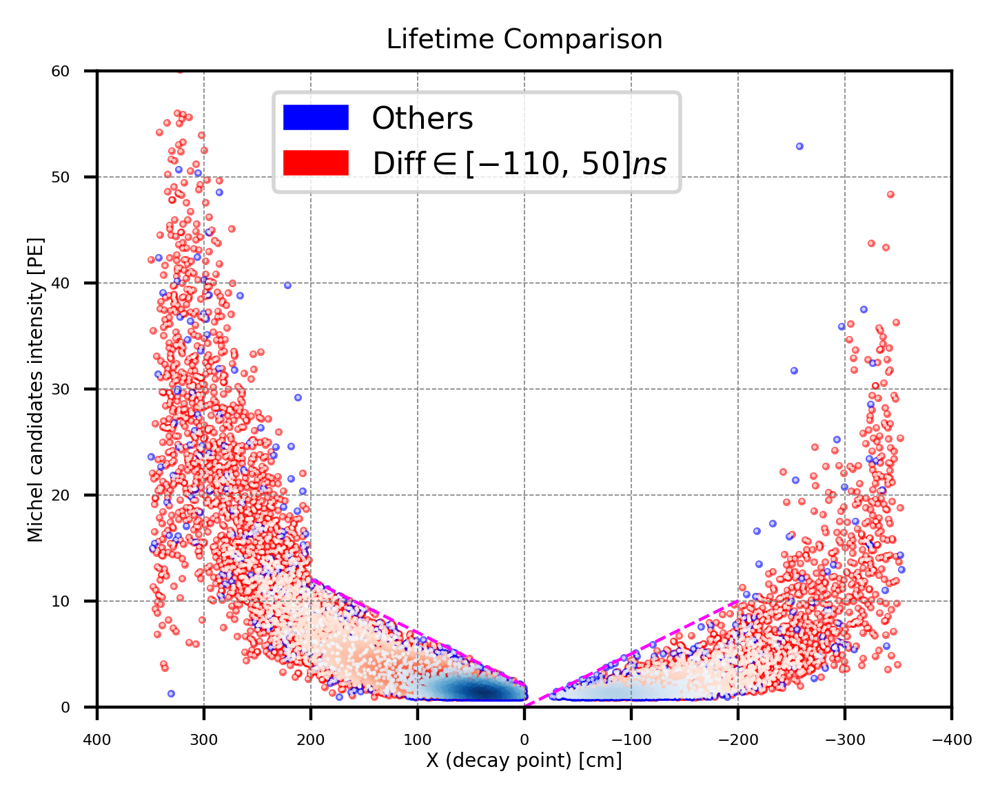

In [91]:
print("After cut 5:---------")

n_valid = sum(1 for ev in events_total_purify5 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5),
      "({:.2f}%)".format(n_valid/len(events_total_purify5)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff0_purify5)/len(events_total_purify5)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5), "/", len(events_total_purify5),
       "({:.2f}%)".format(len(events_diff500_purify5)/len(events_total_purify5)*100))


#Michel Peak rise & drop Cut (Cut 5')--------
# --- Define slopes and intercepts for both cuts ---
slope_pos = (7 - 2) / 100.0      # = 0.05
intercept_pos = 2.0

slope_neg = (10 - 0) / (-200 - 0.0)  # = -0.05
intercept_neg = 0.0

def below_line_cut(ev):
    """Return True if event passes both (posX, michel_intensity) cuts."""
    x = ev.posX
    y = ev.michel_intensity

    # Region 1: positive side [0, 100]
    if 0 <= x <= 200:
        return y <= intercept_pos + slope_pos * x

    # Region 2: negative side [-200, 0]
    elif -200 <= x <= 0:
        return y <= intercept_neg + slope_neg * x

    # Outside both ranges: no cut
    else:
        return True

# --- Apply the geometric cut to both event classes ---
events_diff0_purify5P = [ev for ev in events_diff0_purify5 if below_line_cut(ev)]
events_diff500_purify5P = [ev for ev in events_diff500_purify5 if below_line_cut(ev)]
#-------------------------------





print("\nAfter Cut 5' (Michel vs Distance):--------------")

events_total_purify5P = events_diff0_purify5P + events_diff500_purify5P

print("Efficiency (cut5' / cut5): ", len(events_total_purify5P), "/", len(events_total_purify5),
      "({:.2f}%)".format(len(events_total_purify5P)/len(events_total_purify5)*100))

n_valid = sum(1 for ev in events_total_purify5P if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5P),
      "({:.2f}%)".format(n_valid/len(events_total_purify5P)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff0_purify5P)/len(events_total_purify5P)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff500_purify5P)/len(events_total_purify5P)*100))






#Michel Intensity VS x axis================================
plt.figure(figsize=(4,3), dpi=400)

posX_diff500_purify5P = [ev.posX for ev in events_diff500_purify5P]
posX_diff0_purify5P = [ev.posX for ev in events_diff0_purify5P]
miInt_diff500_purify5P = [ev.michel_intensity for ev in events_diff500_purify5P]
miInt_diff0_purify5P = [ev.michel_intensity for ev in events_diff0_purify5P]

# Scatter plot----------
# --- Diff<500 (red group) ---
x0 = np.array(posX_diff0_purify5P, dtype=float)
y0 = np.array(miInt_diff0_purify5P, dtype=float)
xy0 = np.vstack([x0, y0])
z0 = gaussian_kde(xy0)(xy0)

# --- 500<Diff (blue group) ---
x1 = np.array(posX_diff500_purify5P, dtype=float)
y1 = np.array(miInt_diff500_purify5P, dtype=float)
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)

# Base layer (solid color so single points are visible)
plt.scatter(x0, y0, s=1, color="red", alpha=0.6, label="_nolegend_")
plt.scatter(x1, y1, s=1, color="blue", alpha=0.6, label="_nolegend_")
# Density layer (adds shading in dense regions)
plt.scatter(x0, y0, c=z0, s=1, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=1, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#-----------------------

#slope = 5/100 [PE/cm]
plt.plot([0.0, 200.0], [2, 12], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0.0, -200.0], [0, 10], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(-400, 400)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0, 60)
plt.xlabel('X (decay point) [cm]', labelpad=1, fontsize=5)
plt.ylabel('Michel candidates intensity [PE]', labelpad=1, fontsize=5)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#### Cut 6: Michel peak rise and drop slope: 

After cut 5':---------
Purity (true / reco)    :  24749 / 25658 (96.46%)

(Diff [-110, 50]:  20568 / 25658 (80.16%)
(Diff Others    :  5090 / 25658 (19.84%)

Michel Peak Rise Drop Slope (Cut 6):--------------
Efficiency (cut5 / cut4):  20691 / 25658 (80.64%)
Purity (true / reco)    :  19958 / 20691 (96.46%)

(Diff [-110, 50]:  17460 / 20691 (84.38%)
(Diff OTHERS    :  3231 / 20691 (15.62%)


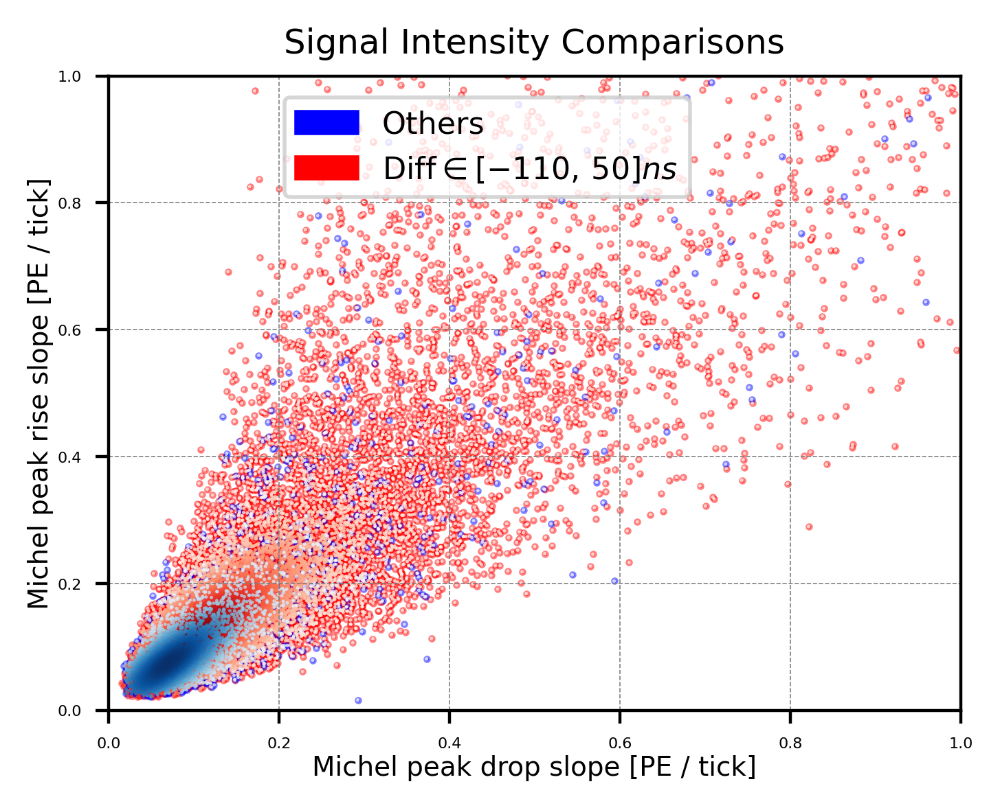

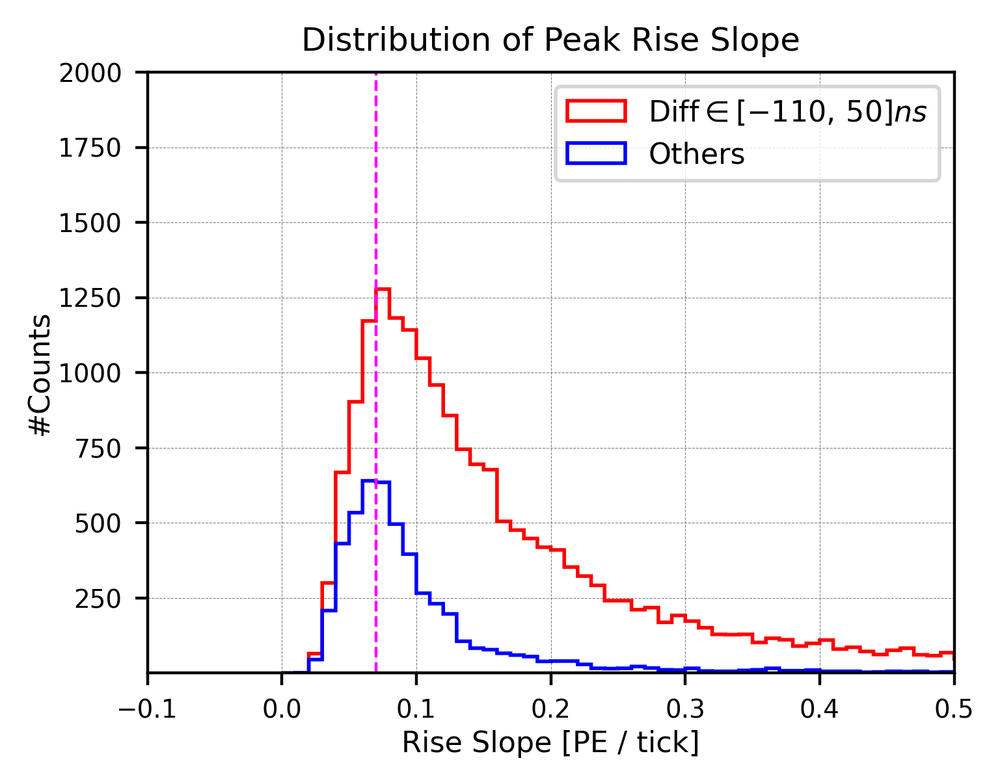

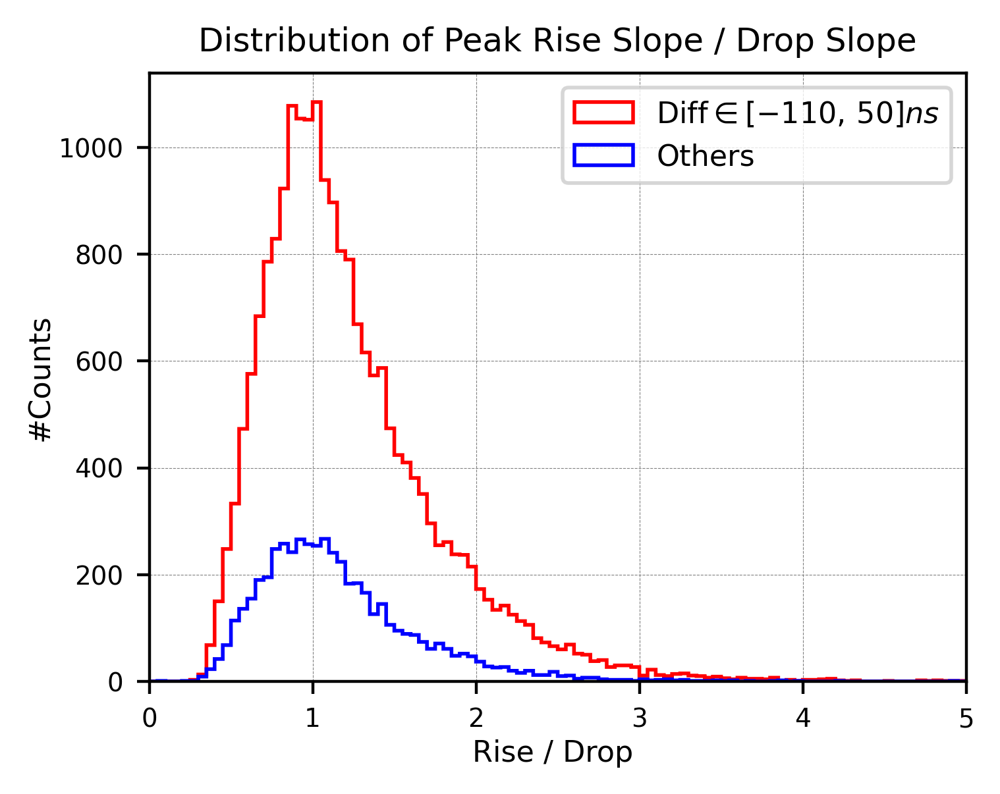

In [93]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 5':---------")

n_valid = sum(1 for ev in events_total_purify5P if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify5P),
      "({:.2f}%)".format(n_valid/len(events_total_purify5P)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff0_purify5P)/len(events_total_purify5P)*100))
print("(Diff Others    : ", len(events_diff500_purify5P), "/", len(events_total_purify5P),
       "({:.2f}%)".format(len(events_diff500_purify5P)/len(events_total_purify5P)*100))


rise_diff0_purity5P = [ev.michel_rise for ev in events_diff0_purify5P]
drop_diff0_purity5P = [ev.michel_drop for ev in events_diff0_purify5P]

ratios_diff0_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_diff0_purity5P, drop_diff0_purity5P)
]

rise_diff500_purity5P = [ev.michel_rise for ev in events_diff500_purify5P]
drop_diff500_purity5P = [ev.michel_drop for ev in events_diff500_purify5P]

ratios_diff500_purity5P = [
    r / d if d not in (0, None) else None
    for r, d in zip(rise_diff500_purity5P, drop_diff500_purity5P)
]



thre_rise = 0.07 # mu Int will automatically higher than mi---


# filter the actual events
events_diff0_purify6 = [
    ev for ev in events_diff0_purify5P
    if thre_rise < ev.michel_rise
]
events_diff500_purify6 = [
    ev for ev in events_diff500_purify5P
    if thre_rise < ev.michel_rise 
]
#-------------------------------



print("\nMichel Peak Rise Drop Slope (Cut 6):--------------")

events_total_purify6 = events_diff0_purify6 + events_diff500_purify6

print("Efficiency (cut5 / cut4): ", len(events_total_purify6), "/", len(events_total_purify5P),
      "({:.2f}%)".format(len(events_total_purify6)/len(events_total_purify5P)*100))

n_valid = sum(1 for ev in events_total_purify6 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify6),
      "({:.2f}%)".format(n_valid/len(events_total_purify6)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff0_purify6)/len(events_total_purify6)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff500_purify6)/len(events_total_purify6)*100))








# ==========================================================
# Michel Rise VS Michel Drop
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(drop_diff500_purity5P), np.array(rise_diff500_purity5P)
x2, y2 = np.array(drop_diff0_purity5P), np.array(rise_diff0_purity5P)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")


#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
#plt.plot([0, 1000], [0, 500], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xlabel('Michel peak drop slope [PE / tick]', labelpad=1, fontsize=7)
plt.ylabel('Michel peak rise slope [PE / tick]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()





#Michel Rise Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.01
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(rise_diff0_purity5P, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(rise_diff500_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.07, 0.07], [0, 2000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.1, 0.5)
plt.xlabel('Rise Slope [PE / tick]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 2000)
#plt.xscale('log')
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  





#Michel Rise & Drop Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

#plt.hist(drop_diff0_purity1, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
#         histtype='step', linewidth=1.0, label="Drop for Diff0")
#plt.hist(drop_diff500_purity1, bins=bins, range=(range_min, range_max), edgecolor='green', 
#         histtype='step', linewidth=1.0, label="Drop for Diff500")
plt.hist(ratios_diff0_purity5P, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(ratios_diff500_purity5P, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")


plt.xlim(0, 5)
plt.xlabel('Rise / Drop ', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Distribution of Peak Rise Slope / Drop Slope', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 







#Apply Cut======================================




### Cut 7: 2nd 3rd peak intensity diff cut

After cut 6:---------
Purity (true / reco)    :  19958 / 20691 (96.46%)

(Diff [-110, 50]:  17460 / 20691 (84.38%)
(Diff OTHERS    :  3231 / 20691 (15.62%)

Third / Second peak intensity (Cut 7):--------------
Efficiency (cut7 / cut6):  17169 / 20691 (82.98%)
Purity (true / reco)    :  16571 / 17169 (96.52%)

(Diff [-110, 50]:  15219 / 17169 (88.64%)
(Diff OTHERS    :  1950 / 17169 (11.36%)


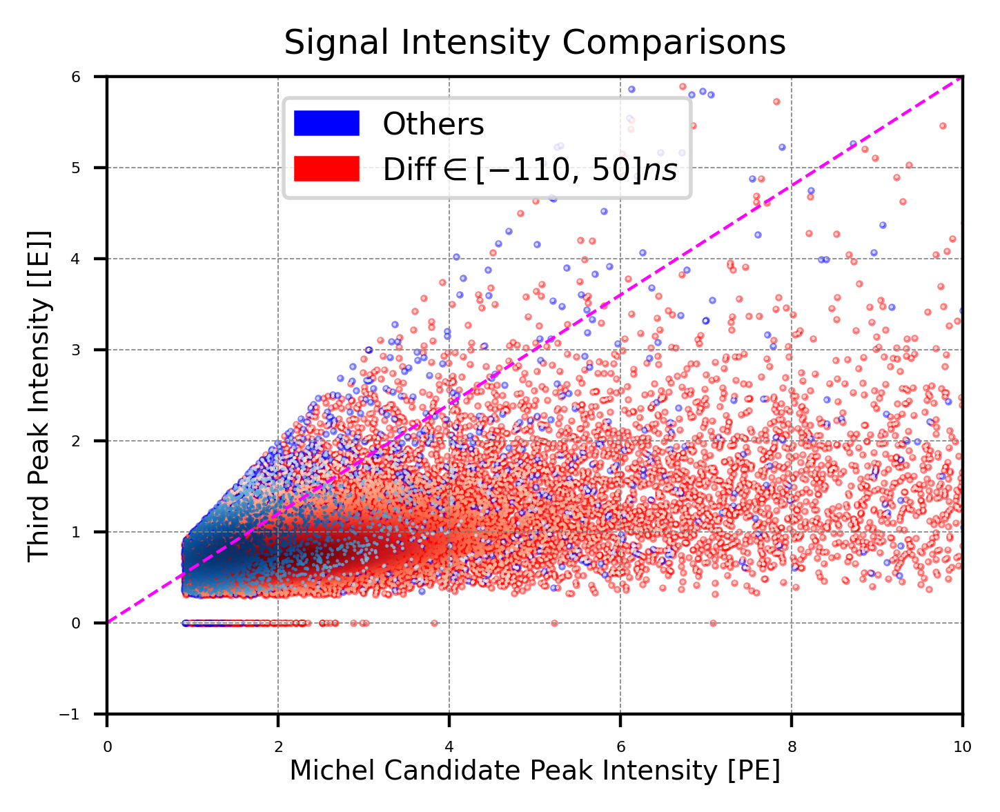

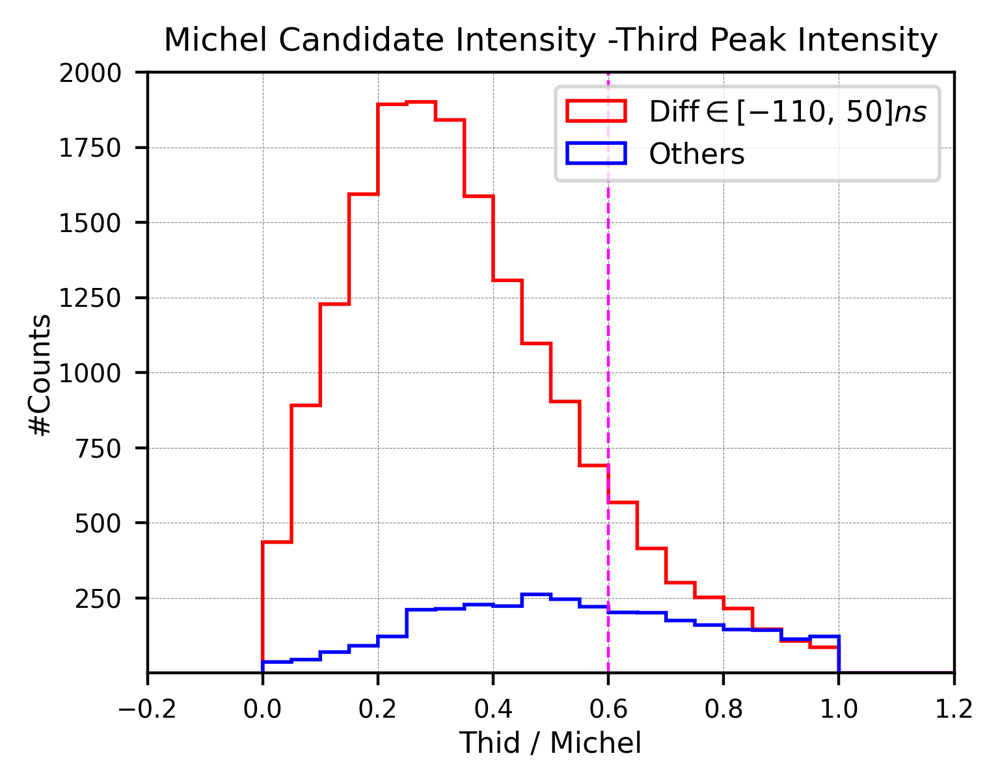

In [96]:
#Michel Peak rise & drop Cut (Cut 6)--------
print("After cut 6:---------")

n_valid = sum(1 for ev in events_total_purify6 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify6),
      "({:.2f}%)".format(n_valid/len(events_total_purify6)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff0_purify6)/len(events_total_purify6)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify6), "/", len(events_total_purify6),
       "({:.2f}%)".format(len(events_diff500_purify6)/len(events_total_purify6)*100))



miInt_diff0_purity6 = [ev.michel_intensity for ev in events_diff0_purify6]
thInt_diff0_purity6 = [ev.third_intensity for ev in events_diff0_purify6]

miInt_diff500_purity6 = [ev.michel_intensity for ev in events_diff500_purify6]
thInt_diff500_purity6 = [ev.third_intensity for ev in events_diff500_purify6]



# Element-by-element ratio (thInt / miInt)
ratio_diff0_purity6 = [th / mi for th, mi in zip(thInt_diff0_purity6, miInt_diff0_purity6)]
ratio_diff500_purity6 = [th / mi for th, mi in zip(thInt_diff500_purity6, miInt_diff500_purity6)]


thre1 = 0.0
thre2 = 0.6

# filter the actual events
events_diff0_purify7 = [
    ev for ev in events_diff0_purify6
    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
]
events_diff500_purify7 = [
    ev for ev in events_diff500_purify6
    if ev.michel_intensity != 0 and thre1 < ev.third_intensity / ev.michel_intensity < thre2
]
#-------------------------------


print("\nThird / Second peak intensity (Cut 7):--------------")

events_total_purify7 = events_diff0_purify7 + events_diff500_purify7

print("Efficiency (cut7 / cut6): ", len(events_total_purify7), "/", len(events_total_purify6),
      "({:.2f}%)".format(len(events_total_purify7)/len(events_total_purify6)*100))

n_valid = sum(1 for ev in events_total_purify7 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify7),
      "({:.2f}%)".format(n_valid/len(events_total_purify7)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff0_purify7)/len(events_total_purify7)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff500_purify7)/len(events_total_purify7)*100))








# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_diff500_purity6), np.array(thInt_diff500_purity6) #(x, y)
x2, y2 = np.array(miInt_diff0_purity6), np.array(thInt_diff0_purity6)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#---------------------------------

#plt.plot([0, 500], [0, 40], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([0, 100], [0, 60], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()






#Third / Michel Distributions===================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.05
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(ratio_diff0_purity6, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(ratio_diff500_purity6, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.6, 0.6], [0, 2000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-0.2, 1.2)
plt.xlabel('Thid / Michel', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 2000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show() 

### Cut 8: Third second peak intensity ratio cut


After Cut 7:--------------
Purity (true / reco)    :  16571 / 17169 (96.52%)

(Diff [-110, 50]:  15219 / 17169 (88.64%)
(Diff OTHERS    :  1950 / 17169 (11.36%)

Michel 3rd Peaks intensity Diff (Cut 8):--------------
Efficiency (cut8 / cut7):  15907 / 17169 (92.65%)
Purity (true / reco)    :  15358 / 15907 (96.55%)

(Diff [-110, 50]:  14361 / 15907 (90.28%)
(Diff OTHERS    :  1546 / 15907 (9.72%)


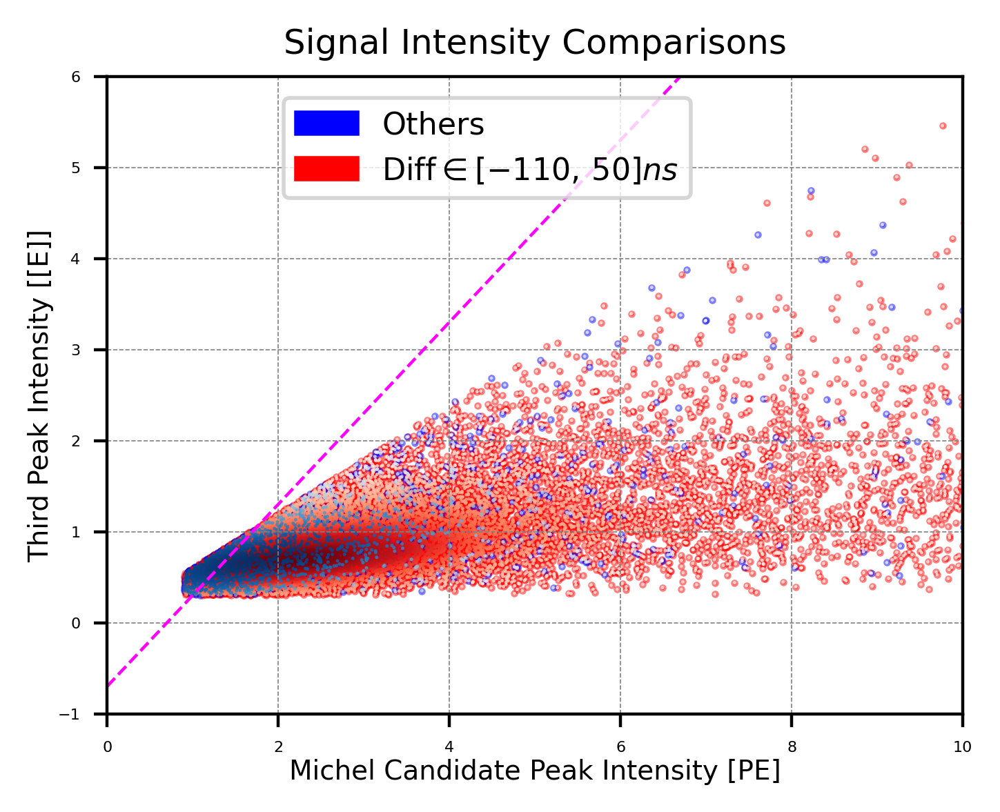

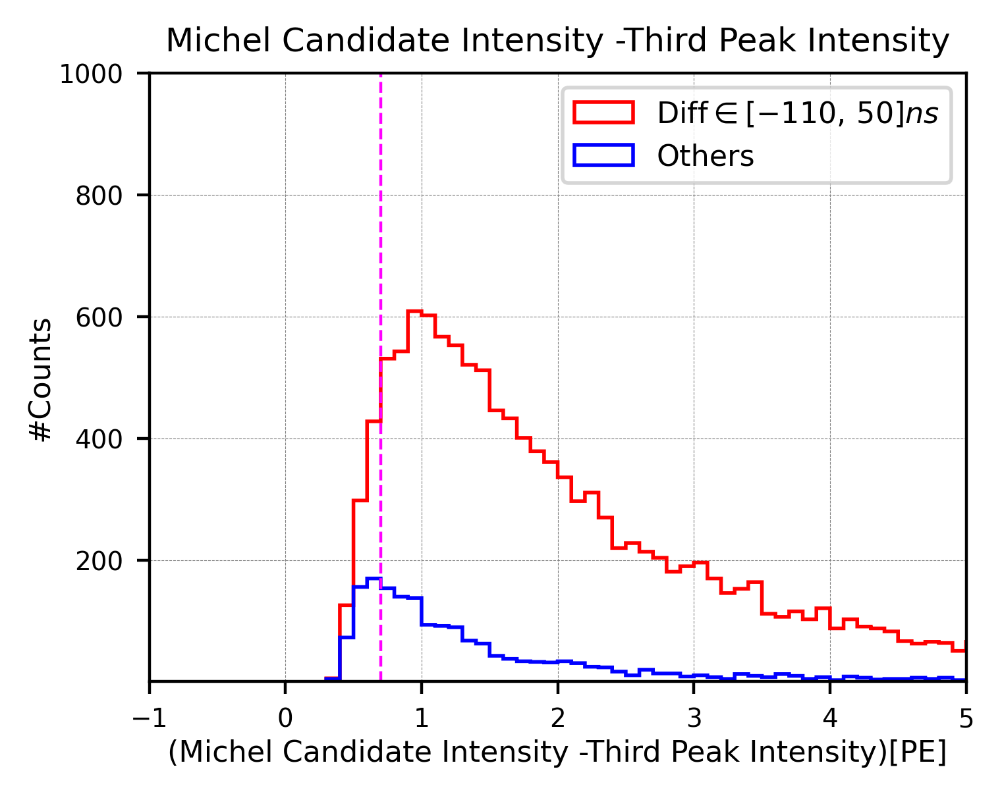

In [98]:
print("\nAfter Cut 7:--------------")

n_valid = sum(1 for ev in events_total_purify7 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify7),
      "({:.2f}%)".format(n_valid/len(events_total_purify7)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff0_purify7)/len(events_total_purify7)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify7), "/", len(events_total_purify7),
       "({:.2f}%)".format(len(events_diff500_purify7)/len(events_total_purify7)*100))


miInt_diff0_purity7 = [ev.michel_intensity for ev in events_diff0_purify7]
thInt_diff0_purity7 = [ev.third_intensity for ev in events_diff0_purify7]

miInt_diff500_purity7 = [ev.michel_intensity for ev in events_diff500_purify7]
thInt_diff500_purity7 = [ev.third_intensity for ev in events_diff500_purify7]

# Element-by-element difference (thInt - miInt)
subtract_diff0_purity7 = [mi - th for th, mi in zip(thInt_diff0_purity7, miInt_diff0_purity7)]
subtract_diff500_purity7 = [mi - th for th, mi in zip(thInt_diff500_purity7, miInt_diff500_purity7)]


thre_diff = 0.7

# filter the actual events
events_diff0_purify8 = [
    ev for ev in events_diff0_purify7
    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
]
events_diff500_purify8 = [
    ev for ev in events_diff500_purify7
    if thre_diff <  (ev.michel_intensity - ev.third_intensity)
]
#-------------------------------


print("\nMichel 3rd Peaks intensity Diff (Cut 8):--------------")

events_total_purify8 = events_diff0_purify8 + events_diff500_purify8

print("Efficiency (cut8 / cut7): ", len(events_total_purify8), "/", len(events_total_purify7),
      "({:.2f}%)".format(len(events_total_purify8)/len(events_total_purify7)*100))

n_valid = sum(1 for ev in events_total_purify8 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify8),
      "({:.2f}%)".format(n_valid/len(events_total_purify8)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff0_purify8)/len(events_total_purify8)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff500_purify8)/len(events_total_purify8)*100))










# ==========================================================
# Michel Int VS Third Int
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot--------------------
# Convert to numpy arrays
x1, y1 = np.array(miInt_diff500_purity7), np.array(thInt_diff500_purity7) #(x, y)
x2, y2 = np.array(miInt_diff0_purity7), np.array(thInt_diff0_purity7)
# --- Density for group 1 (red, 500<Diff) ---
xy1 = np.vstack([x1, y1])
z1 = gaussian_kde(xy1)(xy1)
idx1 = z1.argsort()
x1, y1, z1 = x1[idx1], y1[idx1], z1[idx1]
# --- Density for group 2 (blue, 0<Diff<500) ---
xy2 = np.vstack([x2, y2])
z2 = gaussian_kde(xy2)(xy2)
idx2 = z2.argsort()
x2, y2, z2 = x2[idx2], y2[idx2], z2[idx2]
# --- Scatter plots with base colors red & blue ---
# Base layer (solid red/blue so single points are visible)
plt.scatter(x2, y2, s=0.8, color="red", alpha=0.5, label="_nolegend_")
plt.scatter(x1, y1, s=0.8, color="blue", alpha=0.5, label="_nolegend_")
# Density layer (adds darker shades where points overlap)
plt.scatter(x2, y2, c=z2, s=0.8, cmap="Reds", alpha=0.8, edgecolors="none", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.scatter(x1, y1, c=z1, s=0.8, cmap="Blues", alpha=0.8, edgecolors="none", label="Others")
#---------------------------------

plt.plot([0, 10], [-0.7, 9.3], color="magenta", linewidth=0.8, linestyle='--')

#plt.axis('scaled')
plt.xlim(0, 10)
plt.ylim(-1, 6)
plt.xlabel('Michel Candidate Peak Intensity [PE]', labelpad=1, fontsize=7)
plt.ylabel('Third Peak Intensity [[E]]', labelpad=1, fontsize=7)
plt.title('Signal Intensity Comparisons', fontsize=9)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)

# Create proxy artists (red and blue dots)
red_patch = mpatches.Patch(color="blue", label="Others")
blue_patch = mpatches.Patch(color="red", label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.legend(handles=[red_patch, blue_patch], loc="upper right", frameon=True, 
           bbox_to_anchor=(0.7, 0.99), fontsize=10, markerscale=6, ncol=1, prop={'size':8})

plt.show()









#(Michel Candidate Intensity -Third Peak Intensity) Distributions====================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 0.1
range_min = 0
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

plt.hist(subtract_diff0_purity7, bins=bins, range=(range_min, range_max), edgecolor='red', 
         histtype='step', linewidth=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(subtract_diff500_purity7, bins=bins, range=(range_min, range_max), edgecolor='blue', 
         histtype='step', linewidth=1.0, label="Others")

plt.plot([0.7, 0.7], [0, 1000], color="magenta", linewidth=0.8, linestyle='--')

plt.xlim(-1, 5)
plt.xlabel('(Michel Candidate Intensity -Third Peak Intensity)[PE]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Michel Candidate Intensity -Third Peak Intensity', fontsize=9)
plt.legend(fontsize=8, loc="upper right")
plt.show()  

### Cut 9: Space Cut along drift direction


After Cut 8:--------------
Purity (true / reco)    :  15358 / 15907 (96.55%)

(Diff [-110, 50]:  14361 / 15907 (90.28%)
(Diff OTHERS    :  1546 / 15907 (9.72%)

Drift Direction Cut (Cut 9):--------------
Efficiency (cut9 / cut8):  15004 / 15907 (94.32%)
Purity (true / reco)    :  14503 / 15004 (96.66%)

(Diff [-110, 50]:  13724 / 15004 (91.47%)
(Diff OTHERS    :  1280 / 15004 (8.53%)

Decay points distribution: 


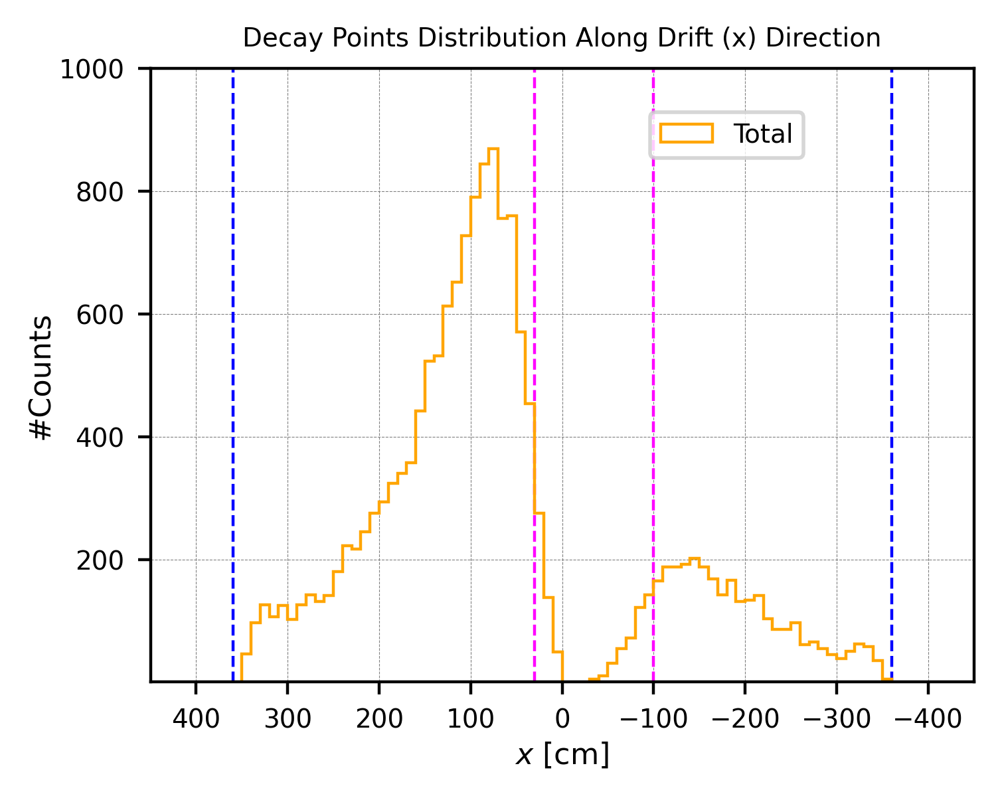

In [163]:
print("\nAfter Cut 8:--------------")

n_valid = sum(1 for ev in events_total_purify8 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify8),
      "({:.2f}%)".format(n_valid/len(events_total_purify8)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff0_purify8)/len(events_total_purify8)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify8), "/", len(events_total_purify8),
       "({:.2f}%)".format(len(events_diff500_purify8)/len(events_total_purify8)*100))





posX_cut = 30
negX_cut = -100

# filter the actual events
events_diff0_purify9 = [
    ev for ev in events_diff0_purify8
    if posX_cut < ev.posX  or  ev.posX < negX_cut
]
events_diff500_purify9 = [
    ev for ev in events_diff500_purify8
    if posX_cut < ev.posX  or  ev.posX < negX_cut
]
#-------------------------------


print("\nDrift Direction Cut (Cut 9):--------------")

events_total_purify9 = events_diff0_purify9 + events_diff500_purify9

print("Efficiency (cut9 / cut8): ", len(events_total_purify9), "/", len(events_total_purify8),
      "({:.2f}%)".format(len(events_total_purify9)/len(events_total_purify8)*100))

n_valid = sum(1 for ev in events_total_purify9 if ev.energy is not None and ev.energy > 0)
print("Purity (true / reco)    : ", n_valid, "/", len(events_total_purify9),
      "({:.2f}%)".format(n_valid/len(events_total_purify9)*100))

print("\n(Diff [-110, 50]: ", len(events_diff0_purify9), "/", len(events_total_purify9),
       "({:.2f}%)".format(len(events_diff0_purify9)/len(events_total_purify9)*100))
print("(Diff OTHERS    : ", len(events_diff500_purify9), "/", len(events_total_purify9),
       "({:.2f}%)".format(len(events_diff500_purify9)/len(events_total_purify9)*100))









posX_diff500_purify8 = [ev.posX for ev in events_diff500_purify8]

posX_diff0_purify8 = [ev.posX for ev in events_diff0_purify8]

posX_total_purify8 = posX_diff500_purify8 + posX_diff0_purify8


#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([30, 30], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-100, -100], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
#plt.hist(posX_diff0_purify8, bins=bins, range=(range_min, range_max), edgecolor='red', 
#          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#plt.hist(posX_diff500_purify8, bins=bins, range=(range_min, range_max), edgecolor='blue', 
#          histtype='step', linewidth=0.8, label="Others")
plt.hist(posX_total_purify8, bins=bins, range=(range_min, range_max), edgecolor='orange', 
          histtype='step', linewidth=0.8, label="Total")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  





Decay points distribution: 


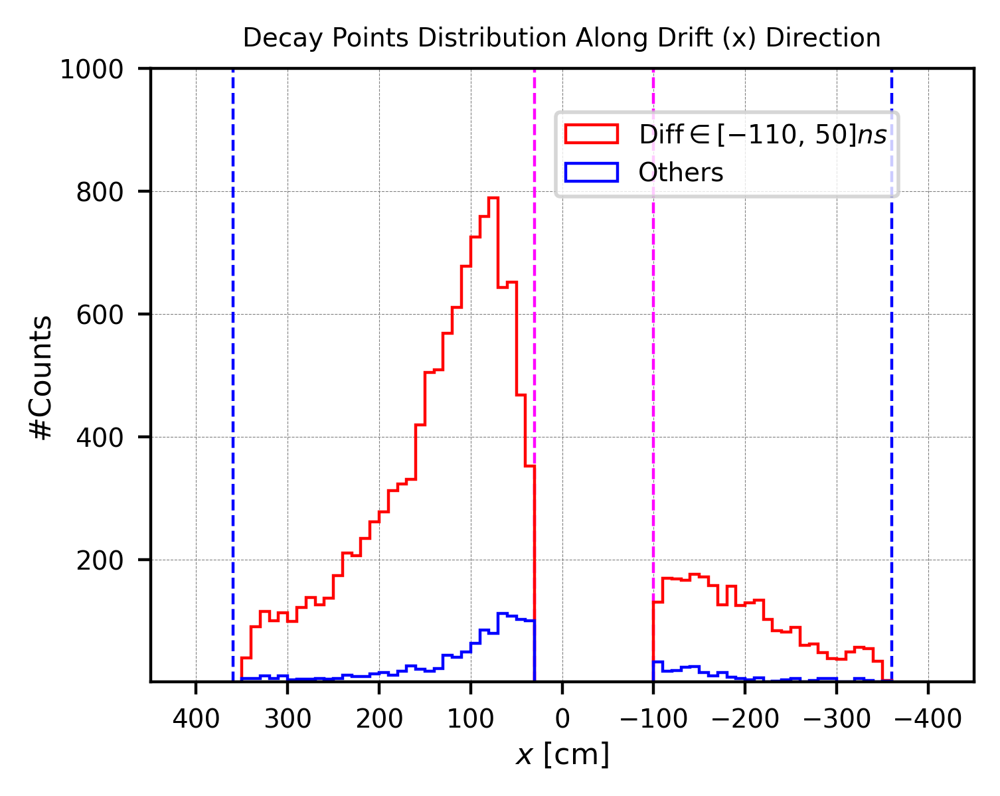

In [101]:
posX_diff500_purify9 = [ev.posX for ev in events_diff500_purify9]

posX_diff0_purify9 = [ev.posX for ev in events_diff0_purify9]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Cut line------
plt.plot([30, 30], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')
plt.plot([-100, -100], [0, 3000], color="magenta", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='red', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(posX_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='blue', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
plt.ylim(0.9, 1000)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  

<br />

### Explore Validaty of -110<Diff<50 [ns] standard: 

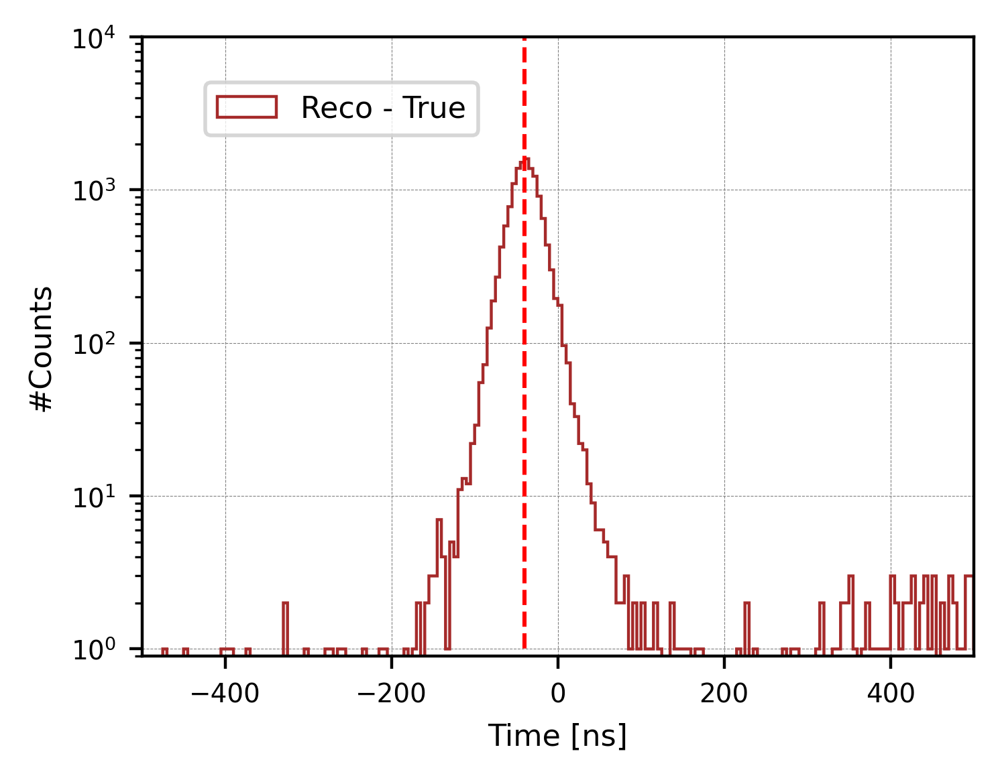

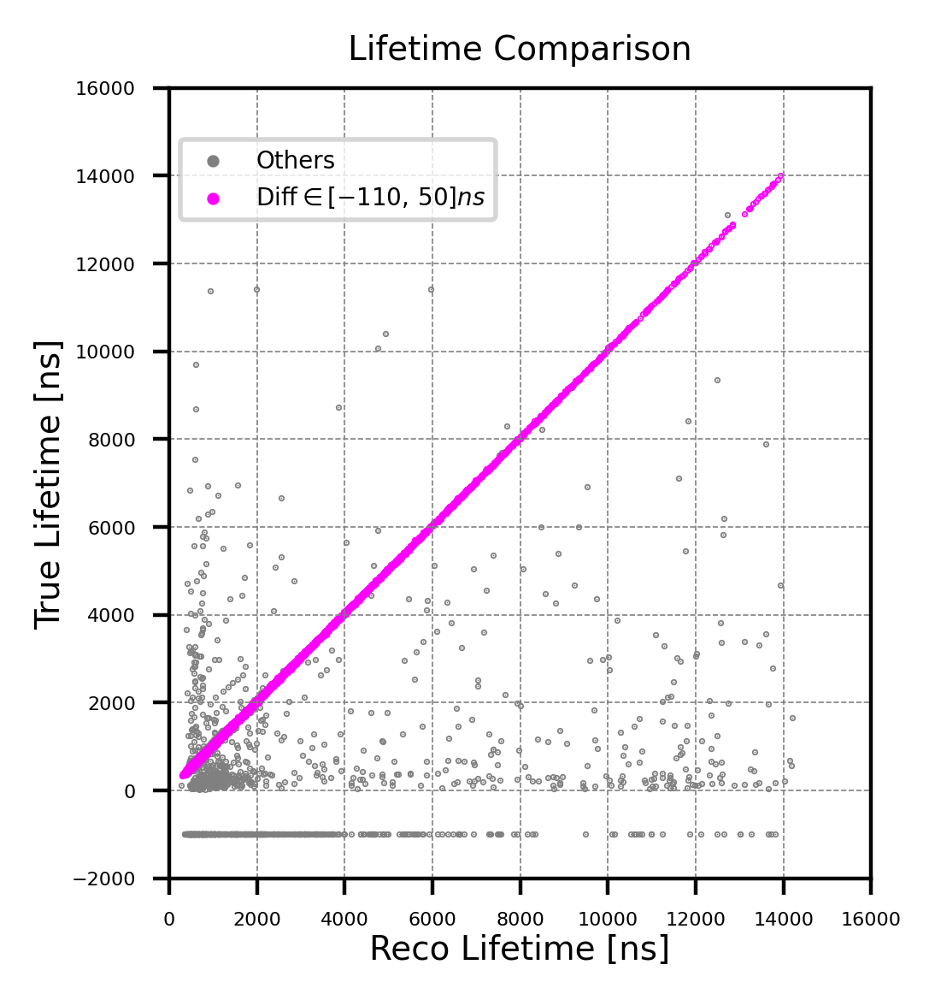

In [118]:
#The final dataset: events_diff500_purify9

diffTime_diff500_purify9 = [ev.diff_lifetime for ev in events_diff500_purify9]
trueTime_diff500_purify9 = [ev.true_lifetime for ev in events_diff500_purify9]
recoTime_diff500_purify9 = [ev.reco_lifetime for ev in events_diff500_purify9]

#Group of diff<500
diffTime_diff0_purify9 = [ev.diff_lifetime for ev in events_diff0_purify9]
trueTime_diff0_purify9 = [ev.true_lifetime for ev in events_diff0_purify9]
recoTime_diff0_purify9 = [ev.reco_lifetime for ev in events_diff0_purify9]

events_total_purify9 = events_diff0_purify9 + events_diff500_purify9
diffTime_total_purify9 = diffTime_diff500_purify9 + diffTime_diff0_purify9

#------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)

# Define histogram parameters
bin_width = 5
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(diffTime_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='brown', histtype='step', linewidth=0.8,
         label='Reco - True')

plt.plot([-40, -40], [0, 30000], color="red", linewidth=1.1, linestyle='--')

plt.xlim(-500, 500)
plt.ylim(0.9, 10000)
plt.yscale('log')
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()







# ==========================================================
# TrueLife VS RecoLife
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(recoTime_diff500_purify9, trueTime_diff500_purify9, s=0.1, c='grey', alpha=1.0, label="Others")
plt.scatter(recoTime_diff0_purify9, trueTime_diff0_purify9, s=0.1, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#-----------------------

plt.axis('scaled')
plt.xlim(0, 16000)
plt.ylim(-2000, 16000)
plt.ylabel('True Lifetime [ns]', labelpad=1, fontsize=7)
plt.xlabel('Reco Lifetime [ns]', labelpad=1, fontsize=7)
plt.title('Lifetime Comparison', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=6, markerscale=5, ncol=1, prop={'size':5})
plt.show()





<br />

#### Single Event Inspection:

In [104]:
# "Signal"
for ev in events_diff0_purify9:
    if ev.diff_lifetime < -96:
        print(ev)

print("\n--------------------")
for i, ev in enumerate(events_diff0_purify9[:100]):
    print(f"Event {i}: {ev}")



# "Background"
print("\n\n=======================================")
for i, ev in enumerate(events_diff500_purify9[:100]):
    print(f"Event {i}: {ev}")



PdsEventNew(muon_time=126, michel_time=170, muon_intensity=10.1933, michel_intensity=1.8171, third_intensity=0.530523, posX=49.0471, posY=123.124, posZ=96.3449, energy=34.7728, lifetime=0.809767, pdg=-11, eventID=7117, trackID=7, date=20251011, michel_score=0.472269, michel_hits=16, reco_lifetime=704, true_lifetime=809.767, diff_lifetime=-105.76700000000005, michel_rise=0.09563684210526316, michel_drop=0.10132931034482759)
PdsEventNew(muon_time=127, michel_time=477, muon_intensity=17.0459, michel_intensity=5.82545, third_intensity=1.21847, posX=84.2066, posY=287.632, posZ=233.486, energy=24.9505, lifetime=5.69684, pdg=-11, eventID=19875, trackID=17, date=20251012, michel_score=0.666836, michel_hits=9, reco_lifetime=5600, true_lifetime=5696.84, diff_lifetime=-96.84000000000015, michel_rise=0.3262477272727273, michel_drop=0.2157574074074074)
PdsEventNew(muon_time=127, michel_time=161, muon_intensity=15.8608, michel_intensity=2.22742, third_intensity=0.887851, posX=87.4613, posY=30.0038, 

<br />
<br />

#### Features of final dataset (after purification 9):


Decay points distribution: 


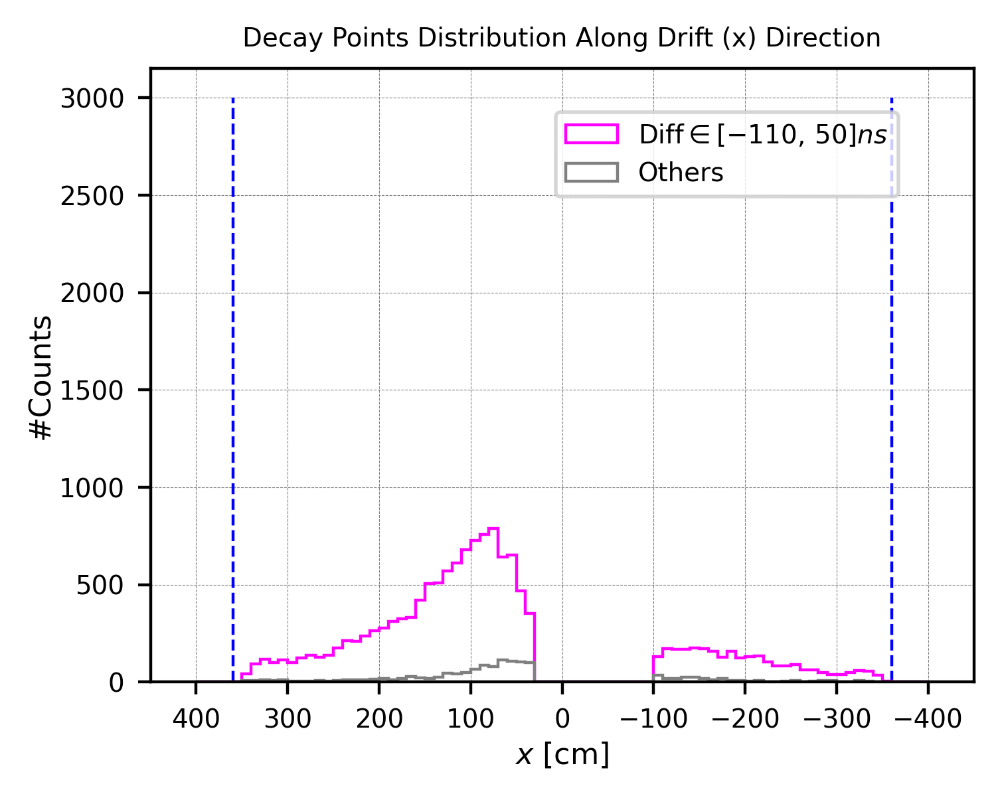

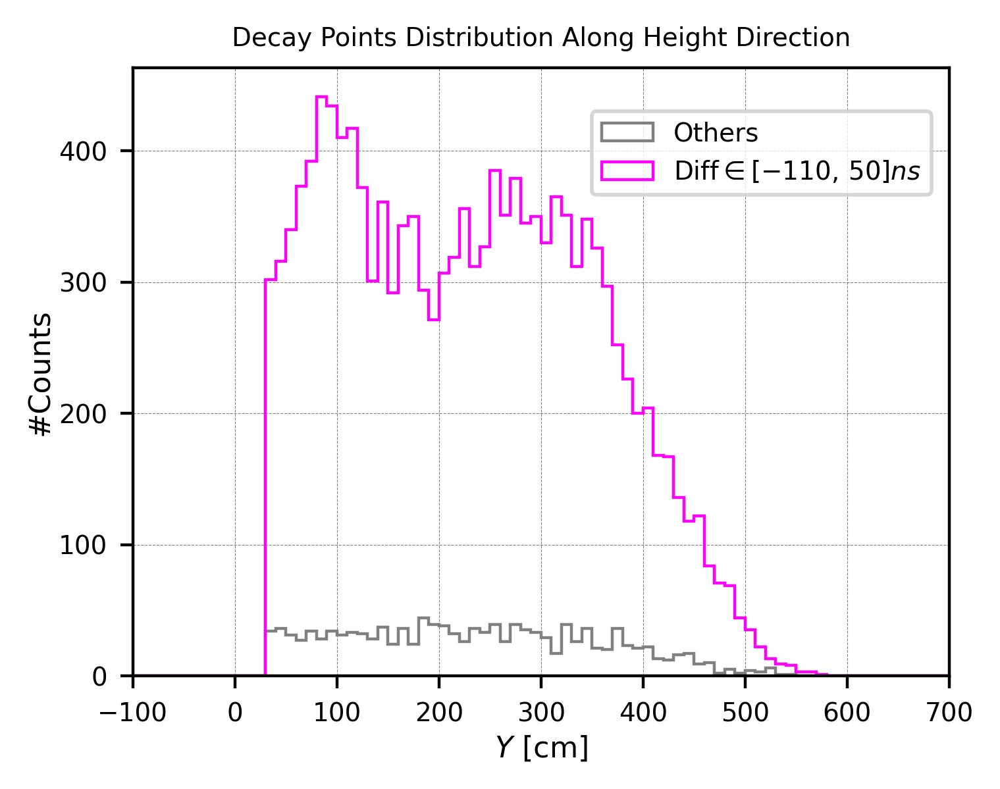

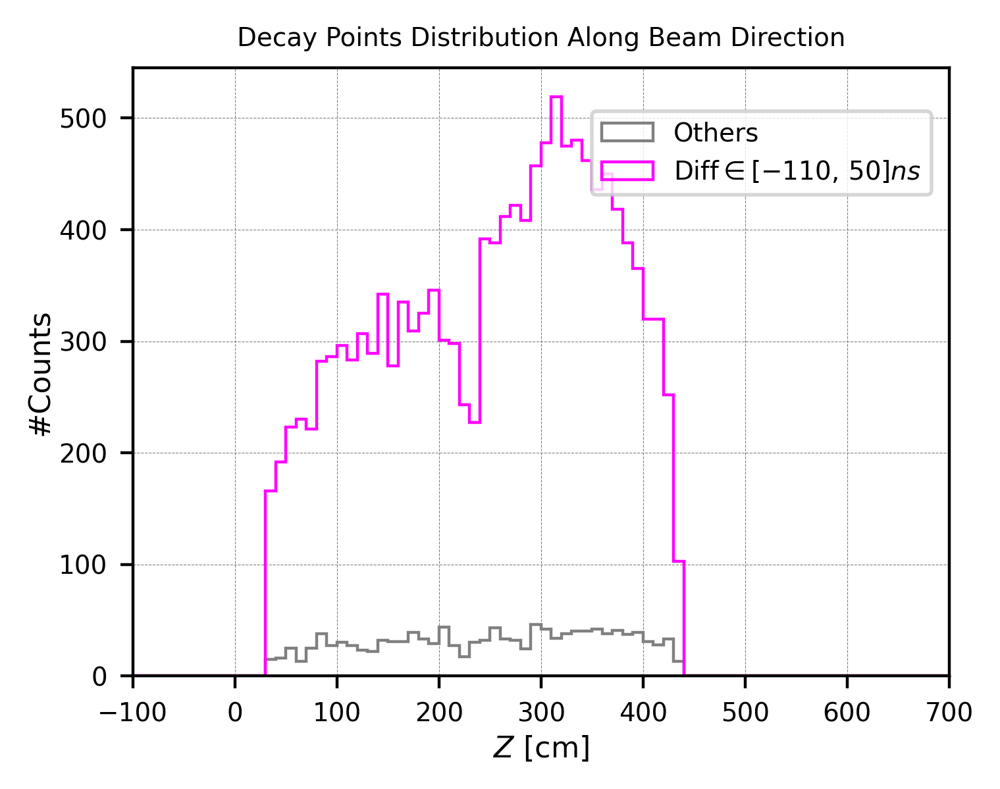

In [105]:

posX_diff500_purify9 = [ev.posX for ev in events_diff500_purify9]
posY_diff500_purify9 = [ev.posY for ev in events_diff500_purify9]
posZ_diff500_purify9 = [ev.posZ for ev in events_diff500_purify9]

posX_diff0_purify9 = [ev.posX for ev in events_diff0_purify9]
posY_diff0_purify9 = [ev.posY for ev in events_diff0_purify9]
posZ_diff0_purify9 = [ev.posZ for ev in events_diff0_purify9]



#Decay points distribution:==========================================
print("\nDecay points distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#APA planes---
plt.plot([-360, -360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')
plt.plot([360, 360], [0, 3000], color="blue", linewidth=0.8, linestyle='--')

#Define the range and bin width
bin_width = 10
range_min = -400
range_max = 400
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posX_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(posX_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
#--------------------------------

plt.xlim(-450, 450)
plt.xlabel(r'$x$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.9, 500)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Drift (x) Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Y distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posY_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
plt.hist(posY_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Y$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Height Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show()  




# Plotting the histogram (Z distribution)---------------
plt.figure(figsize=(4,3),dpi=400)

#Define the range and bin width
bin_width = 10
range_min = -1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(posZ_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")
plt.hist(posZ_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#--------------------------------

plt.xlim(-100, 700)
plt.xlabel(r'$Z$ [cm]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.gca().invert_xaxis()  # Flip x-axis
#plt.ylim(0.1, 300)
#plt.yscale('log')
plt.title('Decay Points Distribution Along Beam Direction', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.77, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 











# Set the limits of x, y and z when drawing---
xmin = -450
xmax = 450
ymin = -100
ymax = 700
zmin = -100
zmax = 600

# Field cage range---
cageMinX = -356
cageMaxX = 356
cageMinY = 0
cageMaxY = 610
cageMinZ = 0
cageMaxZ = 465


# ==========================================================
# Y–X plane plotting (Front View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line for field cage
# aux2 = [0, 610, 610, 0, 0]
# aux1 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posX_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posX_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posX_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posX_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posX_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(xmin, xmax)
# plt.ylim(-50, 660)
# plt.gca().invert_xaxis()  # Flip x-axis
# plt.xlabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Front View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()


# ==========================================================
# Z–X plane plotting (Top View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux1 = [0, 465, 465, 0, 0]
# aux2 = [356, 356, -356, -356, 356]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posX_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posX_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posX_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posX_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posX_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.ylim(xmin, xmax)
# plt.xlim(-50, 515)
# plt.ylabel('X axis [cm]', labelpad=1, fontsize=5)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.title('Top View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()




# ==========================================================
# Y–Z plane plotting (Side View)
# ==========================================================
# plt.figure(figsize=(4,3), dpi=400)

# # Auxiliary line
# aux2 = [cageMinY, cageMaxY, cageMaxY, cageMinY, cageMinY]
# aux1 = [cageMinZ, cageMinZ, cageMaxZ, cageMaxZ, cageMinZ]
# plt.plot(aux1, aux2, color="blue", linewidth=0.8, linestyle='-')

# # Scatter plot----------
# # plt.scatter(posZ_true500, posY_true500, s=1, c='red', alpha=1.0, label="500<True")
# # plt.scatter(posZ_true0, posY_true0, s=1, c='blue', alpha=1.0, label="0<True<500")
# # plt.scatter(posZ_false, posY_false, s=1, c='black', alpha=1.0, label="True<0 (False)")

# plt.scatter(posZ_diff500, posY_diff500, s=1, c='grey', alpha=1.0, label="500<Diff")
# plt.scatter(posZ_diff0, posY_diff0, s=1, c='magenta', alpha=1.0, label="0<Diff<500")
# #-----------------------

# plt.axis('scaled')
# plt.xlim(-50, 515)
# plt.ylim(-50, 660)
# plt.xlabel('Z axis [cm]', labelpad=1, fontsize=5)
# plt.ylabel('Y axis [cm]', labelpad=1, fontsize=5)
# plt.title('Side View', fontsize=7)
# plt.tick_params(labelsize=4)
# plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
# plt.legend(fontsize=5, loc="upper right")
# plt.show()



Energy Distribution: 


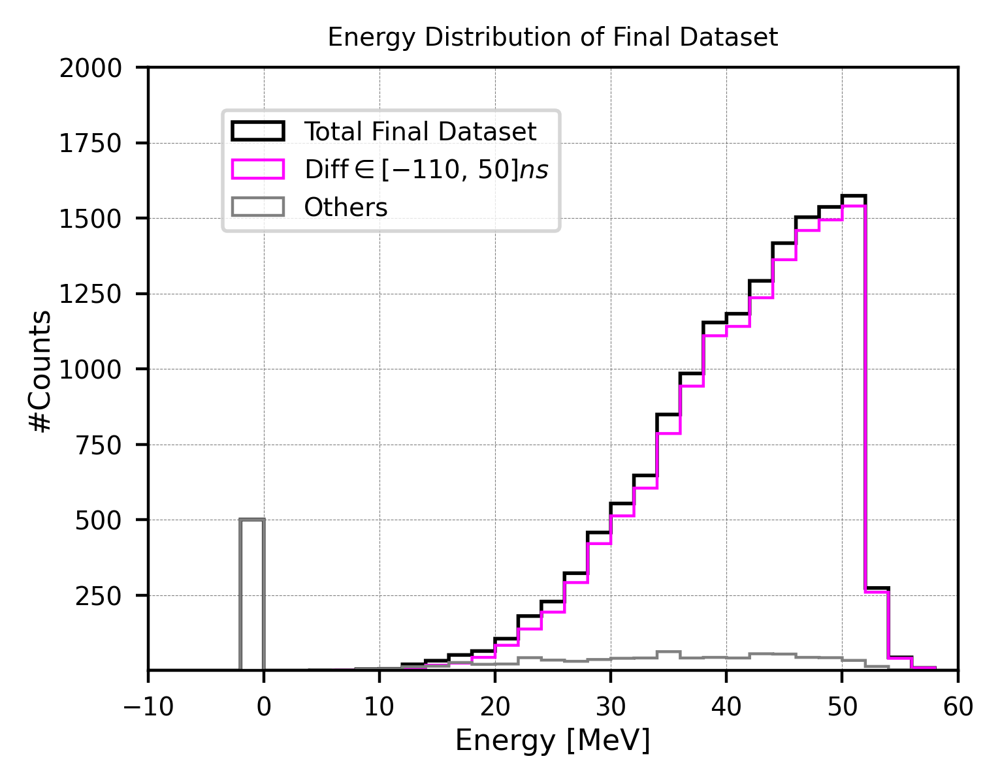

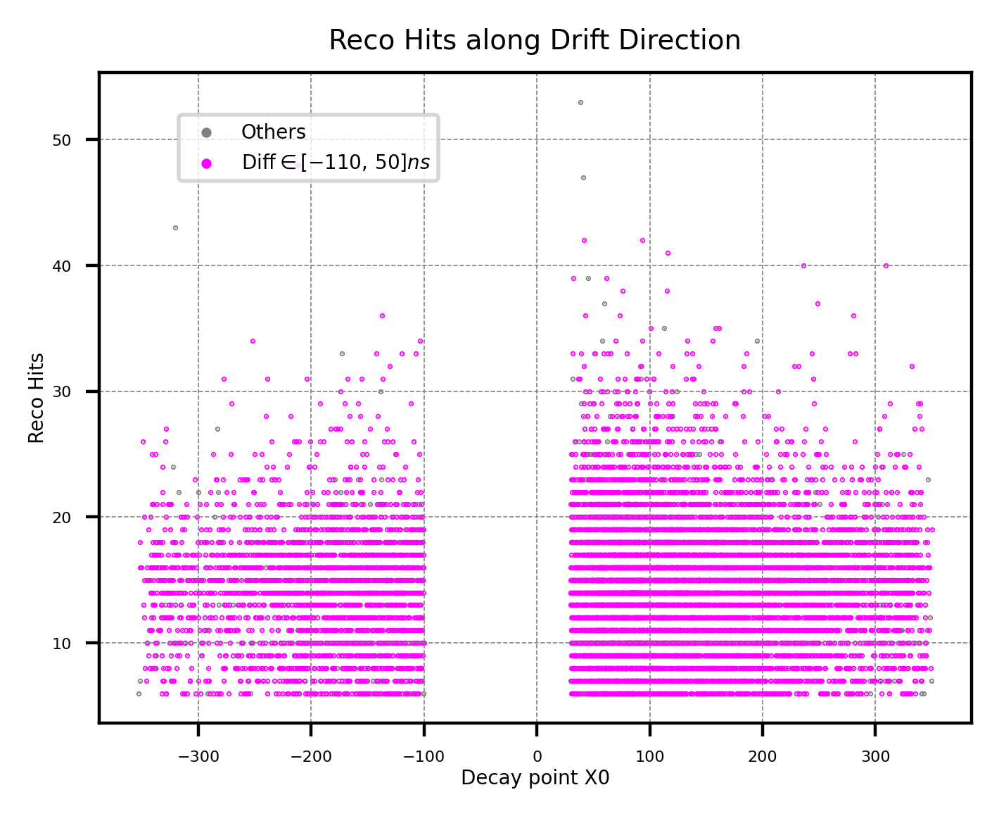


Michel Score Distribution: 


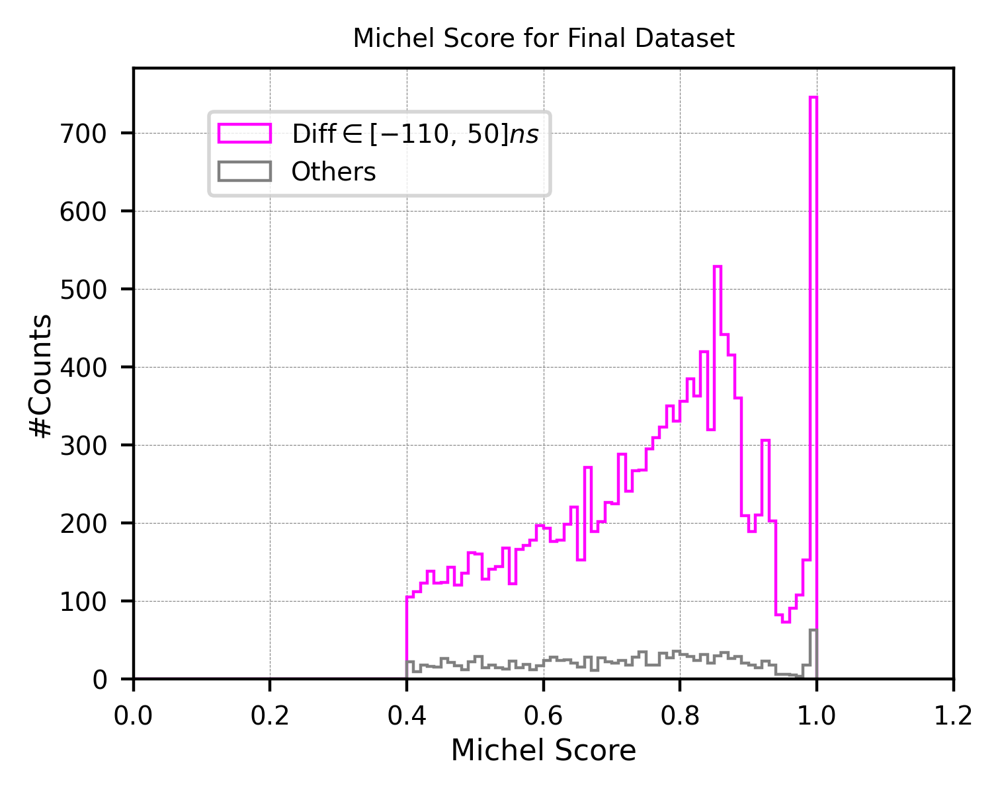


Michel Hits Distribution: 


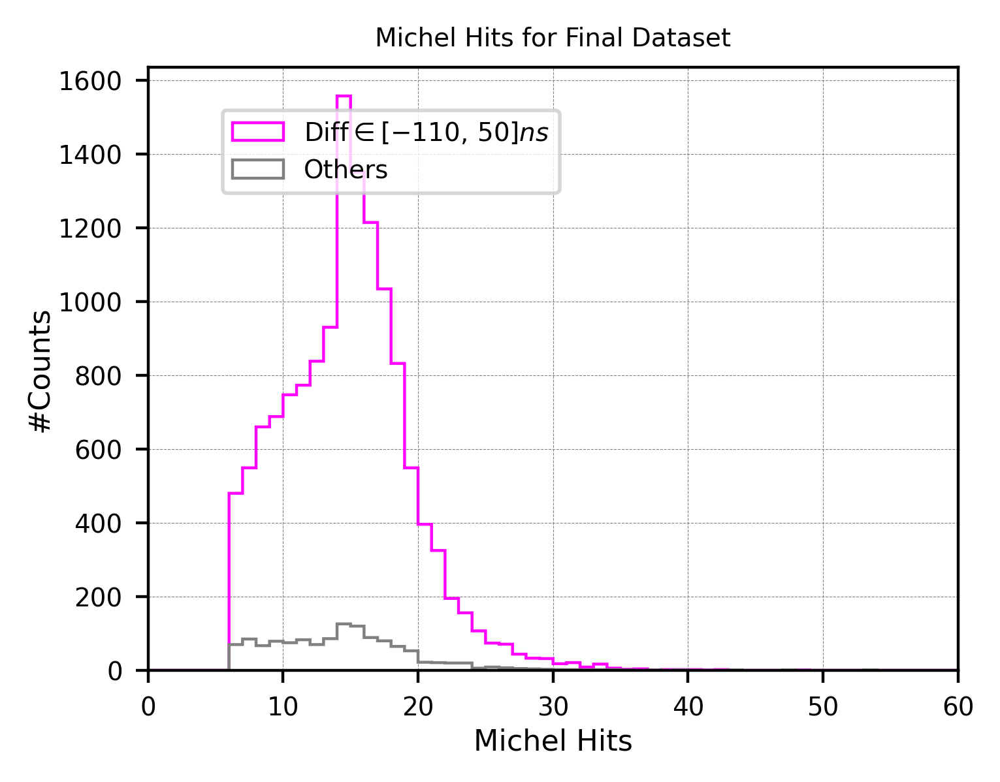

In [106]:
energy_diff500_purify9 = [ev.energy for ev in events_diff500_purify9]
energy_diff0_purify9 = [ev.energy for ev in events_diff0_purify9]
energy_total_purify9 = [ev.energy for ev in events_total_purify9]

hits_diff500_purify9 = [ev.michel_hits for ev in events_diff500_purify9]
hits_diff0_purify9 = [ev.michel_hits for ev in events_diff0_purify9]

score_diff500_purify9 = [ev.michel_score for ev in events_diff500_purify9]
score_diff0_purify9 = [ev.michel_score for ev in events_diff0_purify9]




#Decay points distribution:==========================================
print("\nEnergy Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 2
range_min =-1000
range_max = 1000
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(energy_total_purify9, bins=bins, range=(range_min, range_max), edgecolor='black', 
          histtype='step', linewidth=1.0, label="Total Final Dataset")
plt.hist(energy_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(energy_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------


plt.xlim(-10, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.9, 2000)
#plt.yscale('log')
plt.title('Energy Distribution of Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 










# ==========================================================
# reco hits VS posX
# ==========================================================
plt.figure(figsize=(4,3), dpi=400)

# Scatter plot----------
plt.scatter(posX_diff500_purify9, hits_diff500_purify9, s=0.1, c='grey', alpha=1.0, label="Others")
plt.scatter(posX_diff0_purify9, hits_diff0_purify9, s=0.1, c='magenta', alpha=1.0, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
#-----------------------

#plt.axis('scaled')
#plt.xlim(0, 2000)
#plt.ylim(0, 2000)
plt.ylabel('Reco Hits', labelpad=1, fontsize=5)
plt.xlabel('Decay point X0', labelpad=1, fontsize=5)
plt.title('Reco Hits along Drift Direction', fontsize=7)
plt.tick_params(labelsize=4)
plt.grid(color='gray', linestyle='--', linewidth=0.3, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.24, 0.95), fontsize=6, markerscale=5, ncol=1, prop={'size':5})
plt.show()








#Michel Score distribution:==========================================
print("\nMichel Score Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 0.01
range_min =-1
range_max = 1
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(score_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(score_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 1.2)
plt.xlabel('Michel Score', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Score for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 







#Michel Hits distribution:==========================================
print("\nMichel Hits Distribution: ")

# Plotting the histogram (X distribution)---------------
plt.figure(figsize=(4,3),dpi=400)


#Define the range and bin width
bin_width = 1
range_min =0
range_max = 600
bins = np.arange(range_min, range_max + bin_width, bin_width)

#--------------------------------
plt.hist(hits_diff0_purify9, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
          histtype='step', linewidth=0.8, label=r"$\mathrm{Diff} \in [-110,\,50]ns$")
plt.hist(hits_diff500_purify9, bins=bins, range=(range_min, range_max), edgecolor='grey', 
          histtype='step', linewidth=0.8, label="Others")

#--------------------------------

plt.xlim(0, 60)
plt.xlabel('Michel Hits', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
#plt.ylim(0.1, 200)
#plt.yscale('log')
plt.title('Michel Hits for Final Dataset', fontsize=7)
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.3, 0.95), fontsize=10, markerscale=6, ncol=1, prop={'size': 7})

plt.show() 





<br />
<br />
<br />

#### Lifetime Distribution of Final Dataset (purification 9):

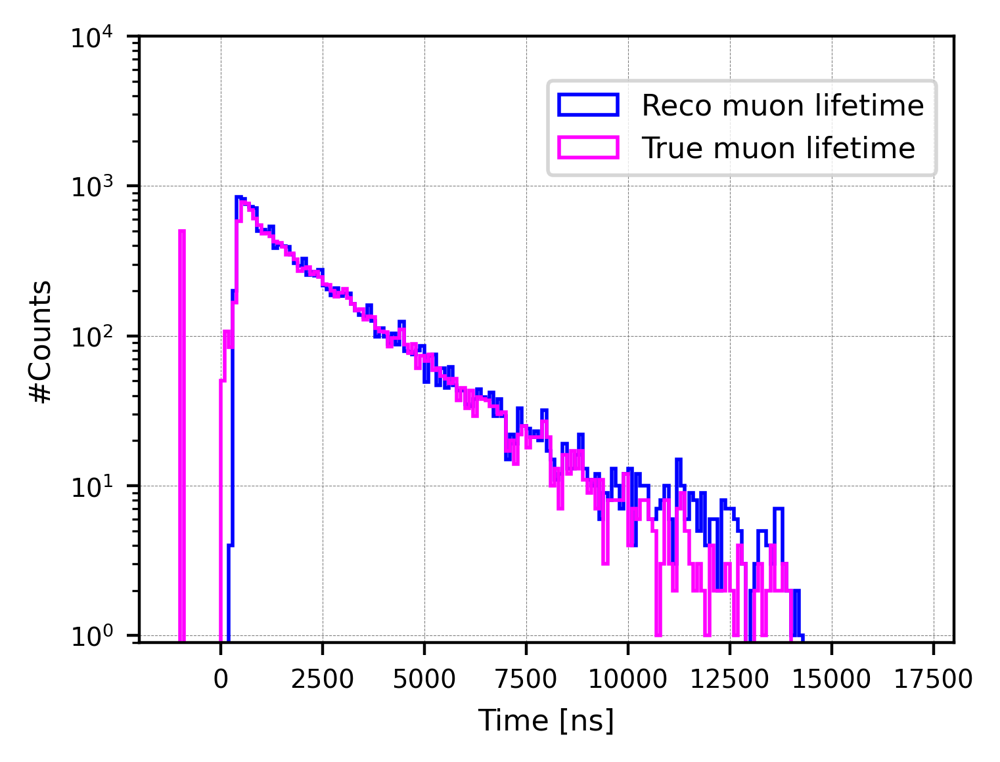



For each event, +40ns for reco time


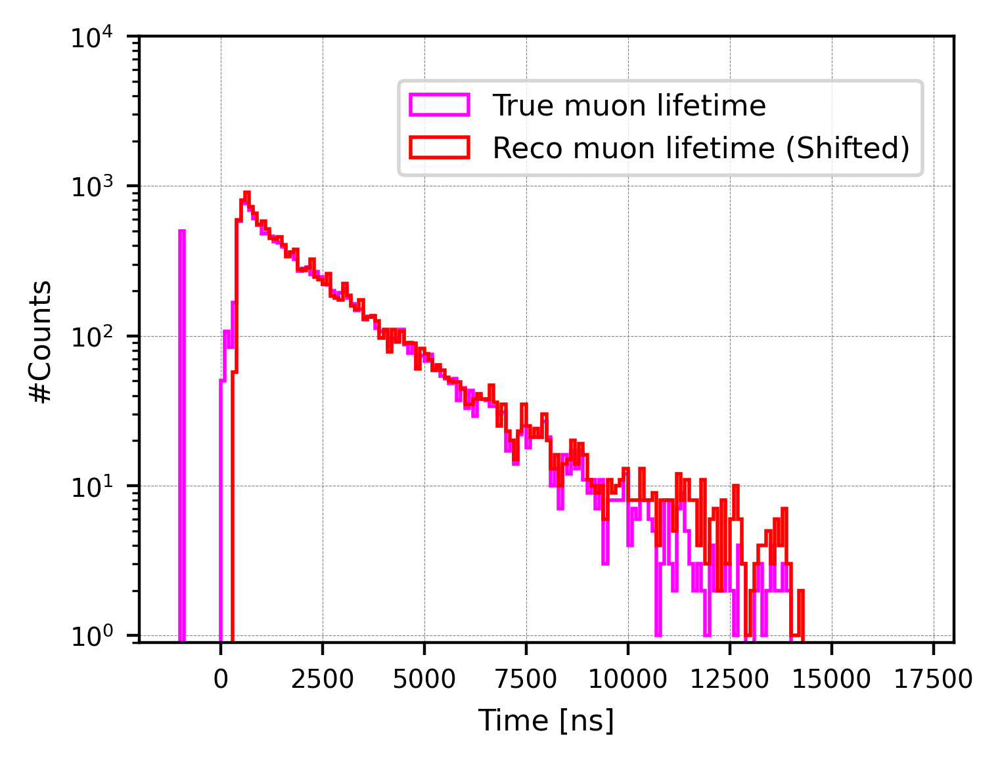

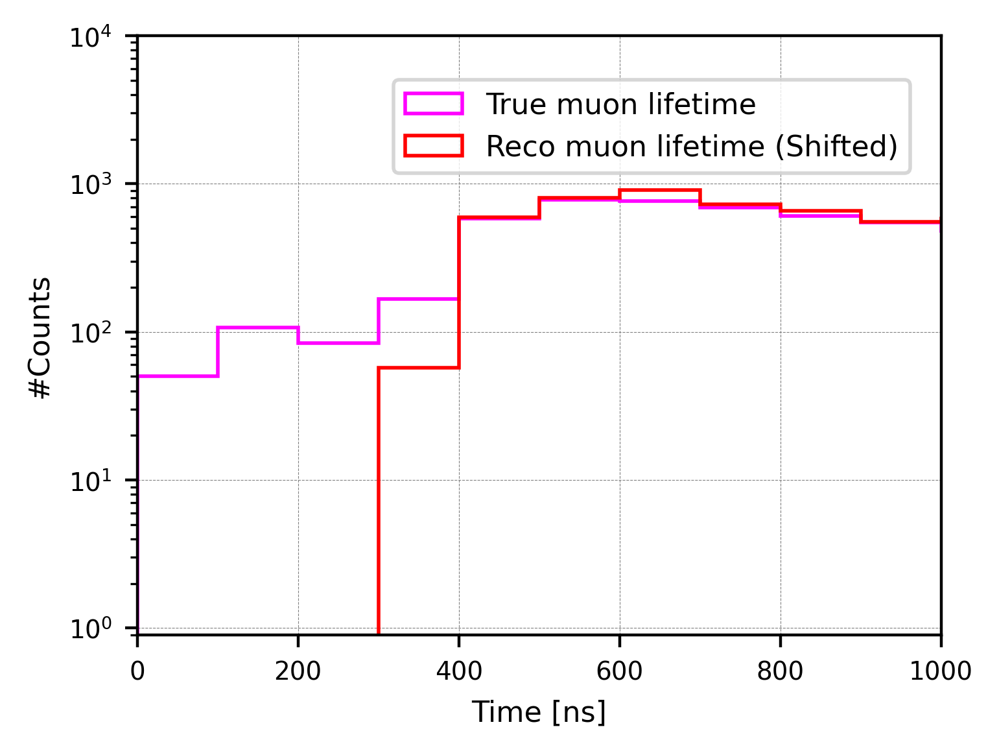

In [120]:

recoT_total_purify9 = [ev.reco_lifetime for ev in events_total_purify9]
trueT_total_purify9 = [ev.true_lifetime for ev in events_total_purify9]



# Muon Lifetime distribution (INITIAL; NO fitting)--------------------------------------------
plt.figure(figsize=(4, 3), dpi=400)


# Define histogram parameters
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.hist(recoT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='blue', histtype='step', linewidth=1.0,
         label='Reco muon lifetime')

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.xlim(-2000, 18000)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.74, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()




#Shift +40ns=========================================
print("\n\n===================================")
print("For each event, +40ns for reco time")
recoT_total_purify9_shift40 = [x + 40 for x in recoT_total_purify9]


bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)
#plt.hist(recoT_total_purify9, bins=bins, range=(range_min, range_max),
#         edgecolor='blue', histtype='step', linewidth=1.0,
#         label='Reco muon lifetime')

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0,
         label='Reco muon lifetime (Shifted)')

plt.xlim(-2000, 18000)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()







#Zoomed-in plot=========================================
print("\n\n===================================")


# Plot histogram-----------------
plt.figure(figsize=(4, 3), dpi=400)

plt.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=1.0,
         label='True muon lifetime')

plt.hist(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
         edgecolor='red', histtype='step', linewidth=1.0,
         label='Reco muon lifetime (Shifted)')

plt.xlim(0, 1000)
plt.ylim(0.9, 10000)
plt.yscale("log")
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
#plt.title('Purified (mu time [55, 65]) Lifetime')
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.legend(loc='upper center', bbox_to_anchor=(0.64, 0.95), fontsize=11, markerscale=5, ncol=1, prop={'size':8})
plt.show()




<br />
<br />
<br />

#### Fitting (Bin integrated) for lifetime distribution (purification 9):

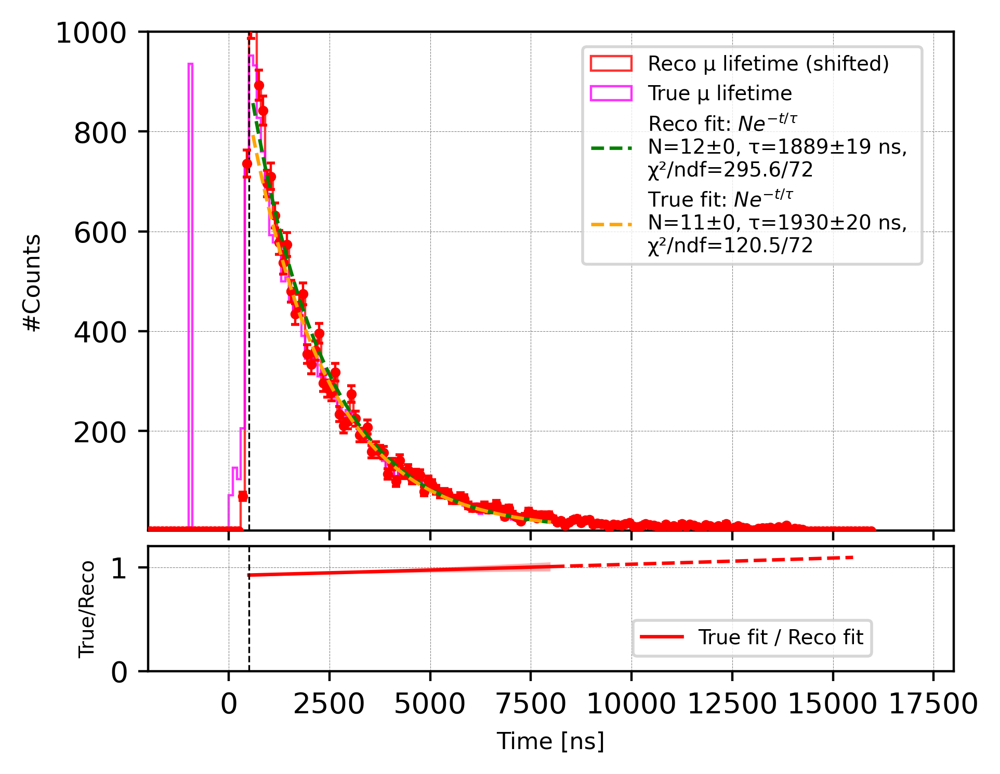

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from matplotlib.gridspec import GridSpec


#======Double Fitting with Ratio Panel==================================================
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

# Histogram binning
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# --- Bin-integrated models ---
def exp1_integrated(edges, N, tau):
    a, b = edges[:-1], edges[1:]
    return N * tau * (np.exp(-a/tau) - np.exp(-b/tau))

def exp1C_integrated(edges, N, tau, C):
    a, b = edges[:-1], edges[1:]
    return N * tau * (np.exp(-a/tau) - np.exp(-b/tau)) + C * (b - a)

# --- Helpers ---
def _safe_sigma(y):
    return np.sqrt(np.clip(y, 1.0, None))

def numerical_grad(func, params, cov, x, h=1e-6):
    """Compute propagated uncertainty for func(x,*params) given parameter covariance."""
    f0 = func(x, *params)
    nparams = len(params)
    grads = np.zeros((nparams, len(x)))

    # finite difference for each parameter
    for i in range(nparams):
        dp = np.zeros_like(params, dtype=float)
        dp[i] = h * (abs(params[i]) + 1.0)
        f1 = func(x, *(params+dp))
        f2 = func(x, *(params-dp))
        grads[i] = (f1 - f2) / (2*dp[i])

    # propagate covariance: per point variance
    var = np.zeros(len(x))
    for k in range(len(x)):
        gk = grads[:, k]               # gradient at point k
        var[k] = gk @ cov @ gk         # g^T Cov g
    return np.sqrt(var)


# --- Reco fit: N*exp(-t/tau) + C ---
def fit_and_overlay_exp1C(ax, sample, label, fit_min, fit_max, color=None, line_style='--'):
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    m = (centers >= fit_min) & (centers <= fit_max)
    y = counts[m]

    if len(y) < 3 or y.sum() <= 0:
        return None, None, None, None

    edges_fit = bin_edges[np.where(m)[0][0] : np.where(m)[0][-1] + 2]
    sigma = _safe_sigma(y)

    N0 = np.sum(y); tau0 = 2000.0; C0 = np.min(y)/max(bin_width,1)
    p0 = [N0, tau0, C0]

    popt, pcov = curve_fit(
        lambda e, N, tau, C: exp1C_integrated(e, N, tau, C),
        edges_fit, y, p0=p0, sigma=sigma,
        absolute_sigma=True, maxfev=20000
    )
    perr = np.sqrt(np.diag(pcov))

    chi2 = np.sum(((y - exp1C_integrated(edges_fit, *popt))/sigma)**2)
    ndf = len(y) - len(popt)

    t_smooth = np.linspace(fit_min, fit_max, 400)
    y_smooth = popt[0]*np.exp(-t_smooth/popt[1])*bin_width + popt[2]*bin_width

    ax.plot(t_smooth, y_smooth, line_style, linewidth=1.2, color=color, zorder=5,
            label=(rf"{label} fit: $Ne^{{-t/\tau}} + C$"
                   f"\nN={popt[0]:.0f}±{perr[0]:.0f}, "
                   f"τ={popt[1]:.0f}±{perr[1]:.0f} ns, "
                   f"\nC={popt[2]:.1f}±{perr[2]:.1f}, "
                   f"χ²/ndf={chi2:.1f}/{ndf}"))

    return t_smooth, y_smooth, popt, pcov

# --- True fit: N*exp(-t/tau) ---
def fit_and_overlay_exp1(ax, sample, label, fit_min, fit_max, color=None):
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    m = (centers >= fit_min) & (centers <= fit_max)
    y = counts[m]

    if len(y) < 3 or y.sum() <= 0:
        return None, None, None, None

    edges_fit = bin_edges[np.where(m)[0][0] : np.where(m)[0][-1] + 2]
    sigma = _safe_sigma(y)

    N0 = np.sum(y); tau0 = 2000.0
    p0 = [N0, tau0]

    popt, pcov = curve_fit(
        lambda e, N, tau: exp1_integrated(e, N, tau),
        edges_fit, y, p0=p0, sigma=sigma,
        absolute_sigma=True, maxfev=20000
    )
    perr = np.sqrt(np.diag(pcov))

    chi2 = np.sum(((y - exp1_integrated(edges_fit, *popt))/sigma)**2)
    ndf = len(y) - len(popt)

    t_smooth = np.linspace(fit_min, fit_max, 400)
    y_smooth = popt[0]*np.exp(-t_smooth/popt[1])*bin_width

    ax.plot(t_smooth, y_smooth, linestyle='--', linewidth=1.2, color=color, zorder=5,
            label=(rf"{label} fit: $Ne^{{-t/\tau}}$"
                   f"\nN={popt[0]:.0f}±{perr[0]:.0f}, "
                   f"τ={popt[1]:.0f}±{perr[1]:.0f} ns, "
                   f"\nχ²/ndf={chi2:.1f}/{ndf}"))

    return t_smooth, y_smooth, popt, pcov

# -------- Top panel --------
ax1 = fig.add_subplot(gs[0])

# Histograms (faint outlines) + errors
counts_reco, bin_edges_reco, _ = ax1.hist(
    recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max),
    edgecolor='red', histtype='step', linewidth=0.8, alpha=0.8,
    label='Reco μ lifetime (shifted)', zorder=1
)
bin_centers_reco = 0.5*(bin_edges_reco[:-1]+bin_edges_reco[1:])
ax1.errorbar(bin_centers_reco, counts_reco,
             yerr=np.sqrt(np.clip(counts_reco,0,None)),
             fmt='o', color='red', markersize=2.5,
             elinewidth=0.8, capsize=1.5, zorder=3)

ax1.hist(trueT_total_purify9, bins=bins, range=(range_min, range_max),
         edgecolor='magenta', histtype='step', linewidth=0.8,
         alpha=0.8, label='True μ lifetime', zorder=1)

# Fits
#t_reco, fit_reco, popt_reco, pcov_reco = fit_and_overlay_exp1C(ax1, recoT_total_purify9_shift40, "Reco",
#                                                               500, 8000, color="green")
t_reco, fit_reco, popt_reco, pcov_reco = fit_and_overlay_exp1(ax1, recoT_total_purify9_shift40, "Reco",
                                                               600, 8000, color="green")
t_true, fit_true, popt_true, pcov_true = fit_and_overlay_exp1(ax1, trueT_total_purify9, "True",
                                                              600, 8000, color="orange")

# Style
ax1.set_xlim(-2000, 16000)
ax1.tick_params(labelbottom=False)
ax1.set_ylim(0.1, 1000)
#ax1.set_yscale('log')
ax1.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax1.set_ylabel('#Counts', fontsize=8)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.75, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

# -------- Bottom panel (ratio) --------
ax2 = fig.add_subplot(gs[1], sharex=ax1)
if (popt_reco is not None) and (popt_true is not None):
    t_common = np.linspace(500, 15500, 400)

#    f_reco = lambda x, N, tau, C: N*np.exp(-x/tau)*bin_width + C*bin_width
    f_reco = lambda x, N, tau: N*np.exp(-x/tau)*bin_width
    f_true = lambda x, N, tau: N*np.exp(-x/tau)*bin_width

    fit_reco_common = f_reco(t_common, *popt_reco)
    fit_true_common = f_true(t_common, *popt_true)
    ratio = np.divide(fit_true_common, fit_reco_common,
                      out=np.zeros_like(fit_true_common),
                      where=(fit_reco_common>0))

    # --- Error bands (only valid in fit range ≤ 8000) ---
    sigma_true = numerical_grad(f_true, np.array(popt_true), pcov_true, t_common)
    sigma_reco = numerical_grad(f_reco, np.array(popt_reco), pcov_reco, t_common)
    sigma_ratio = np.sqrt((sigma_true/fit_reco_common)**2 +
                          (fit_true_common * sigma_reco / fit_reco_common**2)**2)

    mask_fit = t_common <= 8000
    mask_extrap = t_common > 8000

    # Plot ratio: solid inside fit range, dashed outside
    ax2.plot(t_common[mask_fit], ratio[mask_fit],
             color='red', linewidth=1.2, label='True fit / Reco fit')
    ax2.plot(t_common[mask_extrap], ratio[mask_extrap],
             color='red', linewidth=1.2, linestyle='--')

    # Fill band only in fit range
    ax2.fill_between(t_common[mask_fit],
                     ratio[mask_fit] - sigma_ratio[mask_fit],
                     ratio[mask_fit] + sigma_ratio[mask_fit],
                     color='red', alpha=0.3, linewidth=0)

ax2.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax2.set_xlim(-2000, 18000)
ax2.set_ylim(0.0, 1.2)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('True/Reco', fontsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(loc='upper center', bbox_to_anchor=(0.75, 0.49),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

plt.show()

<br />
<br />
<br />

## Lifetime measurement efficiency:

#### Efficiency for final dataset (Note: The ratio here is NOT very helpful...):

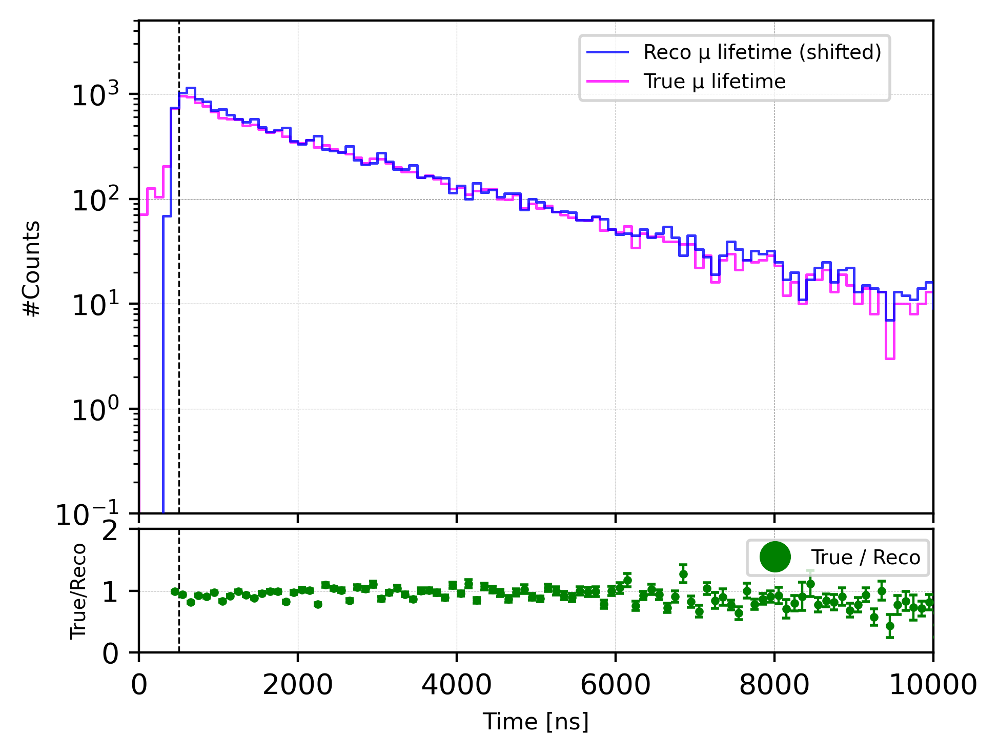

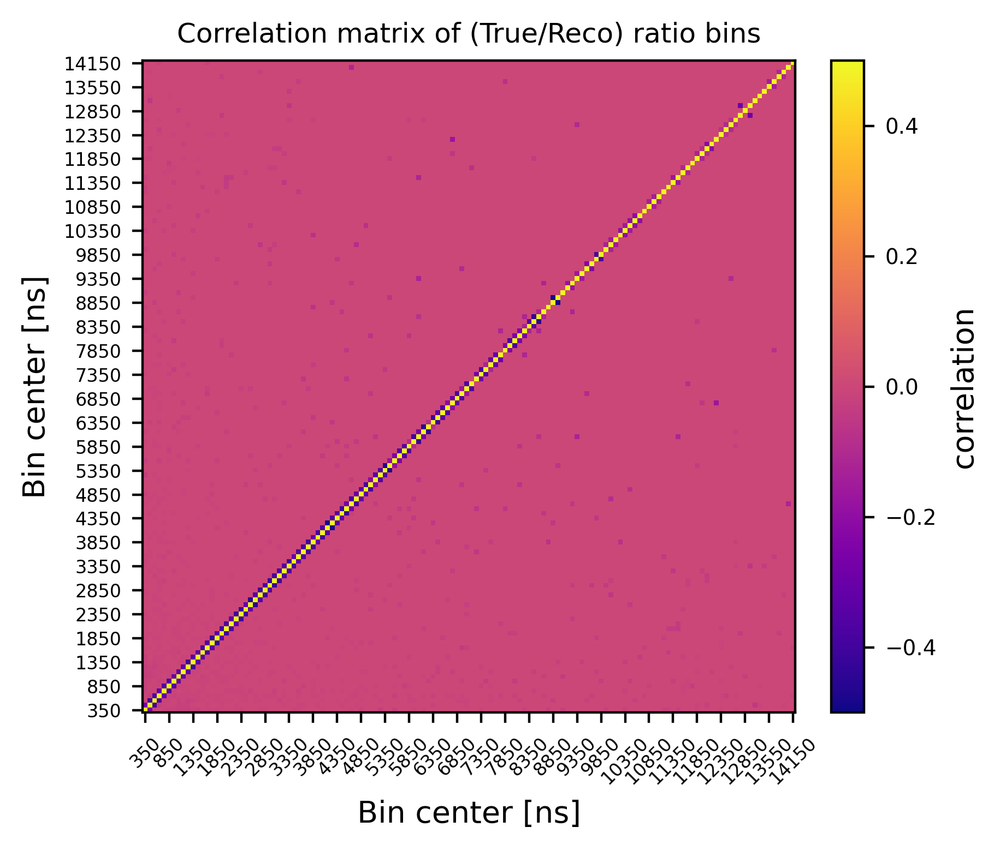

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# ====== Extract lifetimes =====================================================
recoT_total_purify9 = [ev.reco_lifetime for ev in events_total_purify9]
trueT_total_purify9 = [ev.true_lifetime for ev in events_total_purify9]
recoT_total_purify9_shift40 = [x + 40 for x in recoT_total_purify9]  # ns shift

# ====== Double Panel: Hist + Ratio ============================================
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

# Histogram binning
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)
bin_centers = 0.5 * (bins[:-1] + bins[1:])
nb = len(bin_centers)

# -------- Top panel -----------------------------------------------------------
ax1 = fig.add_subplot(gs[0])

# Histograms (paired events)
counts_reco, _ = np.histogram(recoT_total_purify9_shift40, bins=bins, range=(range_min, range_max))
counts_true, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))

# Plot both as step histograms
ax1.step(bins[:-1], counts_reco, where='post', color='blue',
         linewidth=0.9, alpha=0.8, label='Reco μ lifetime (shifted)', zorder=3)
ax1.step(bins[:-1], counts_true, where='post', color='magenta',
         linewidth=0.9, alpha=0.8, label='True μ lifetime', zorder=2)

# Style
ax1.set_xlim(-2000, 16000)
ax1.tick_params(labelbottom=False)
ax1.set_ylim(0.1, 5000)
ax1.set_yscale('log')
ax1.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax1.set_ylabel('#Counts', fontsize=8)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.75, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

# -------- Build 2D joint histogram (True vs Reco) -----------------------------
joint, _, _ = np.histogram2d(trueT_total_purify9, recoT_total_purify9_shift40, bins=[bins, bins])
N = joint.sum()
if N == 0:
    raise ValueError("No events found in joint histogram!")

# Empirical probabilities
p = joint / N
pT = p.sum(axis=1)  # marginal over reco (true dist)
pC = p.sum(axis=0)  # marginal over true (reco dist)

# -------- Build covariance matrices ------------------------------------------
Cov_TT = np.zeros((nb, nb))
Cov_CC = np.zeros((nb, nb))
Cov_TC = np.zeros((nb, nb))
for i in range(nb):
    for j in range(nb):
        Cov_TT[i, j] = N * ((pT[i] if i == j else 0.0) - pT[i] * pT[j])
        Cov_CC[i, j] = N * ((pC[i] if i == j else 0.0) - pC[i] * pC[j])
for i in range(nb):
    for k in range(nb):
        Cov_TC[i, k] = N * (p[i, k] - pT[i] * pC[k])

# -------- Ratio and correlated propagation -----------------------------------
mask = counts_reco > 0
ratio = np.full(nb, np.nan)
ratio[mask] = counts_true[mask] / counts_reco[mask]

# Jacobians for delta propagation
J_T = np.zeros((nb, nb))
J_C = np.zeros((nb, nb))
for i in range(nb):
    if counts_reco[i] > 0:
        J_T[i, i] = 1.0 / counts_reco[i]
        J_C[i, i] = -counts_true[i] / (counts_reco[i] ** 2)

# Full covariance of ratio (includes bin correlations!)
Cov_R = (
    J_T @ Cov_TT @ J_T.T +
    J_C @ Cov_CC @ J_C.T +
    J_T @ Cov_TC @ J_C.T +
    J_C @ Cov_TC.T @ J_T.T
)
sigma_ratio = np.sqrt(np.clip(np.diag(Cov_R), 0, np.inf))

# -------- Bottom panel (ratio) -----------------------------------------------
ax2 = fig.add_subplot(gs[1], sharex=ax1)
ax2.errorbar(bin_centers, ratio, yerr=sigma_ratio,
             fmt='o', color='green', markersize=2.0,
             elinewidth=0.8, capsize=1.5, label='True / Reco', zorder=3)

ax2.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax2.set_xlim(0, 10000)
ax2.set_ylim(0.0, 2.0)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('True/Reco', fontsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(loc='upper center', bbox_to_anchor=(0.88, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})

plt.show()






good_bins = np.where(mask & np.isfinite(ratio) & (sigma_ratio > 0))[0]

# Build correlation matrix
Cov_valid = Cov_R[np.ix_(good_bins, good_bins)]
sigma_valid = np.sqrt(np.clip(np.diag(Cov_valid), 1e-12, np.inf))
corr_masked = Cov_valid / np.outer(sigma_valid, sigma_valid)
corr_masked = np.clip(corr_masked, -1.0, 1.0)


# Example: show tick labels every Nth bin
tick_step = 5
tick_idx = np.arange(0, len(good_bins), tick_step)
tick_labels = (bin_centers[good_bins][tick_idx]).astype(int)

plt.figure(figsize=(5, 4), dpi=400)
im = plt.imshow(
    corr_masked,
    vmin=-0.5, vmax=0.5,
    cmap='plasma',
    origin='lower',
    interpolation='nearest'
)
plt.title("Correlation matrix of (True/Reco) ratio bins", fontsize=9)
plt.xticks(tick_idx, tick_labels, rotation=45, fontsize=6)
plt.yticks(tick_idx, tick_labels, fontsize=6)
plt.xlabel("Bin center [ns]")
plt.ylabel("Bin center [ns]")
cbar = plt.colorbar(im, label='correlation', fraction=0.046, pad=0.04)
cbar.ax.tick_params(labelsize=7)
plt.tight_layout()
plt.show()





#### Initial True Michel and Final True Michel---

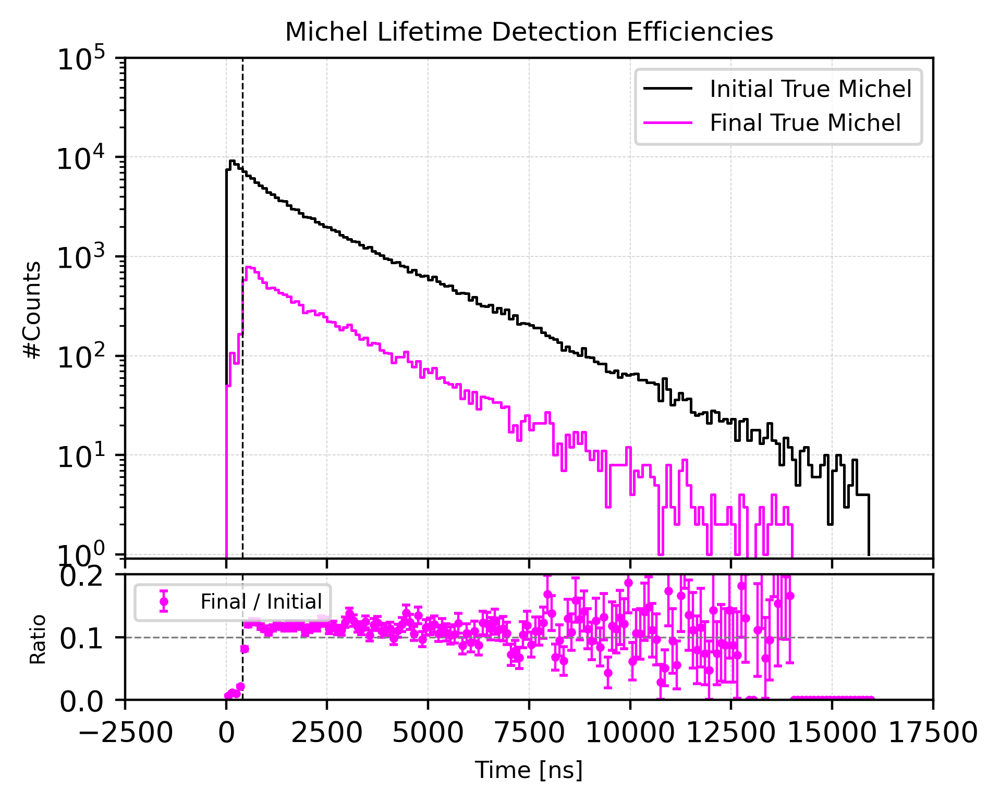

✅ Efficiency ratio and binomial uncertainties stored.
  Number of bins: 320
  Example efficiency range: 0.000–0.286
  Mean relative error: 26.205%
✅ Saved 160 valid bins for later use.
Example: bin=50 ns, ratio=0.007 ± 0.001


/var/folders/c9/547_2pf11mv74b226lzvqwj00000gn/T/ipykernel_63093/1210679771.py:82: RuntimeWarning: invalid value encountered in divide
  rel_err = err_eff[mask] / eff[mask]


In [126]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy.ma as ma

# ----------------------------- Inputs ---------------------------------
trueMichel_initial = np.load("lifetime_trueMichel_initial.npy", allow_pickle=True).tolist()
trueT_total_purify9 = np.asarray(trueT_total_purify9)

# ----------------------------- Binning --------------------------------
bin_width = 100
range_min, range_max = -16000, 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5 * (bins[:-1] + bins[1:])
nb = len(centers)

# ----------------------------- Histos ---------------------------------
I, _ = np.histogram(trueMichel_initial, bins=bins, range=(range_min, range_max))
F, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))

I = I.astype(float)
F = np.minimum(F.astype(float), I)  # guard: ensure F ≤ I
mask = I > 0

# ----------------------------- Efficiency -----------------------------
eff = np.full(nb, np.nan)
eff[mask] = F[mask] / I[mask]

# Binomial (conditional) uncertainty: sqrt(p(1-p)/I)
err_eff = np.full(nb, np.nan)
err_eff[mask] = np.sqrt(np.clip(eff[mask] * (1 - eff[mask]) / I[mask], 0, np.inf))

# Covariance: diagonal only (bins independent)
Cov_eff = np.zeros((nb, nb))
Cov_eff[np.diag_indices(nb)] = np.nan_to_num(err_eff ** 2, nan=0.0)


# ----------------------------- Plots ----------------------------------
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

# Top panel: counts
ax1 = fig.add_subplot(gs[0])
ax1.step(bins[:-1], I, where='post', color='black', lw=0.9, label='Initial True Michel')
ax1.step(bins[:-1], F, where='post', color='magenta', lw=0.9, label='Final True Michel')
ax1.set_yscale('log')
ax1.set_ylim(0.9, 100000)
ax1.set_xlim(-2000, 16000)
ax1.axvline(400, ls='--', c='k', lw=0.6)
ax1.set_ylabel('#Counts', fontsize=8)
ax1.set_title("Michel Lifetime Detection Efficiencies", fontsize=9)
ax1.legend(fontsize=8, loc='upper right')
ax1.grid(ls='--', lw=0.3, alpha=0.6)
ax1.tick_params(labelbottom=False)

# Bottom panel: efficiency
ax2 = fig.add_subplot(gs[1], sharex=ax1)
ax2.errorbar(centers[mask], eff[mask], yerr=err_eff[mask],
             fmt='o', ms=2.0, elinewidth=0.8, capsize=1.5,
             color='magenta', label='Final / Initial')
ax2.axvline(400, ls='--', c='k', lw=0.6)
ax2.axhline(0.1, ls='--', c='gray', lw=0.6)
ax2.set_xlim(-2500, 17500)
ax2.set_ylim(0.0, 0.2)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('Ratio', fontsize=7)
ax2.grid(ls='--', lw=0.3, alpha=0.6)
ax2.legend(fontsize=7, loc='upper left')
plt.show()

# ----------------------------- Save Results ---------------------------
lifetime_efficiency = eff.copy()
lifetime_efficiency_unc = err_eff.copy()
Cov_efficiency = Cov_eff.copy()
bin_edges_eff = bins.copy()
bin_centers_eff = centers.copy()

print("✅ Efficiency ratio and binomial uncertainties stored.")
print(f"  Number of bins: {len(lifetime_efficiency)}")
print(f"  Example efficiency range: {np.nanmin(lifetime_efficiency):.3f}–{np.nanmax(lifetime_efficiency):.3f}")

rel_err = err_eff[mask] / eff[mask]
print(f"  Mean relative error: {np.nanmean(rel_err):.3%}")



# ============================================================
# Save efficiency ratios and uncertainties for later notebook use
# ============================================================

# Keep only valid (I > 0) bins
valid_idx = np.where(I > 0)[0]

# Lists for later use
efficiency_bins = centers[valid_idx].tolist()       # bin centers [ns]
efficiency_ratio = eff[valid_idx].tolist()          # Final / Initial
efficiency_uncertainty = err_eff[valid_idx].tolist()  # Binomial σ

print(f"✅ Saved {len(efficiency_ratio)} valid bins for later use.")
print(f"Example: bin={efficiency_bins[0]:.0f} ns, ratio={efficiency_ratio[0]:.3f} ± {efficiency_uncertainty[0]:.3f}")



<br />
<br />

#### Apply efficiency curve (CORE):

n_final total entries: 15004.0
Nonzero bins: 863 / 102400


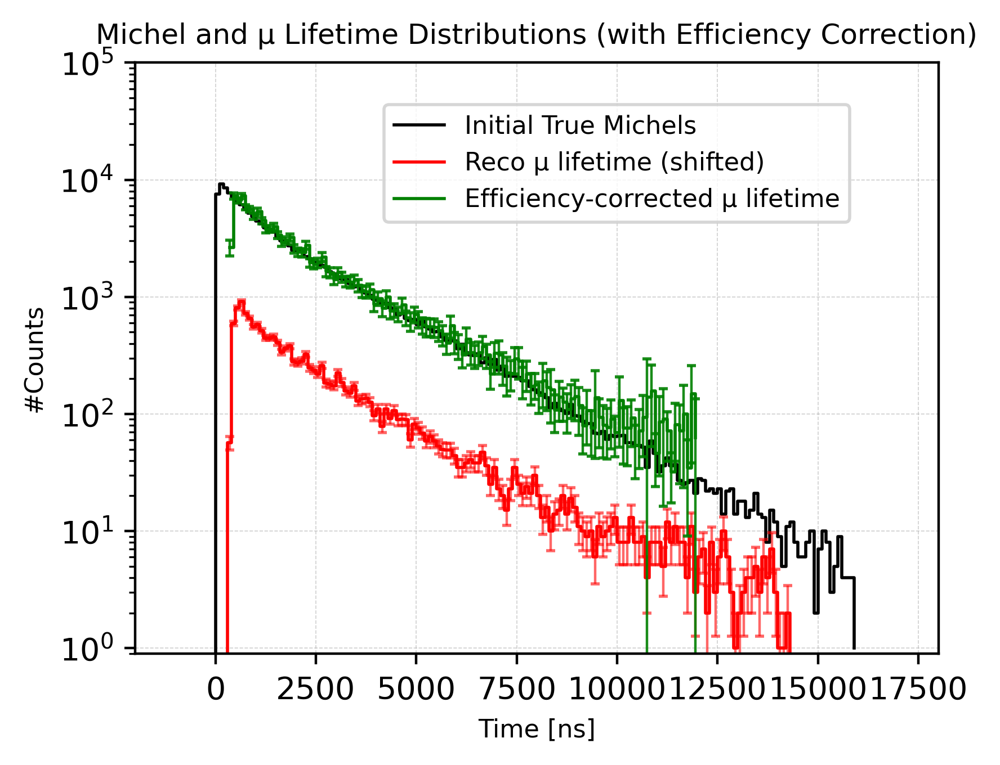

✅ Efficiency-corrected reco histogram built for 117 bins.
   Mean correction factor ≈ 137500000010.36×

BinCenter [ns] | TotalError | DataTerm | EffTerm
--------------------------------------------------
      350      404.885     350.294     203.042
      450      415.753     298.820     289.063
      550      324.970     235.496     223.935
      650      344.638     241.092     246.272
      750      300.236     216.959     207.535
      850      307.433     219.466     215.290
      950      285.753     207.684     196.271
     1050      321.791     222.996     231.996
     1150      274.852     197.238     191.418
     1250      242.622     178.246     164.602
     1350      249.310     179.925     172.575
     1450      260.881     185.769     183.163
     1550      230.835     167.092     159.264
     1650      216.930     158.999     147.573
     1750      218.936     158.847     150.667
     1850      234.830     164.756     167.334
     1950      212.694     153.596     147.1

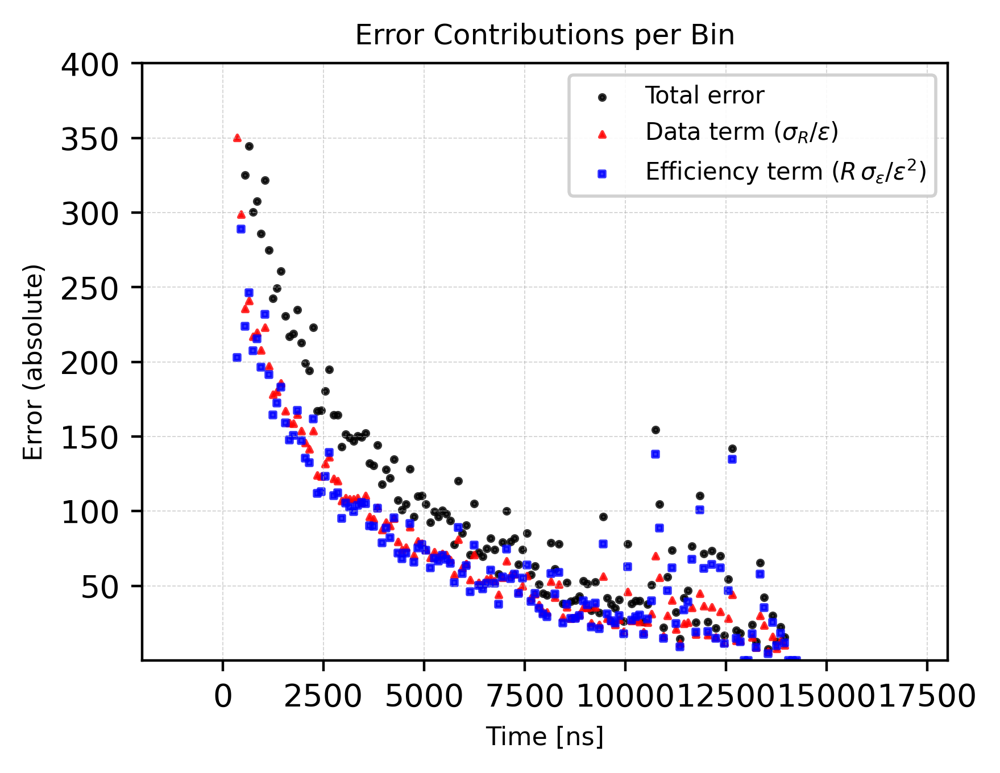

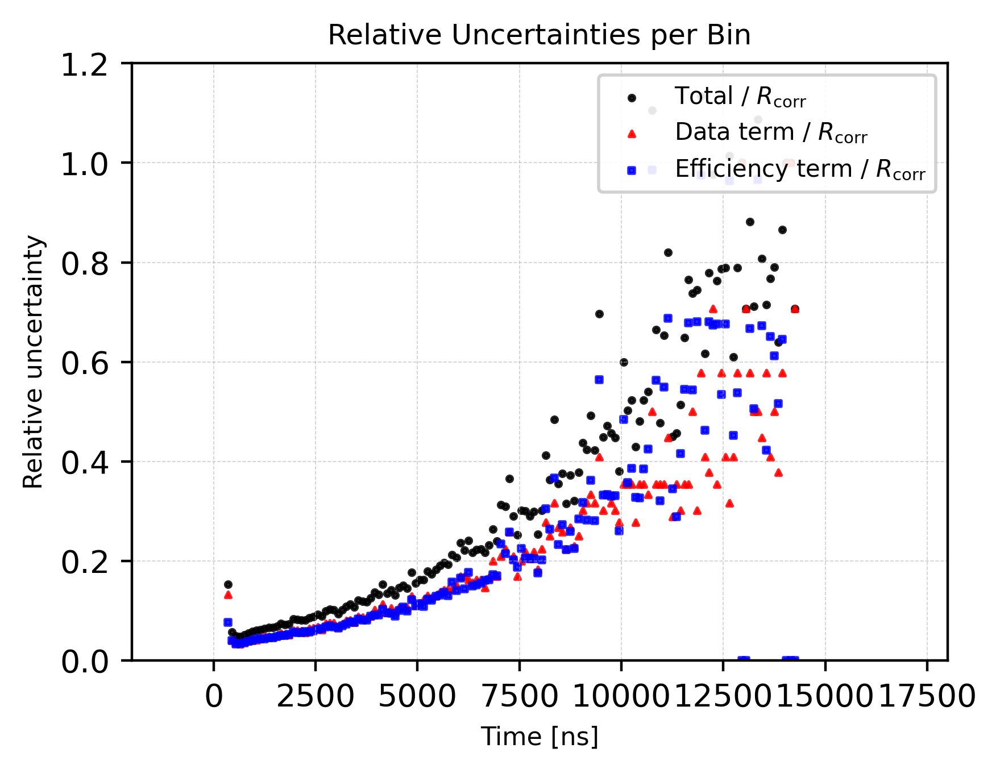

In [134]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1. Binning setup — reuse from efficiency calculation
# ============================================================
bins = bin_edges_eff.copy()
centers = bin_centers_eff.copy()
nb = len(centers)


# ============================================================
# 2. Load efficiency results from previous cell
# ============================================================
eff = np.clip(lifetime_efficiency, 1e-12, None)              # ratio Final/Initial
eff_unc = np.nan_to_num(lifetime_efficiency_unc, nan=0.0)    # binomial uncertainty
Cov_eff = Cov_efficiency.copy()                              # diagonal covariance


# ============================================================
# 3. Build final true–reco 2D table from paired events
# ============================================================
true_idx = np.digitize(trueT_total_purify9, bins) - 1
reco_idx = np.digitize(recoT_total_purify9_shift40, bins) - 1

valid = (
    (true_idx >= 0) & (true_idx < nb) &
    (reco_idx >= 0) & (reco_idx < nb)
)
true_idx = true_idx[valid]
reco_idx = reco_idx[valid]

# 2D true–reco histogram after cuts
n_final = np.zeros((nb, nb), dtype=float)
np.add.at(n_final, (true_idx, reco_idx), 1.0)

print(f"n_final total entries: {np.sum(n_final)}")
print(f"Nonzero bins: {np.count_nonzero(n_final)} / {nb*nb}")


# ============================================================
# 4. Apply efficiency correction (A/B-style propagation)
# ============================================================
# Reco histogram before correction
counts_reco, _ = np.histogram(recoT_total_purify9_shift40, bins=bins)
sigma_reco = np.sqrt(np.clip(counts_reco, 0, None))

# Efficiency-corrected spectrum: simple division (float-safe)
R_corr = np.divide(counts_reco.astype(float), eff,
                   out=np.zeros_like(counts_reco, dtype=float),
                   where=eff > 0)

# Propagate error: σ² = (σ_R/ε)² + (R * σ_ε / ε²)²
Var_Rcorr = (
    (sigma_reco / np.clip(eff, 1e-12, None)) ** 2 +
    ((counts_reco * eff_unc) / np.clip(eff, 1e-12, None) ** 2) ** 2
)
sigma_R_corr = np.sqrt(np.clip(Var_Rcorr, 0, None))


# ============================================================
# 5. Reference histograms (for visual comparison)
# ============================================================
counts_initial, _ = np.histogram(trueMichel_initial, bins=bins, range=(range_min, range_max))

# ============================================================
# 6. Plot
# ============================================================
plt.figure(figsize=(4.5, 3.5), dpi=400)

# (a) Initial true Michel
plt.step(bins[:-1], counts_initial, where='post',
         color='black', linewidth=1.0, label='Initial True Michels')

# (b) Reco μ lifetime (shifted)
plt.step(bins[:-1], counts_reco, where='post',
         color='red', linewidth=1.0, label='Reco μ lifetime (shifted)')
plt.errorbar(centers, counts_reco, yerr=sigma_reco,
             fmt='none', ecolor='red', elinewidth=0.8, capsize=1.5, alpha=0.6)

# (c) Efficiency-corrected μ lifetime
region_mask = (centers >= 0) & (centers <= 12000) & np.isfinite(R_corr) & (R_corr > 0)
plt.plot(centers[region_mask], R_corr[region_mask],
         drawstyle='steps-post', color='green', lw=1.0, label='Efficiency-corrected μ lifetime')
plt.errorbar(centers[region_mask], R_corr[region_mask],
             yerr=sigma_R_corr[region_mask],
             fmt='none', ecolor='green', elinewidth=0.8, capsize=1.5, alpha=0.9)

# Axes and style
plt.xlim(-2000, 18000)
plt.ylim(0.9, 100000)
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('#Counts', fontsize=8)
plt.yscale('log')
plt.grid(ls='--', lw=0.3, alpha=0.6)
plt.legend(loc='upper center', bbox_to_anchor=(0.6, 0.95), fontsize=8)
plt.title('Michel and μ Lifetime Distributions (with Efficiency Correction)', fontsize=9)
plt.tight_layout()
plt.show()


# ============================================================
# 7. Save outputs for later fitting or ratio comparisons
# ============================================================
effcorr_reco_counts = R_corr.copy()
effcorr_reco_unc = sigma_R_corr.copy()

Var_data = (sigma_reco / np.clip(eff, 1e-12, None)) ** 2
Var_eff = ((counts_reco * eff_unc) / np.clip(eff, 1e-12, None) ** 2) ** 2
Cov_effcorr_reco = np.diag(Var_data + Var_eff)

print(f"✅ Efficiency-corrected reco histogram built for {np.count_nonzero(region_mask)} bins.")
print(f"   Mean correction factor ≈ {np.nanmean(1/eff[eff>0]):.2f}×")




# ============================================================
# 8. Print per-bin error decomposition
# ============================================================

# Compute the two contributions explicitly
term_data = (sigma_reco / np.clip(eff, 1e-12, None)) ** 2
term_eff  = ((counts_reco * eff_unc) / np.clip(eff, 1e-12, None) ** 2) ** 2

print("\nBinCenter [ns] | TotalError | DataTerm | EffTerm")
print("--------------------------------------------------")
for i in range(nb):
    if not np.isfinite(R_corr[i]) or R_corr[i] <= 0:
        continue  # skip empty bins
    total_err = np.sqrt(term_data[i] + term_eff[i])
    data_err  = np.sqrt(term_data[i])
    eff_err   = np.sqrt(term_eff[i])
    print(f"{centers[i]:9.0f}   {total_err:10.3f}   {data_err:9.3f}   {eff_err:9.3f}")







# ============================================================
# 8b. Save errors and plot contributions vs. time
# ============================================================

# Initialize storage lists
bin_center_list = []
total_err_list  = []
data_err_list   = []
eff_err_list    = []

for i in range(nb):
    if not np.isfinite(R_corr[i]) or R_corr[i] <= 0:
        continue
    total_err = np.sqrt(term_data[i] + term_eff[i])
    data_err  = np.sqrt(term_data[i])
    eff_err   = np.sqrt(term_eff[i])
    bin_center_list.append(centers[i])
    total_err_list.append(total_err)
    data_err_list.append(data_err)
    eff_err_list.append(eff_err)

# Convert to numpy arrays (optional)
bin_center_arr = np.array(bin_center_list)
total_err_arr  = np.array(total_err_list)
data_err_arr   = np.array(data_err_list)
eff_err_arr    = np.array(eff_err_list)

# ============================================================
# Plot error components as scatter points
# ============================================================
plt.figure(figsize=(4.5, 3.5), dpi=400)

# total error — solid black circles
plt.scatter(bin_center_arr, total_err_arr, color='black', s=3, label='Total error', alpha=0.8)

# data term — red triangles
plt.scatter(bin_center_arr, data_err_arr, color='red', marker='^', s=3,
            label=r'Data term $(\sigma_R/\varepsilon)$', alpha=0.8)

# efficiency term — blue squares
plt.scatter(bin_center_arr, eff_err_arr, color='blue', marker='s', s=3,
            label=r'Efficiency term $(R\,\sigma_\varepsilon/\varepsilon^2)$', alpha=0.8)

# Axis & style
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Error (absolute)', fontsize=8)
#plt.yscale('log')
plt.xlim(-2000, 18000)
plt.ylim(1e-3, 400)
plt.grid(ls='--', lw=0.3, alpha=0.6)

# Legend
plt.legend(fontsize=7.5, loc='upper right', frameon=True, framealpha=0.9)
plt.title('Error Contributions per Bin', fontsize=9)
plt.tight_layout()
plt.show()







# ============================================================
# 8c. Calculate and plot relative uncertainties
# ============================================================

# Match R_corr values to the same valid bins as in bin_center_arr
R_corr_valid = np.array([R_corr[np.where(centers == c)[0][0]] for c in bin_center_arr])

# Compute relative uncertainties (σ / R_corr)
rel_total_arr = np.divide(total_err_arr, R_corr_valid, out=np.full_like(total_err_arr, np.nan))
rel_data_arr  = np.divide(data_err_arr,  R_corr_valid, out=np.full_like(data_err_arr,  np.nan))
rel_eff_arr   = np.divide(eff_err_arr,   R_corr_valid, out=np.full_like(eff_err_arr,   np.nan))

# --- Plot relative uncertainties ---
plt.figure(figsize=(4.5, 3.5), dpi=400)

# total — black circles
plt.scatter(bin_center_arr, rel_total_arr, color='black', s=3, label='Total / $R_{\\mathrm{corr}}$', alpha=0.85)

# data term — red triangles
plt.scatter(bin_center_arr, rel_data_arr, color='red', marker='^', s=3,
            label=r'Data term / $R_{\mathrm{corr}}$', alpha=0.85)

# efficiency term — blue squares
plt.scatter(bin_center_arr, rel_eff_arr, color='blue', marker='s', s=3,
            label=r'Efficiency term / $R_{\mathrm{corr}}$', alpha=0.85)

# Axes & style
plt.xlabel('Time [ns]', fontsize=8)
plt.ylabel('Relative uncertainty', fontsize=8)
plt.xlim(-2000, 18000)
plt.ylim(0, 1.2)
plt.grid(ls='--', lw=0.3, alpha=0.6)

# Legend & title
plt.legend(fontsize=7.5, loc='upper right', frameon=True, framealpha=0.9)
plt.title('Relative Uncertainties per Bin', fontsize=9)
plt.tight_layout()
plt.show()






#### Double exponential fitting (fixed tau2 and r) (WITH Complete Error)

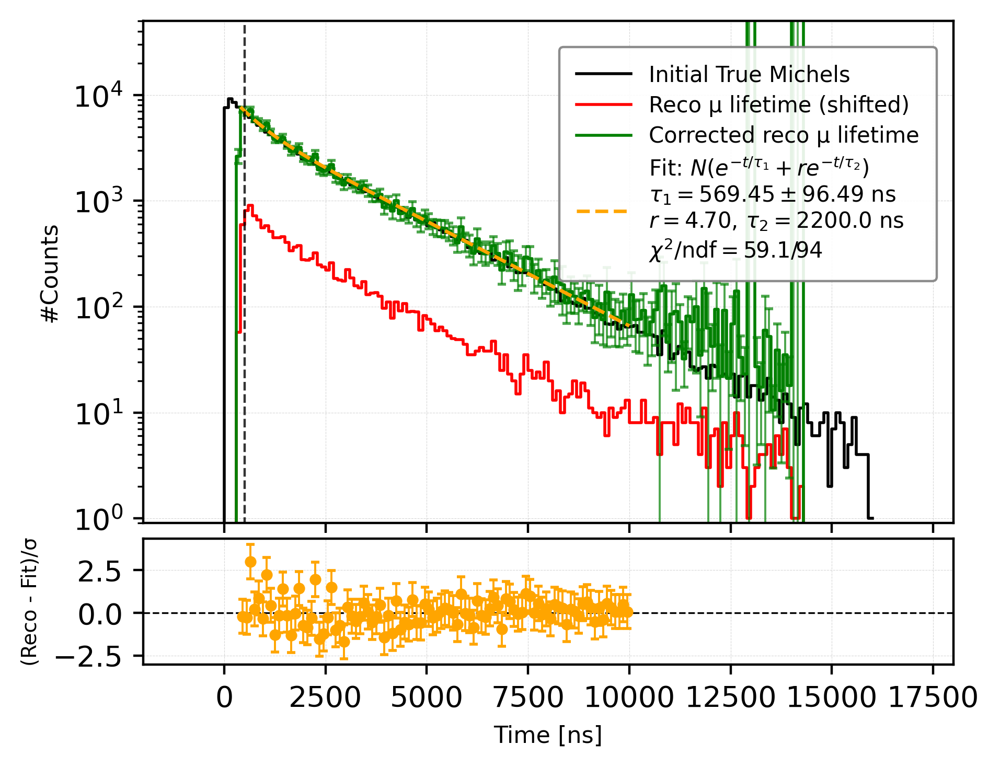


Fit results:
  N        = 29002.653 ± 525.400
  τ₁       = 569.445 ± 96.491 ns
  r        = 4.70
  τ₂       = 2200.0 ns
  χ²/ndf   = 59.1/94 = 0.63


In [144]:
# ============================================================
# 9. Perform double-exponential lifetime fit (with styled legend)
# ============================================================
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np

# --- Integrated double exponential model --------------------
def exp2_integrated(bin_edges, N, tau1, ratio=4.7, tau2=2200.0):
    a = bin_edges[:-1]
    b = bin_edges[1:]
    term1 = np.exp(-a / tau1) - np.exp(-b / tau1)
    term2 = np.exp(-a / tau2) - np.exp(-b / tau2)
    return N * (term1 + ratio * term2)

# ============================================================
# 1. Prepare data for fit
# ============================================================
bin_edges = bins.copy()
bin_centers = centers.copy()
y = R_corr.copy()
yerr = sigma_R_corr.copy()
counts_initial = counts_initial.copy()
counts_reco = counts_reco.copy()
sigma_reco = sigma_reco.copy()

fit_range = (400, 10000)#=====================================================================
ratio = 4.7
tau2 = 2200.0
bin_width = bin_edges[1] - bin_edges[0]

mask = (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1]) & (y > 0) & np.isfinite(y)
if not np.any(mask):
    print("⚠️  No valid bins in fit range; check histogram contents.")
else:
    edges_fit = bin_edges[mask.nonzero()[0][0]: mask.nonzero()[0][-1] + 2]
    y_fit = y[mask]
    sigma_fit = np.clip(yerr[mask], 1.0, None)

    # --- Initial guesses ---
    N0 = np.sum(y_fit)
    tau1_0 = 1000.0

    # --- Perform fit ---
    popt, pcov = curve_fit(
        lambda edges, N, tau1: exp2_integrated(edges, N, tau1, ratio, tau2),
        edges_fit, y_fit,
        p0=[N0, tau1_0],
        sigma=sigma_fit, absolute_sigma=True,
        bounds=([0, 1e-6], [np.inf, np.inf])
    )

    N_fit, tau1_fit = popt
    N_err, tau1_err = np.sqrt(np.diag(pcov))
    chi2 = np.sum(((y_fit - exp2_integrated(edges_fit, *popt, ratio, tau2)) / sigma_fit) ** 2)
    ndf = len(y_fit) - len(popt)

    # --- Model & pulls ---
    y_model = exp2_integrated(bin_edges, *popt, ratio=ratio, tau2=tau2)
    pulls = (y - y_model) / np.where(yerr > 0, yerr, np.inf)

    # ============================================================
    # 2. Plot (main + residuals)
    # ============================================================
    fig, (ax, ax_resid) = plt.subplots(
        2, 1, figsize=(5, 4), dpi=400, sharex=True,
        gridspec_kw={'height_ratios': [4, 1], 'hspace': 0.05}
    )

    # --- Top: histograms + fit ---
    ax.step(bin_edges, np.append(counts_initial, counts_initial[-1]),
            where='post', color='black', lw=1.0, label='Initial True Michels')
    ax.step(bin_edges, np.append(counts_reco, counts_reco[-1]),
            where='post', color='red', lw=1.0, label='Reco μ lifetime (shifted)')
    ax.step(bin_edges, np.append(y, y[-1]),
            where='post', color='green', lw=1.0, label='Corrected reco μ lifetime')
    ax.errorbar(bin_centers, y, yerr=yerr, fmt='none',
                ecolor='green', elinewidth=0.7, capsize=1.5, alpha=0.7)

    # --- Fitted curve ---
    x_smooth = np.linspace(fit_range[0], fit_range[1], 400)
    y_smooth = (N_fit / tau1_fit) * np.exp(-x_smooth / tau1_fit) * bin_width \
               + (N_fit * ratio / tau2) * np.exp(-x_smooth / tau2) * bin_width
    ax.plot(
        x_smooth, y_smooth,
        color='orange', linestyle='--', linewidth=1.2,
        label=(r"Fit: $N(e^{-t/\tau_1} + r e^{-t/\tau_2})$" "\n"
               + rf"$\tau_1={tau1_fit:.2f}\pm{tau1_err:.2f}$ ns" "\n"
               + rf"$r={ratio:.2f},\, \tau_2={tau2:.1f}$ ns" "\n"
               + rf"$\chi^2/\mathrm{{ndf}}={chi2:.1f}/{ndf}$")
    )

    ax.vlines(x=500, ymin=0.1, ymax=5e4,
              color='black', linestyle='--', lw=0.8, alpha=0.8)

    ax.set_yscale('log')
    ax.set_xlim(-2000, 18000)#(-2000, 18000)
    ax.set_ylim(0.9, 5e4)#(0.9, 5e4)
    ax.set_ylabel('#Counts', fontsize=8)
    ax.tick_params(labelbottom=False)
    ax.grid(ls='--', lw=0.2, alpha=0.5)

    # --- Optimized legend (screenshot style) ---
    legend = ax.legend(
        loc='upper left',
        fontsize=7.5,
        frameon=True,
        framealpha=0.9,
        fancybox=True,
        edgecolor='gray',
        handlelength=2.5,
        handletextpad=0.8,
        borderpad=0.8,
        labelspacing=0.4,
    )
    legend.get_frame().set_linewidth(0.8)
    legend.set_bbox_to_anchor((0.5, 0.97))

    # --- Bottom: residuals ---
    ax_resid.axhline(0, color='black', lw=0.6, ls='--')
    ax_resid.errorbar(bin_centers[mask], pulls[mask], yerr=np.ones(np.sum(mask)),
                      fmt='o', color='orange', markersize=3, elinewidth=0.7, capsize=1.5)
    ax_resid.set_xlim(-2000, 18000)#(-2000, 18000)
    ax_resid.set_xlabel('Time [ns]', fontsize=8)
    ax_resid.set_ylabel('(Reco - Fit)/σ', fontsize=7)
    ax_resid.grid(ls='--', lw=0.2, alpha=0.5)
    plt.show()

    # ============================================================
    # 3. Print fit summary
    # ============================================================
    print("\nFit results:")
    print(f"  N        = {N_fit:.3f} ± {N_err:.3f}")
    print(f"  τ₁       = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
    print(f"  r        = {ratio:.2f}")
    print(f"  τ₂       = {tau2:.1f} ns")
    print(f"  χ²/ndf   = {chi2:.1f}/{ndf:.0f} = {chi2/ndf:.2f}")


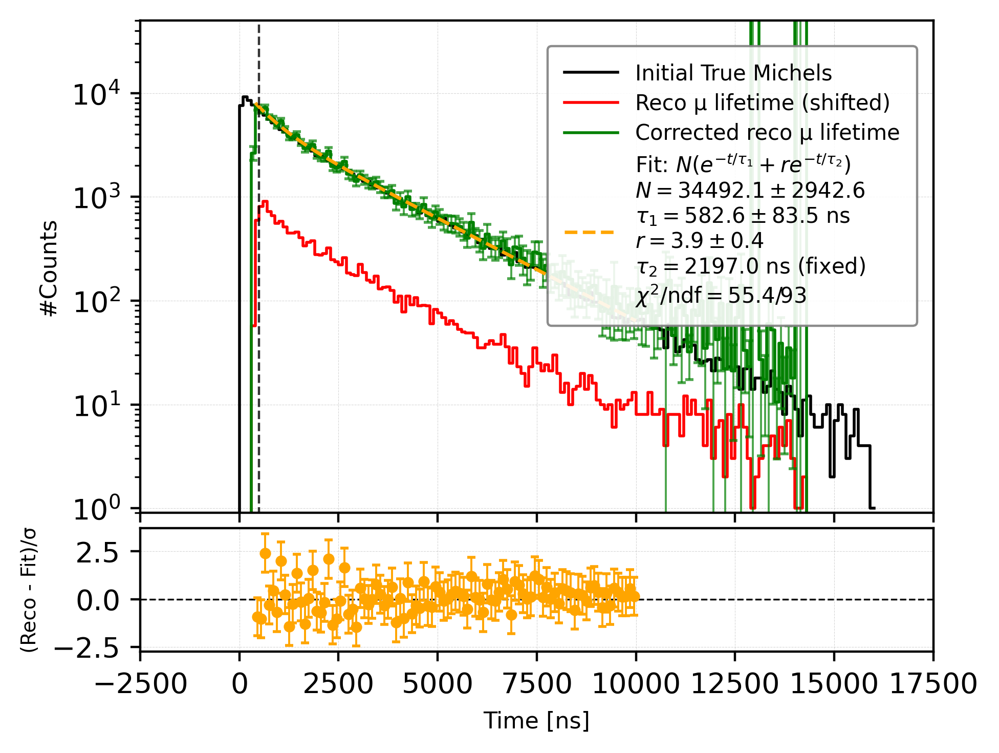


Fit results:
  N        = 34492.089 ± 2942.601
  τ₁       = 582.576 ± 83.511 ns
  r        = 3.852 ± 0.383
  τ₂       = 2197.0 ns (fixed)
  χ²/ndf   = 55.4/93 = 0.60


In [153]:
# ============================================================
# 9. Perform double-exponential lifetime fit (with styled legend)
# ============================================================
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np

# --- Integrated double exponential model --------------------
def exp2_integrated(bin_edges, N, tau1, r, tau2=2197.0):
    a = bin_edges[:-1]
    b = bin_edges[1:]
    term1 = np.exp(-a / tau1) - np.exp(-b / tau1)
    term2 = np.exp(-a / tau2) - np.exp(-b / tau2)
    return N * (term1 + r * term2)

# ============================================================
# 1. Prepare data for fit
# ============================================================
bin_edges = bins.copy()
bin_centers = centers.copy()
y = R_corr.copy()
yerr = sigma_R_corr.copy()

counts_initial = counts_initial.copy()
counts_reco = counts_reco.copy()
sigma_reco = sigma_reco.copy()

fit_range = (400, 10000)#=============================================
tau2 = 2197.0       # keep τ₂ fixed
bin_width = bin_edges[1] - bin_edges[0]

mask = (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1]) \
       & (y > 0) & np.isfinite(y)

if not np.any(mask):
    print("⚠️  No valid bins in fit range; check histogram contents.")

else:
    edges_fit = bin_edges[mask.nonzero()[0][0] : mask.nonzero()[0][-1] + 2]
    y_fit = y[mask]
    sigma_fit = np.clip(yerr[mask], 1.0, None)

    # --- Initial guesses ---
    N0 = np.sum(y_fit)
    tau1_0 = 1000.0
    r0 = 4.0     # NEW: initial guess for r

    # --- Perform fit: NOW FITTING r ---
    popt, pcov = curve_fit(
        lambda edges, N, tau1, r: exp2_integrated(edges, N, tau1, r, tau2),
        edges_fit, y_fit,
        p0=[N0, tau1_0, r0],
        sigma=sigma_fit, absolute_sigma=True,
        bounds=([0, 1e-6, 0], [np.inf, np.inf, np.inf])
    )

    N_fit, tau1_fit, r_fit = popt
    N_err, tau1_err, r_err = np.sqrt(np.diag(pcov))

    chi2 = np.sum(((y_fit - exp2_integrated(edges_fit, *popt, tau2)) / sigma_fit) ** 2)
    ndf = len(y_fit) - len(popt)

    # --- Model & pulls ---
    y_model = exp2_integrated(bin_edges, *popt, tau2)
    pulls = (y - y_model) / np.where(yerr > 0, yerr, np.inf)

    # ============================================================
    # 2. Plot (main + residuals)
    # ============================================================
    fig, (ax, ax_resid) = plt.subplots(
        2, 1, figsize=(5, 4), dpi=400, sharex=True,
        gridspec_kw={'height_ratios': [4, 1], 'hspace': 0.05}
    )

    # --- Histograms ---
    ax.step(bin_edges, np.append(counts_initial, counts_initial[-1]),
            where='post', color='black', lw=1.0, label='Initial True Michels')
    ax.step(bin_edges, np.append(counts_reco, counts_reco[-1]),
            where='post', color='red', lw=1.0, label='Reco μ lifetime (shifted)')
    ax.step(bin_edges, np.append(y, y[-1]),
            where='post', color='green', lw=1.0, label='Corrected reco μ lifetime')
    ax.errorbar(bin_centers, y, yerr=yerr, fmt='none',
                ecolor='green', elinewidth=0.7, capsize=1.5, alpha=0.7)

    # --- Fitted curve (smooth) ---
    x_smooth = np.linspace(fit_range[0], fit_range[1], 400)
    y_smooth = (
        (N_fit / tau1_fit) * np.exp(-x_smooth / tau1_fit) * bin_width +
        (N_fit * r_fit / tau2) * np.exp(-x_smooth / tau2) * bin_width
    )

    ax.plot(
        x_smooth, y_smooth,
        color='orange', linestyle='--', linewidth=1.2,
        label=(r"Fit: $N(e^{-t/\tau_1} + r e^{-t/\tau_2})$" "\n"
               + rf"$N = {N_fit:.1f} \pm {N_err:.1f}$" "\n"
               + rf"$\tau_1 = {tau1_fit:.1f} \pm {tau1_err:.1f}$ ns" "\n"
               + rf"$r = {r_fit:.1f} \pm {r_err:.1f}$" "\n"
               + rf"$\tau_2 = {tau2:.1f}$ ns (fixed)" "\n"
               + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$")
    )

    ax.vlines(x=500, ymin=0.1, ymax=5e4,
              color='black', linestyle='--', lw=0.8, alpha=0.8)

    ax.set_yscale('log')
    ax.set_xlim(-2000, 18000)
    ax.set_ylim(0.9, 5e4)
    ax.set_ylabel('#Counts', fontsize=8)
    ax.tick_params(labelbottom=False)
    ax.grid(ls='--', lw=0.2, alpha=0.5)

    legend = ax.legend(
        loc='upper left',
        fontsize=7.5,
        frameon=True,
        framealpha=0.9,
        fancybox=True,
        edgecolor='gray',
        handlelength=2.5,
        handletextpad=0.8,
        borderpad=0.8,
        labelspacing=0.4,
    )
    legend.get_frame().set_linewidth(0.8)
    legend.set_bbox_to_anchor((0.5, 0.97))

    # --- Residuals ---
    ax_resid.axhline(0, color='black', lw=0.6, ls='--')
    ax_resid.errorbar(
        bin_centers[mask], pulls[mask], 
        yerr=np.ones(np.sum(mask)),
        fmt='o', color='orange', markersize=3,
        elinewidth=0.7, capsize=1.5
    )

    ax_resid.set_xlim(-2500, 17500)
    ax_resid.set_xlabel('Time [ns]', fontsize=8)
    ax_resid.set_ylabel('(Reco - Fit)/σ', fontsize=7)
    ax_resid.grid(ls='--', lw=0.2, alpha=0.5)
    plt.show()

    # ============================================================
    # 3. Print fit summary
    # ============================================================
    print("\nFit results:")
    print(f"  N        = {N_fit:.3f} ± {N_err:.3f}")
    print(f"  τ₁       = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
    print(f"  r        = {r_fit:.3f} ± {r_err:.3f}")
    print(f"  τ₂       = {tau2:.1f} ns (fixed)")
    print(f"  χ²/ndf   = {chi2:.1f}/{ndf:.0f} = {chi2/ndf:.2f}")


#### Double exponential fitting (fixed tau2 and r) (Only Reco Data Error)

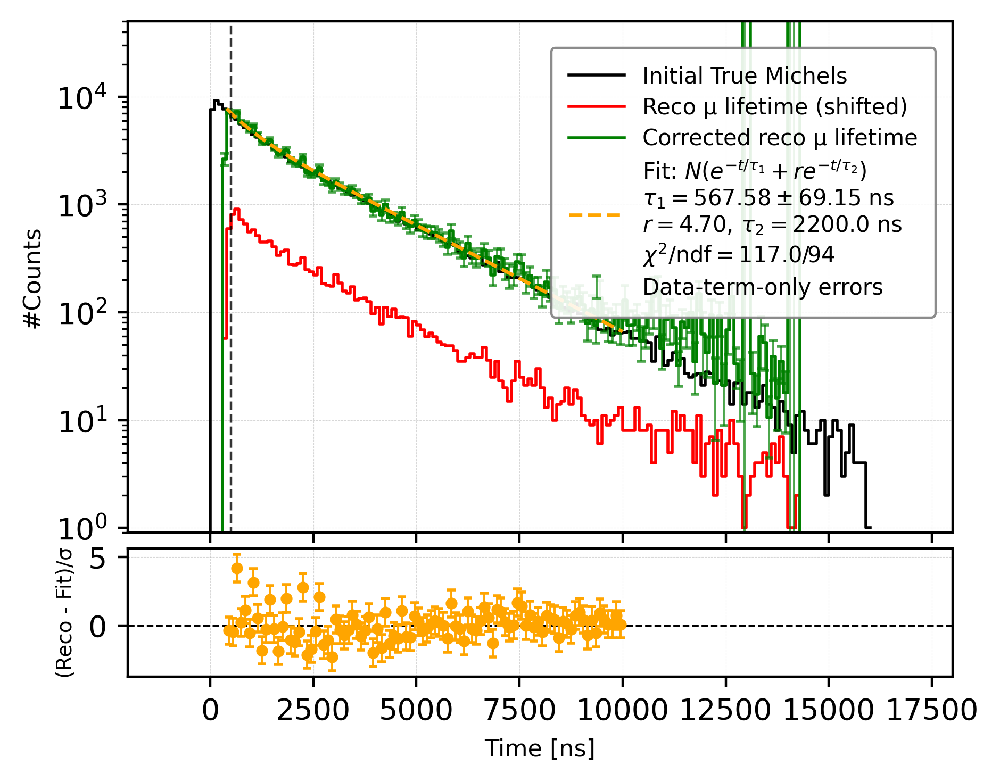


[Reco μ lifetime] Events within fit range (400, 10000): 14690
  (Total events: 15004, fraction ≈ 0.979)

Fit results (using data-term-only uncertainty):
  N        = 29111.342 ± 379.169
  τ₁       = 567.584 ± 69.154 ns
  r        = 4.70
  τ₂       = 2200.0 ns
  χ²/ndf   = 117.0/94 = 1.24


In [131]:
# ============================================================
# 9. Perform double-exponential lifetime fit (data-term-only σ)
# ============================================================
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np

# --- Integrated double exponential model --------------------
def exp2_integrated(bin_edges, N, tau1, ratio=4.7, tau2=2200.0):
    a = bin_edges[:-1]
    b = bin_edges[1:]
    term1 = np.exp(-a / tau1) - np.exp(-b / tau1)
    term2 = np.exp(-a / tau2) - np.exp(-b / tau2)
    return N * (term1 + ratio * term2)

# ============================================================
# 1. Prepare data for fit
# ============================================================
bin_edges = bins.copy()
bin_centers = centers.copy()
y = R_corr.copy()  # efficiency-corrected reco μ lifetime
# --- use only the data term uncertainty ---
sigma_data_only = np.sqrt((sigma_reco / np.clip(eff, 1e-12, None)) ** 2)
yerr = sigma_data_only.copy()

counts_initial = counts_initial.copy()
counts_reco = counts_reco.copy()
sigma_reco = sigma_reco.copy()

fit_range = (400, 10000)#=====================================================================
ratio = 4.7
tau2 = 2200.0
bin_width = bin_edges[1] - bin_edges[0]

mask = (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1]) & (y > 0) & np.isfinite(y)
if not np.any(mask):
    print("⚠️  No valid bins in fit range; check histogram contents.")
else:
    edges_fit = bin_edges[mask.nonzero()[0][0]: mask.nonzero()[0][-1] + 2]
    y_fit = y[mask]
    sigma_fit = np.clip(yerr[mask], 1.0, None)

    # --- Initial guesses ---
    N0 = np.sum(y_fit)
    tau1_0 = 1000.0

    # --- Perform fit ---
    popt, pcov = curve_fit(
        lambda edges, N, tau1: exp2_integrated(edges, N, tau1, ratio, tau2),
        edges_fit, y_fit,
        p0=[N0, tau1_0],
        sigma=sigma_fit, absolute_sigma=True,
        bounds=([0, 1e-6], [np.inf, np.inf])
    )

    N_fit, tau1_fit = popt
    N_err, tau1_err = np.sqrt(np.diag(pcov))
    chi2 = np.sum(((y_fit - exp2_integrated(edges_fit, *popt, ratio, tau2)) / sigma_fit) ** 2)
    ndf = len(y_fit) - len(popt)

    # --- Model & pulls ---
    y_model = exp2_integrated(bin_edges, *popt, ratio=ratio, tau2=tau2)
    pulls = (y - y_model) / np.where(yerr > 0, yerr, np.inf)

    # ============================================================
    # 2. Plot (main + residuals)
    # ============================================================
    fig, (ax, ax_resid) = plt.subplots(
        2, 1, figsize=(5, 4), dpi=400, sharex=True,
        gridspec_kw={'height_ratios': [4, 1], 'hspace': 0.05}
    )

    # --- Top: histograms + fit ---
    ax.step(bin_edges, np.append(counts_initial, counts_initial[-1]),
            where='post', color='black', lw=1.0, label='Initial True Michels')
    ax.step(bin_edges, np.append(counts_reco, counts_reco[-1]),
            where='post', color='red', lw=1.0, label='Reco μ lifetime (shifted)')
    ax.step(bin_edges, np.append(y, y[-1]),
            where='post', color='green', lw=1.0, label='Corrected reco μ lifetime')
    ax.errorbar(bin_centers, y, yerr=yerr, fmt='none',
                ecolor='green', elinewidth=0.7, capsize=1.5, alpha=0.7,
                label='Data-term-only errors')

    # --- Fitted curve ---
    x_smooth = np.linspace(fit_range[0], fit_range[1], 400)
    y_smooth = (N_fit / tau1_fit) * np.exp(-x_smooth / tau1_fit) * bin_width \
               + (N_fit * ratio / tau2) * np.exp(-x_smooth / tau2) * bin_width
    ax.plot(
        x_smooth, y_smooth,
        color='orange', linestyle='--', linewidth=1.2,
        label=(r"Fit: $N(e^{-t/\tau_1} + r e^{-t/\tau_2})$" "\n"
               + rf"$\tau_1={tau1_fit:.2f}\pm{tau1_err:.2f}$ ns" "\n"
               + rf"$r={ratio:.2f},\, \tau_2={tau2:.1f}$ ns" "\n"
               + rf"$\chi^2/\mathrm{{ndf}}={chi2:.1f}/{ndf}$")
    )

    ax.vlines(x=500, ymin=0.1, ymax=5e4,
              color='black', linestyle='--', lw=0.8, alpha=0.8)

    ax.set_yscale('log')
    ax.set_xlim(-2000, 18000)
    ax.set_ylim(0.9, 5e4)
    ax.set_ylabel('#Counts', fontsize=8)
    ax.tick_params(labelbottom=False)
    ax.grid(ls='--', lw=0.2, alpha=0.5)

    # --- Optimized legend (styled) ---
    legend = ax.legend(
        loc='upper left',
        fontsize=7.5,
        frameon=True,
        framealpha=0.9,
        fancybox=True,
        edgecolor='gray',
        handlelength=2.5,
        handletextpad=0.8,
        borderpad=0.8,
        labelspacing=0.4,
    )
    legend.get_frame().set_linewidth(0.8)
    legend.set_bbox_to_anchor((0.5, 0.97))

    # --- Bottom: residuals ---
    ax_resid.axhline(0, color='black', lw=0.6, ls='--')
    ax_resid.errorbar(bin_centers[mask], pulls[mask], yerr=np.ones(np.sum(mask)),
                      fmt='o', color='orange', markersize=3, elinewidth=0.7, capsize=1.5)
    ax_resid.set_xlim(-2000, 18000)
    ax_resid.set_xlabel('Time [ns]', fontsize=8)
    ax_resid.set_ylabel('(Reco - Fit)/σ', fontsize=7)
    ax_resid.grid(ls='--', lw=0.2, alpha=0.5)
    plt.show()

    # ============================================================
    # 3. Print fit summary
    # ============================================================

    # --- NEW: count number of events (not bins) in fit range for reco μ lifetime ---
    # Integrate histogram counts within the fit range
    event_count_in_fit = np.sum(
        counts_reco[(bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1])]
    )
    total_event_count = np.sum(counts_reco)

    print(f"\n[Reco μ lifetime] Events within fit range {fit_range}: {event_count_in_fit}")
    print(f"  (Total events: {total_event_count}, "
          f"fraction ≈ {event_count_in_fit/total_event_count:.3f})")


    print("\nFit results (using data-term-only uncertainty):")
    print(f"  N        = {N_fit:.3f} ± {N_err:.3f}")
    print(f"  τ₁       = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
    print(f"  r        = {ratio:.2f}")
    print(f"  τ₂       = {tau2:.1f} ns")
    print(f"  χ²/ndf   = {chi2:.1f}/{ndf:.0f} = {chi2/ndf:.2f}")


<br />
<br />
<br />

### Apply New Fitting Function!!! (the one used in tpc script)

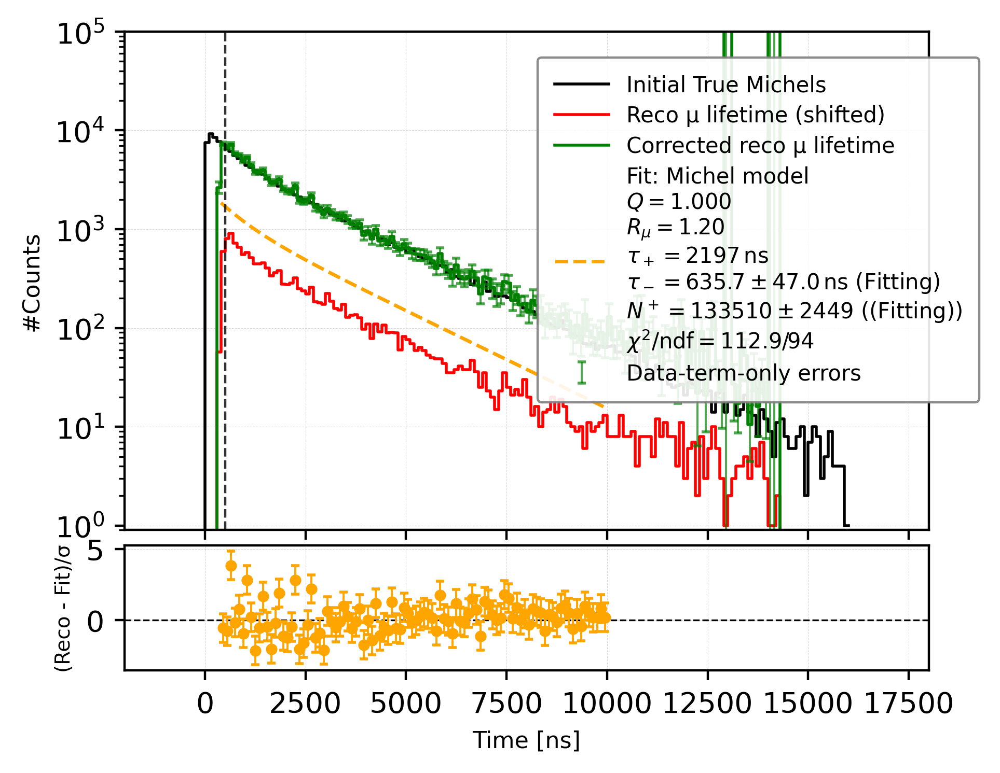


[Reco μ lifetime] Events within fit range (400, 10000): 14690
  (Total events: 15004, fraction ≈ 0.979)

Fit results (using data-term-only uncertainty):
  N        = 133509.722 ± 2448.501
  τ₁       = 635.719 ± 47.003 ns
  r        = 4.70
  τ₂       = 2200.0 ns
  χ²/ndf   = 112.9/94 = 1.20


In [142]:
# ============================================================
# 9. Perform double-exponential lifetime fit (data-term-only σ)
# ============================================================
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np


# ============================================================
# 2. Physics constants
# ============================================================
tau_mu_plus = 2197.0   # ns  (2.197 µs)
Q = 1.0               # or 0.988
R_mu = 1.2
fit_range = (400, 10000)#=====================================================================

# ============================================================
# 3. Define bin-integrated physics model
# ============================================================
def michel_integrated(bin_edges, N_plus, tau_mu_minus):
    """
    Integrated expected counts per bin for Michel e± from muon decays.

    Model:
      dN/dt = N+ * [ (1/τ+) e^{-t/τ+} + (Q/(τ+ Rµ)) e^{-t/τ-} ]

    Integrated over [a,b]:
      ΔN = N+ * [ (e^{-a/τ+} - e^{-b/τ+})
                  + (Q τ- / (Rµ τ+)) (e^{-a/τ-} - e^{-b/τ-}) ]
    """
    a = bin_edges[:-1]
    b = bin_edges[1:]

    term_plus = np.exp(-a / tau_mu_plus) - np.exp(-b / tau_mu_plus)
    term_minus = np.exp(-a / tau_mu_minus) - np.exp(-b / tau_mu_minus)

    return N_plus * (term_plus + (Q * tau_mu_minus) / (R_mu * tau_mu_plus) * term_minus)




# ============================================================
# 4. Prepare data for fit
# ============================================================
bin_edges = bins.copy()
bin_centers = centers.copy()
y = R_corr.copy()  # efficiency-corrected reco μ lifetime
# --- use only the data term uncertainty ---
sigma_data_only = np.sqrt((sigma_reco / np.clip(eff, 1e-12, None)) ** 2)
yerr = sigma_data_only.copy()

counts_initial = counts_initial.copy()
counts_reco = counts_reco.copy()
sigma_reco = sigma_reco.copy()

bin_width = bin_edges[1] - bin_edges[0]

mask = (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1]) & (y > 0) & np.isfinite(y)
if not np.any(mask):
    print("⚠️  No valid bins in fit range; check histogram contents.")
else:
    edges_fit = bin_edges[mask.nonzero()[0][0]: mask.nonzero()[0][-1] + 2]
    y_fit = y[mask]
    sigma_fit = np.clip(yerr[mask], 1.0, None)

    # --- Initial guesses ---
    N0 = np.sum(y_fit)
    tau1_0 = 500.0

    # --- Perform fit ---
    popt, pcov = curve_fit(
        michel_integrated,
        edges_fit, y_fit,
        p0=[N0, tau1_0],
        sigma=sigma_fit, absolute_sigma=True,
        bounds=([0, 1e-6], [np.inf, np.inf])#bounds of fitting parameters[min, min], [max, max]
    )

    N_fit, tau1_fit = popt
    N_err, tau1_err = np.sqrt(np.diag(pcov))
    y_model_fit = michel_integrated(edges_fit, *popt)
    chi2 = np.sum(((y_fit - y_model_fit) / sigma_fit) ** 2)
    ndf = len(y_fit) - len(popt)



    # --- Model & pulls ---
    y_model = michel_integrated(bin_edges, *popt)
    pulls = (y - y_model) / np.where(yerr > 0, yerr, np.inf)

    # ============================================================
    # 2. Plot (main + residuals)
    # ============================================================
    fig, (ax, ax_resid) = plt.subplots(
        2, 1, figsize=(5, 4), dpi=400, sharex=True,
        gridspec_kw={'height_ratios': [4, 1], 'hspace': 0.05}
    )

    # --- Top: histograms + fit ---
    ax.step(bin_edges, np.append(counts_initial, counts_initial[-1]),
            where='post', color='black', lw=1.0, label='Initial True Michels')
    ax.step(bin_edges, np.append(counts_reco, counts_reco[-1]),
            where='post', color='red', lw=1.0, label='Reco μ lifetime (shifted)')
    ax.step(bin_edges, np.append(y, y[-1]),
            where='post', color='green', lw=1.0, label='Corrected reco μ lifetime')
    ax.errorbar(bin_centers, y, yerr=yerr, fmt='none',
                ecolor='green', elinewidth=0.7, capsize=1.5, alpha=0.7,
                label='Data-term-only errors')

    # --- Fitted curve ---
    x_smooth = np.linspace(fit_range[0], fit_range[1], 400)
    y_smooth = michel_integrated(x_smooth, N_fit, tau1_fit)
    ax.plot(
        x_smooth[:-1], y_smooth,
        color='orange', linestyle='--', linewidth=1.2,
        label = (
          r"Fit: Michel model" "\n"
          + rf"$Q = {Q:.3f}$" "\n"
          + rf"$R_\mu = {R_mu:.2f}$" "\n"
          + rf"$\tau_+ = {tau_mu_plus:.0f}\,\mathrm{{ns}}$" "\n"
          + rf"$\tau_- = {tau1_fit:.1f} \pm {tau1_err:.1f}\,\mathrm{{ns}}$ (Fitting)" "\n"
          + rf"$N^+ = {N_fit:.0f} \pm {N_err:.0f}$ ((Fitting))" "\n"
          + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$"
        )
    )

    ax.vlines(x=500, ymin=0.9, ymax=100000,
              color='black', linestyle='--', lw=0.8, alpha=0.8)

    ax.set_yscale('log')
    ax.set_xlim(-2500, 17500)
    ax.set_ylim(0.9, 100000)
    ax.set_ylabel('#Counts', fontsize=8)
    ax.tick_params(labelbottom=False)
    ax.grid(ls='--', lw=0.2, alpha=0.5)

    # --- Optimized legend (styled) ---
    legend = ax.legend(
        loc='upper left',
        fontsize=7.5,
        frameon=True,
        framealpha=0.9,
        fancybox=True,
        edgecolor='gray',
        handlelength=2.5,
        handletextpad=0.8,
        borderpad=0.8,
        labelspacing=0.4,
    )
    legend.get_frame().set_linewidth(0.8)
    legend.set_bbox_to_anchor((0.5, 0.97))

    # --- Bottom: residuals ---
    ax_resid.axhline(0, color='black', lw=0.6, ls='--')
    ax_resid.errorbar(bin_centers[mask], pulls[mask], yerr=np.ones(np.sum(mask)),
                      fmt='o', color='orange', markersize=3, elinewidth=0.7, capsize=1.5)
    ax_resid.set_xlim(-2000, 18000)
    ax_resid.set_xlabel('Time [ns]', fontsize=8)
    ax_resid.set_ylabel('(Reco - Fit)/σ', fontsize=7)
    ax_resid.grid(ls='--', lw=0.2, alpha=0.5)
    plt.show()

    # ============================================================
    # 3. Print fit summary
    # ============================================================

    # --- NEW: count number of events (not bins) in fit range for reco μ lifetime ---
    # Integrate histogram counts within the fit range
    event_count_in_fit = np.sum(
        counts_reco[(bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1])]
    )
    total_event_count = np.sum(counts_reco)

    print(f"\n[Reco μ lifetime] Events within fit range {fit_range}: {event_count_in_fit}")
    print(f"  (Total events: {total_event_count}, "
          f"fraction ≈ {event_count_in_fit/total_event_count:.3f})")


    print("\nFit results (using data-term-only uncertainty):")
    print(f"  N        = {N_fit:.3f} ± {N_err:.3f}")
    print(f"  τ₁       = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
    print(f"  r        = {ratio:.2f}")
    print(f"  τ₂       = {tau2:.1f} ns")
    print(f"  χ²/ndf   = {chi2:.1f}/{ndf:.0f} = {chi2/ndf:.2f}")








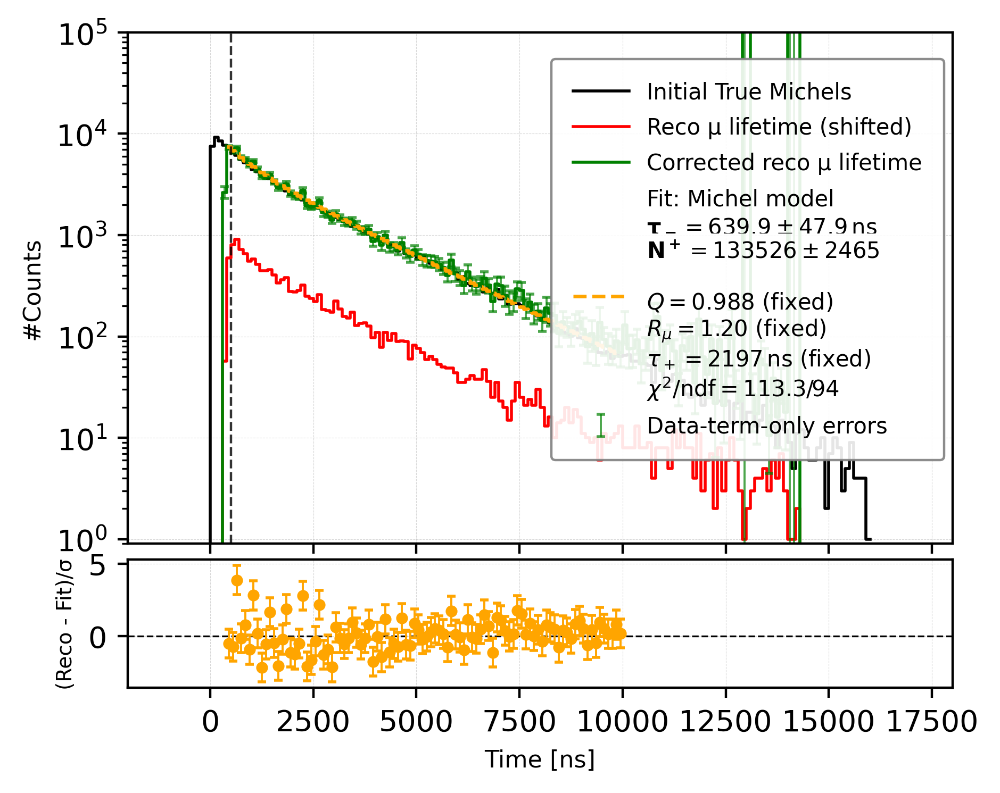


[Reco μ lifetime] Events in fit range (400, 10000): 14690
  (Total events = 15004, fraction = 0.979)

Fit results (Michel model, data-term-only σ):
  N⁺        = 133525.930 ± 2464.538
  τ⁺ (fix)  = 2197.0 ns
  τ⁻        = 639.935 ± 47.867 ns
  Q         = 0.988 (fixed)
  R_μ       = 1.20 (fixed)
  χ²/ndf    = 113.3/94 = 1.21


In [140]:
# ============================================================
# 9. Michel Lifetime Fit (data-term-only σ)
# ============================================================
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# 2. Physics constants
# ============================================================
tau_mu_plus = 2197.0   # ns  (2.197 µs)
Q = 0.988
R_mu = 1.2
fit_range = (400, 10000)

# ============================================================
# 3. Define bin-integrated physics model
# ============================================================
def michel_integrated(bin_edges, N_plus, tau_mu_minus):
    """
    Integrated expected Michel e± counts.

    dN/dt = N+ * [ (1/τ+) e^{-t/τ+} + (Q/(τ+ Rµ)) e^{-t/τ-} ]

    ∫bin dt:
      ΔN = N+ * [ (e^{-a/τ+} - e^{-b/τ+})
                  + (Q τ- / (Rµ τ+)) (e^{-a/τ-} - e^{-b/τ-}) ]
    """
    a = bin_edges[:-1]
    b = bin_edges[1:]

    term_plus  = np.exp(-a / tau_mu_plus)  - np.exp(-b / tau_mu_plus)
    term_minus = np.exp(-a / tau_mu_minus) - np.exp(-b / tau_mu_minus)

    return N_plus * (term_plus + (Q * tau_mu_minus) / (R_mu * tau_mu_plus) * term_minus)

# ============================================================
# 4. Prepare data
# ============================================================
bin_edges = bins.copy()
bin_centers = centers.copy()
y = R_corr.copy()

# DATA-TERM-ONLY σ:
sigma_data_only = np.sqrt((sigma_reco / np.clip(eff, 1e-12, None)) ** 2)
yerr = sigma_data_only.copy()

counts_initial = counts_initial.copy()
counts_reco = counts_reco.copy()
sigma_reco = sigma_reco.copy()
bin_width = bin_edges[1] - bin_edges[0]

# Fit window mask
mask = (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1]) \
       & (y > 0) & np.isfinite(y)

if not np.any(mask):
    print("⚠️ No valid bins for fitting."); raise SystemExit

edges_fit = bin_edges[mask.nonzero()[0][0] : mask.nonzero()[0][-1] + 2]
y_fit = y[mask]
sigma_fit = np.clip(yerr[mask], 1.0, None)

# ============================================================
# 5. Initial guess
# ============================================================
N0 = np.sum(y_fit)
tau1_0 = 500.0   # initial guess for τ⁻

# ============================================================
# 6. Perform fit
# ============================================================
popt, pcov = curve_fit(
    michel_integrated,
    edges_fit, y_fit,
    p0=[N0, tau1_0],
    sigma=sigma_fit,
    absolute_sigma=True,
    bounds=([0, 1e-6], [np.inf, np.inf])
)

N_fit, tau1_fit = popt                 # N+   , τ-
N_err, tau1_err = np.sqrt(np.diag(pcov))

# Goodness of fit
y_model_fit = michel_integrated(edges_fit, *popt)
chi2 = np.sum(((y_fit - y_model_fit) / sigma_fit)**2)
ndf = len(y_fit) - len(popt)

# Full-range model and pulls
y_model = michel_integrated(bin_edges, *popt)
pulls = (y - y_model) / np.where(yerr > 0, yerr, np.inf)

# ============================================================
# 7. Plot (main + residuals)
# ============================================================
fig, (ax, ax_resid) = plt.subplots(
    2, 1, figsize=(5, 4), dpi=400, sharex=True,
    gridspec_kw={'height_ratios':[4,1], 'hspace':0.05}
)

# --- Top panel ---
ax.step(bin_edges, np.append(counts_initial, counts_initial[-1]),
        where='post', color='black', lw=1.0, label="Initial True Michels")
ax.step(bin_edges, np.append(counts_reco, counts_reco[-1]),
        where='post', color='red', lw=1.0, label="Reco μ lifetime (shifted)")
ax.step(bin_edges, np.append(y, y[-1]),
        where='post', color='green', lw=1.0, label="Corrected reco μ lifetime")
ax.errorbar(bin_centers, y, yerr=yerr, fmt='none',
            ecolor='green', elinewidth=0.7, capsize=1.5, alpha=0.7,
            label='Data-term-only errors')

# Fitted model (bin integrated)
y_step = michel_integrated(edges_fit, *popt)
ax.step(edges_fit[:-1], y_step, where='post', color='orange',
        linestyle='--', linewidth=1.2,
        label=(
            r"Fit: Michel model" "\n"
            + rf"$\mathbf{{\tau_-}} = {tau1_fit:.1f} \pm {tau1_err:.1f}\,\mathrm{{ns}}$" "\n"
            + rf"$\mathbf{{N^+}} = {N_fit:.0f} \pm {N_err:.0f}$" "\n"
            + "\n"
            + rf"$Q = {Q:.3f}$ (fixed)" "\n"
            + rf"$R_\mu = {R_mu:.2f}$ (fixed)" "\n"
            + rf"$\tau_+ = {tau_mu_plus:.0f}\,\mathrm{{ns}}$ (fixed)" "\n"
            + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$"
        )
)

ax.vlines(x=500, ymin=0.9, ymax=1e5,
          color='black', linestyle='--', lw=0.8, alpha=0.8)

ax.set_yscale('log')
ax.set_xlim(-2500, 17500)
ax.set_ylim(0.9, 1e5)
ax.set_ylabel("#Counts", fontsize=8)
ax.tick_params(labelbottom=False)
ax.grid(ls='--', lw=0.2, alpha=0.5)

# Legend
legend = ax.legend(
    loc='upper left',
    fontsize=7.5,
    frameon=True,
    framealpha=0.9,
    fancybox=True,
    edgecolor='gray',
    handlelength=2.5,
    handletextpad=0.8,
    borderpad=1.0,
    labelspacing=0.6
)
legend.get_frame().set_linewidth(0.8)
legend.set_bbox_to_anchor((0.5, 0.97))

# --- Bottom panel (pulls) ---
ax_resid.axhline(0, color='black', lw=0.6, ls='--')
ax_resid.errorbar(bin_centers[mask], pulls[mask], yerr=np.ones(np.sum(mask)),
                  fmt='o', color='orange', markersize=3,
                  elinewidth=0.7, capsize=1.5)
ax_resid.set_xlim(-2000, 18000)
ax_resid.set_xlabel("Time [ns]", fontsize=8)
ax_resid.set_ylabel("(Reco - Fit)/σ", fontsize=7)
ax_resid.grid(ls='--', lw=0.2, alpha=0.5)

plt.show()

# ============================================================
# 8. Print fit summary
# ============================================================
event_count_in_fit = np.sum(
    counts_reco[(bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1])]
)
total_event_count = np.sum(counts_reco)

print(f"\n[Reco μ lifetime] Events in fit range {fit_range}: {event_count_in_fit}")
print(f"  (Total events = {total_event_count}, "
      f"fraction = {event_count_in_fit/total_event_count:.3f})")

print("\nFit results (Michel model, data-term-only σ):")
print(f"  N⁺        = {N_fit:.3f} ± {N_err:.3f}")
print(f"  τ⁺ (fix)  = {tau_mu_plus:.1f} ns")
print(f"  τ⁻        = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
print(f"  Q         = {Q:.3f} (fixed)")
print(f"  R_μ       = {R_mu:.2f} (fixed)")
print(f"  χ²/ndf    = {chi2:.1f}/{ndf} = {chi2/ndf:.2f}")


<br />
<br />
<br />

### Another approach:

## 🎯 Forward-Folding Method for Lifetime Fitting

### **1. Motivation**

When analyzing reconstructed data, detector effects (efficiency, smearing, and bias) distort the *true* physical distribution.  
A simple "efficiency correction" divides by the efficiency \( \varepsilon(t) \), but this:

- Amplifies noise where \( \varepsilon \) is small,
- Ignores bin-to-bin migration,
- Produces correlated and inflated uncertainties.

**Forward-folding** avoids these problems:  
instead of "unfolding" the data, we **fold the theoretical model through the detector response** and fit directly to the reconstructed histogram.

---

### **2. Mathematical Definition**

Given a true model \( y_i^{\text{true}}(N, \tau_1) \),  
the predicted reconstructed counts are:

$$
\mu_k(N, \tau_1) = \sum_i A_{k,i} \, y_i^{\text{true}}(N, \tau_1)
$$

where:

- \( A_{k,i} \) is the **response matrix**, encoding:
  - **Efficiency:** probability that an event in true bin \( i \) is detected,
  - **Migration:** probability it is reconstructed in reco bin \( k \).
- \( y_i^{\text{true}}(N, \tau_1) \) is the **true model prediction**, integrated over bin \( i \).

We fit \( (N, \tau_1) \) by minimizing:

**Weighted least-squares (χ²):**

$$
\chi^2 = \sum_k \frac{(y_k^{\text{obs}} - \mu_k)^2}{\sigma_k^2}
$$

or equivalently, **Poisson negative log-likelihood (NLL):**

$$
-2\ln \mathcal{L} = 2\sum_k \left[ \mu_k - y_k^{\text{obs}} + y_k^{\text{obs}}\ln\frac{y_k^{\text{obs}}}{\mu_k} \right]
$$

---

### **3. Step-by-Step Procedure**

1. **Define consistent binning**

   Use the same binning for both true and reconstructed lifetime histograms.

2. **Compute initial true histogram**

   $$
   I_i = \text{counts of true Michel events before cuts.}
   $$

3. **Build joint histogram (true vs reco)**

   For each paired event with both true and reco lifetime:

   $$
   n_{\text{final}}(i, k) = \text{# of events with true in bin } i \text{ and reco in bin } k.
   $$

4. **Construct the response matrix**

   $$
   A_{k,i} = \frac{n_{\text{final}}(i, k)}{I_i}
   $$

   Each column \( i \) represents a true bin.  
   Column sums \( \varepsilon_i = \sum_k A_{k,i} \) are efficiencies.

5. **Visualize the response matrix**

   - Main diagonal → accurate reconstruction (reco ≈ true).  
   - Off-diagonal entries → migration/smearing.  
   - Column brightness → relative efficiency.

6. **Compute the true model**

   For bin edges \( a_i, b_i \), ratio \( r \), and fixed \( \tau_2 \):

   $$
   y_i^{\text{true}}(N, \tau_1) = N \left[
   \left(e^{-a_i/\tau_1} - e^{-b_i/\tau_1}\right)
   + r\left(e^{-a_i/\tau_2} - e^{-b_i/\tau_2}\right)
   \right]
   $$

7. **Fold the model to reco space**

   $$
   \mu_k(N, \tau_1) = \sum_i A_{k,i} \, y_i^{\text{true}}(N, \tau_1)
   $$

8. **Fit to reconstructed data**

   Compare the predicted \( \mu_k \) with observed reco counts \( y_k^{\text{obs}} \),  
   and minimize either \( \chi^2 \) or the Poisson NLL.

9. **Plot and interpret**

   - Plot data vs. model (log-scale is often helpful).  
   - Show residuals or pulls.  
   - Extract \( \tau_1 \pm \sigma(\tau_1) \) from the covariance matrix.

---

### **4. Advantages**

✅ Avoids noise amplification from \( 1/\varepsilon \) division.  
✅ Correctly accounts for migration and correlations.  
✅ Produces unbiased lifetime estimates.  
✅ Straightforward propagation of systematics via \( A \).

---




<br />
<br />
<br />

### Calculate and Visualize A

A.shape = (320, 320)
Sum(A) = 935000000000019.375,  mean efficiency = 2921875000000.061


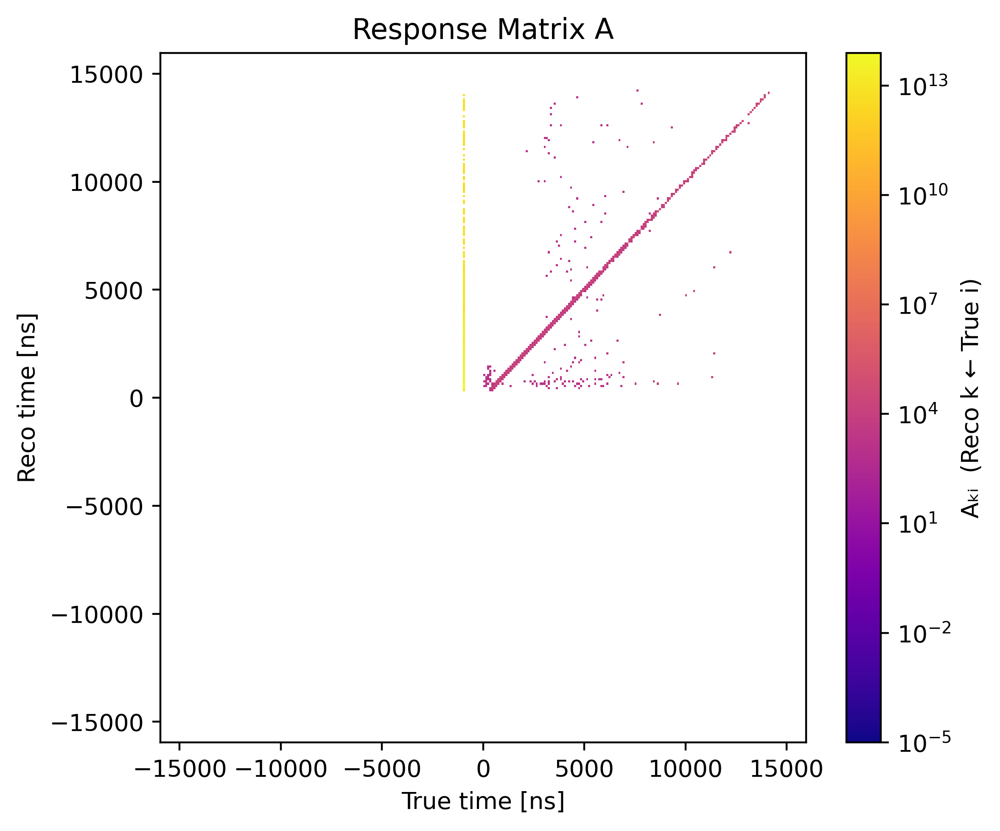

<Figure size 640x480 with 0 Axes>

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# ----- 1. Define binning -----
bin_width = 100
range_min, range_max = -16000, 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5*(bins[:-1] + bins[1:])
nb = len(centers)

# ----- 2. Count initial true events -----
I, _ = np.histogram(trueMichel_initial, bins=bins)
I = I.astype(float)
I_safe = np.clip(I, 1e-12, None)

# ----- 3. Build true→reco table from final paired data -----
true_idx = np.digitize(trueT_total_purify9, bins) - 1
reco_idx = np.digitize(recoT_total_purify9_shift40, bins) - 1
valid = (true_idx >= 0) & (true_idx < nb) & (reco_idx >= 0) & (reco_idx < nb)

n_final = np.zeros((nb, nb), dtype=float)  # rows:true, cols:reco
np.add.at(n_final, (true_idx[valid], reco_idx[valid]), 1.0)

# ----- 4. Compute A (reco rows × true columns) -----
A = (n_final / I_safe[:, None]).T    # shape (nb_reco, nb_true)

print(f"A.shape = {A.shape}")
print(f"Sum(A) = {A.sum():.3f},  mean efficiency = {np.mean(A.sum(axis=0)):.3f}")



plt.figure(figsize=(6,5), dpi=400)
plt.imshow(A, origin='lower', aspect='auto',
           extent=[centers[0], centers[-1], centers[0], centers[-1]],
           cmap='plasma', norm=plt.matplotlib.colors.LogNorm(vmin=1e-5, vmax=np.nanmax(A)))
plt.colorbar(label='Aₖᵢ  (Reco k ← True i)')
plt.xlabel('True time [ns]')
plt.ylabel('Reco time [ns]')
plt.title('Response Matrix A')
plt.tight_layout()
plt.show()

plt.savefig("responseMatrix.png", dpi=400, bbox_inches="tight")


[diag] Kept true bins: 160 / 320
[diag] Kept reco bins: 139 / 320
[diag] Mean efficiency (sum over reco): 0.121
[diag] Initial guess N0 = 0.25

=== Forward-fold WLS fit (true≥0 only) ===
  N      = 71.818 ± 55.517
  τ₁     = 3857.432 ± 77892.676 ns
  ratio  = 4.70 (fixed)
  τ₂     = 2200.0 ns (fixed)
  χ²/ndf = 13557.2/93 = 145.78


/var/folders/c9/547_2pf11mv74b226lzvqwj00000gn/T/ipykernel_63093/1627511935.py:138: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


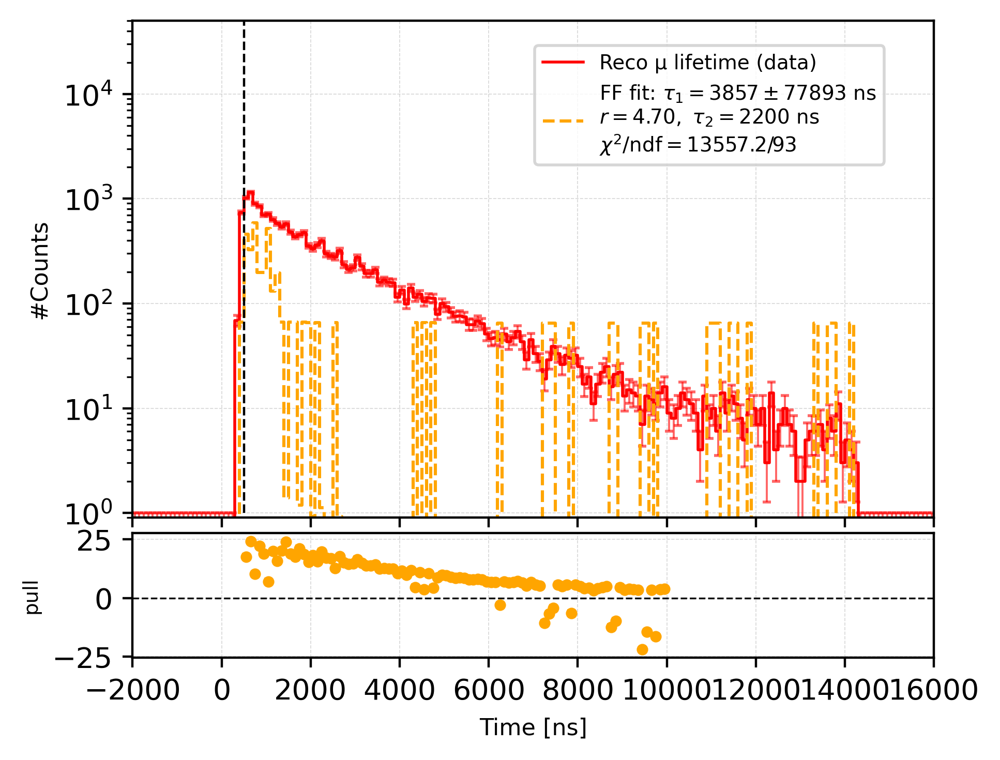

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ===============================================================
# 1) Forward model components
# ===============================================================
def exp2_integrated(bin_edges, N, tau1, ratio=4.8, tau2=2200.0):
    """Bin-integrated double exponential."""
    a = bin_edges[:-1]
    b = bin_edges[1:]
    term1 = np.exp(-a/tau1) - np.exp(-b/tau1)
    term2 = np.exp(-a/tau2) - np.exp(-b/tau2)
    return N * (term1 + ratio * term2)

def predict_reco(bin_edges_true, N, tau1, ratio, tau2, A_use):
    """Predict reco histogram from true model and response matrix."""
    y_true = exp2_integrated(bin_edges_true, N, tau1, ratio=ratio, tau2=tau2)
    return A_use @ y_true

# ===============================================================
# 2) Reco histogram (data) and Poisson uncertainties
# ===============================================================
bin_width = 100
range_min, range_max = -16000, 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)
centers = 0.5*(bins[:-1] + bins[1:])

counts_reco, _ = np.histogram(recoT_total_purify9_shift40, bins=bins)
y_obs = counts_reco.astype(float)
sigma = np.sqrt(np.maximum(y_obs, 1.0))

# ===============================================================
# 3) Slice out unphysical (true<0) columns from A
# ===============================================================
true_pos = centers >= 0
A_phys = A[:, true_pos]

# Keep only reco bins that receive some contribution
reco_weight = A_phys.sum(axis=1)
reco_keep = reco_weight > 1e-8

A_use = A_phys[reco_keep, :]
y_use = y_obs[reco_keep]
s_use = sigma[reco_keep]
c_use = centers[reco_keep]
true_bins = bins[np.concatenate(([0], np.where(true_pos)[0] + 1))]  # match A_use columns

print(f"[diag] Kept true bins: {A_use.shape[1]} / {len(centers)}")
print(f"[diag] Kept reco bins: {A_use.shape[0]} / {len(centers)}")
print(f"[diag] Mean efficiency (sum over reco): {A_use.sum(axis=0).mean():.3f}")

# ===============================================================
# 4) Fit setup
# ===============================================================
fit_range = (500, 10000)
fit_mask = (c_use >= fit_range[0]) & (c_use <= fit_range[1])

ratio_fix = 4.7
tau2_fix = 2200.0
tau1_0 = 1000.0

# Compute amplitude guess N0 to roughly match normalization
mu_test = predict_reco(true_bins, 1.0, tau1_0, ratio_fix, tau2_fix, A_use)[fit_mask]
den = np.sum(np.clip(mu_test, 1e-12, None))
num = np.sum(y_use[fit_mask])
N0 = (num / den) if den > 0 else float(num)
print(f"[diag] Initial guess N0 = {N0:.2f}")

def ff_wrapper(_, N, tau1):
    return predict_reco(true_bins, N, tau1, ratio_fix, tau2_fix, A_use)[fit_mask]

# ===============================================================
# 5) Weighted least squares fit
# ===============================================================
popt, pcov = curve_fit(
    ff_wrapper, bins, y_use[fit_mask],
    p0=[N0, tau1_0],
    sigma=np.clip(s_use[fit_mask], 1.0, None),
    absolute_sigma=True,
    bounds=([0.0, 1e-6], [np.inf, np.inf])
)
N_fit, tau1_fit = popt
N_err, tau1_err = np.sqrt(np.diag(pcov))

# Predictions
y_pred = predict_reco(true_bins, N_fit, tau1_fit, ratio_fix, tau2_fix, A_use)
pulls = (y_use - y_pred) / np.clip(s_use, 1.0, None)

chi2 = np.sum(((y_use[fit_mask] - y_pred[fit_mask]) / np.clip(s_use[fit_mask], 1.0, None))**2)
ndf = np.count_nonzero(fit_mask) - len(popt)

print("\n=== Forward-fold WLS fit (true≥0 only) ===")
print(f"  N      = {N_fit:.3f} ± {N_err:.3f}")
print(f"  τ₁     = {tau1_fit:.3f} ± {tau1_err:.3f} ns")
print(f"  ratio  = {ratio_fix:.2f} (fixed)")
print(f"  τ₂     = {tau2_fix:.1f} ns (fixed)")
print(f"  χ²/ndf = {chi2:.1f}/{ndf} = {chi2/ndf:.2f}")

# ===============================================================
# 6) Plot
# ===============================================================
# Re-expand prediction to full reco axis for context
y_pred_full = np.zeros_like(y_obs)
y_pred_full[reco_keep] = y_pred

fig, (ax, axr) = plt.subplots(2, 1, figsize=(5, 4), dpi=400, sharex=True,
                              gridspec_kw={'height_ratios':[4,1], 'hspace':0.05})

# Top panel
ax.step(bins, np.append(y_obs, y_obs[-1]), where='post',
        color='red', lw=1.0, label='Reco μ lifetime (data)')
ax.errorbar(centers, y_obs, yerr=sigma, fmt='none', ecolor='red',
            elinewidth=0.7, capsize=1.5, alpha=0.6)
ax.step(bins, np.append(y_pred_full, y_pred_full[-1]), where='post',
        color='orange', lw=1.1, ls='--',
        label=(rf"FF fit: $\tau_1={tau1_fit:.0f}\pm{tau1_err:.0f}$ ns"
               + "\n" + rf"$r={ratio_fix:.2f},\ \tau_2={tau2_fix:.0f}$ ns"
               + "\n" + rf"$\chi^2/\mathrm{{ndf}}={chi2:.1f}/{ndf}$"))
ax.vlines(500, ymin=1.0, ymax=max(5e4, y_obs.max()*1.2), color='black', ls='--', lw=0.8)
ax.set_yscale('log')
ax.set_xlim(-2000, 16000)
ax.set_ylim(0.9, max(5e4, 1.2*np.nanmax(y_obs)))
ax.set_ylabel('#Counts', fontsize=8)
ax.grid(ls='--', lw=0.3, alpha=0.5)
ax.legend(loc='upper center', bbox_to_anchor=(0.72, 0.97), fontsize=7)
ax.tick_params(labelbottom=False)

# Bottom panel: pulls
axr.axhline(0.0, color='black', lw=0.6, ls='--')
axr.errorbar(c_use[fit_mask], pulls[fit_mask],
             yerr=np.ones(np.sum(fit_mask)), fmt='o',
             color='orange', ms=3, elinewidth=0.7, capsize=1.5)
axr.set_xlim(-2000, 16000)
axr.set_xlabel('Time [ns]', fontsize=8)
axr.set_ylabel('pull', fontsize=7)
axr.grid(ls='--', lw=0.3, alpha=0.5)
plt.tight_layout()
plt.show()


Length of trueMichel_initial:  156120
Lifetime efficiency sample: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Uncertainties sample: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


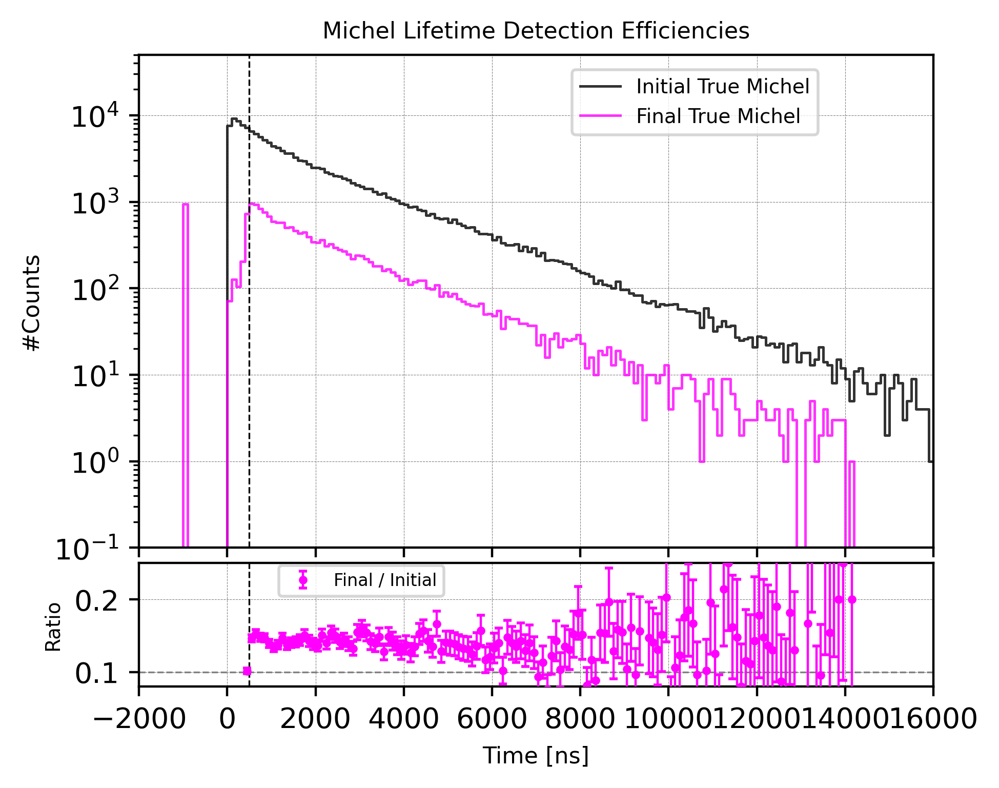

In [33]:
import numpy as np

trueMichel_initial = np.load("trueMichel_initial.npy", allow_pickle=True).tolist()
print("Length of trueMichel_initial: ", len(trueMichel_initial))



# ====== Double Panel: Hist + Ratio ==============================================
fig = plt.figure(figsize=(5, 4), dpi=400)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

# Histogram binning
bin_width = 100
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# -------- Top panel --------
ax1 = fig.add_subplot(gs[0])

# Histograms
counts_reco, bin_edges = np.histogram(trueMichel_initial, bins=bins, range=(range_min, range_max))
counts_true, _ = np.histogram(trueT_total_purify9, bins=bins, range=(range_min, range_max))
counts_tau, _ = np.histogram(lifetime_update_ns2, bins=bins, range=(range_min, range_max))
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Plot step histograms
# ---- Top panel: consistent histogram steps ----
ax1.step(bin_edges, np.append(counts_reco, counts_reco[-1]),
         where='post', color='black', linewidth=0.9, alpha=0.8,
         label='Initial True Michel', zorder=2)

#ax1.step(bin_edges, np.append(counts_tau, counts_tau[-1]),
#         where='post', color='orange', linewidth=0.9, alpha=0.8,
#         label=r'After $\tau>500$ ns cut', zorder=2)

ax1.step(bin_edges, np.append(counts_true, counts_true[-1]),
         where='post', color='magenta', linewidth=0.9, alpha=0.8,
         label='Final True Michel', zorder=2)


# Style
ax1.set_xlim(-2000, 16000)
ax1.tick_params(labelbottom=False)
ax1.set_ylim(0.1, 50000)
ax1.set_yscale('log')
ax1.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax1.set_ylabel('#Counts', fontsize=8)
ax1.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax1.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99),
           fontsize=8, markerscale=5, ncol=1, prop={'size':7})
ax1.set_title("Michel Lifetime Detection Efficiencies", fontsize=8)

# -------- Bottom panel (two ratios) --------
ax2 = fig.add_subplot(gs[1], sharex=ax1)

mask = counts_reco > 0

# --- Ratio 1: Final / Initial ---
ratio_true = np.zeros_like(counts_reco, dtype=float)
ratio_true[mask] = counts_true[mask] / counts_reco[mask]

sigma_true = np.sqrt(np.clip(counts_true, 0, None))
sigma_reco = np.sqrt(np.clip(counts_reco, 0, None))
sigma_ratio_true = np.zeros_like(ratio_true, dtype=float)
sigma_ratio_true[mask] = ratio_true[mask] * np.sqrt(
    (sigma_true[mask] / np.clip(counts_true[mask], 1e-9, None))**2 +
    (sigma_reco[mask] / np.clip(counts_reco[mask], 1e-9, None))**2
)

# --- Ratio 2: tau>500 / Initial ---
ratio_tau = np.zeros_like(counts_reco, dtype=float)
ratio_tau[mask] = counts_tau[mask] / counts_reco[mask]

sigma_tau = np.sqrt(np.clip(counts_tau, 0, None))
sigma_ratio_tau = np.zeros_like(ratio_tau, dtype=float)
sigma_ratio_tau[mask] = ratio_tau[mask] * np.sqrt(
    (sigma_tau[mask] / np.clip(counts_tau[mask], 1e-9, None))**2 +
    (sigma_reco[mask] / np.clip(counts_reco[mask], 1e-9, None))**2
)

# --- Plot both ratios ---
#ax2.errorbar(bin_centers, ratio_tau, yerr=sigma_ratio_tau,
#             fmt='o', color='orange', markersize=2.0, elinewidth=0.8, capsize=1.5,
#             label=r'$\tau>500$ ns / Initial', zorder=3)
ax2.errorbar(bin_centers, ratio_true, yerr=sigma_ratio_true,
             fmt='o', color='magenta', markersize=2.0, elinewidth=0.8, capsize=1.5,
             label='Final / Initial', zorder=3)

ax2.axhline(y=0.1, color='gray', linestyle='--', linewidth=0.6)


# ====== Store ratios and uncertainties for later use ======
lifetime_efficiency = ratio_true.copy()
lifetime_efficiency_unc = sigma_ratio_true.copy()

# (Optional) print or check a few bins
print("Lifetime efficiency sample:", lifetime_efficiency[:10])
print("Uncertainties sample:", lifetime_efficiency_unc[:10])


# Style for ratio panel
ax2.axvline(x=500, color='black', linestyle='--', linewidth=0.6)
ax2.set_xlim(-2000, 16000)
ax2.set_ylim(0.08, 0.25)
ax2.set_xlabel('Time [ns]', fontsize=8)
ax2.set_ylabel('Ratio', fontsize=7)
ax2.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax2.legend(loc='upper center', bbox_to_anchor=(0.28, 1.05),
           fontsize=6, markerscale=1, ncol=2, prop={'size':6})

plt.show()



<br />
<br />
<br />

### Old attempt

### Lifetime & Energy of True Michels:


Michel e^+:  63387 / 77516 (81.77%)
Michel e^-:  14129 / 77516 (18.23%)
#e^+ / #e^-:  63387 / 14129 (4.49)


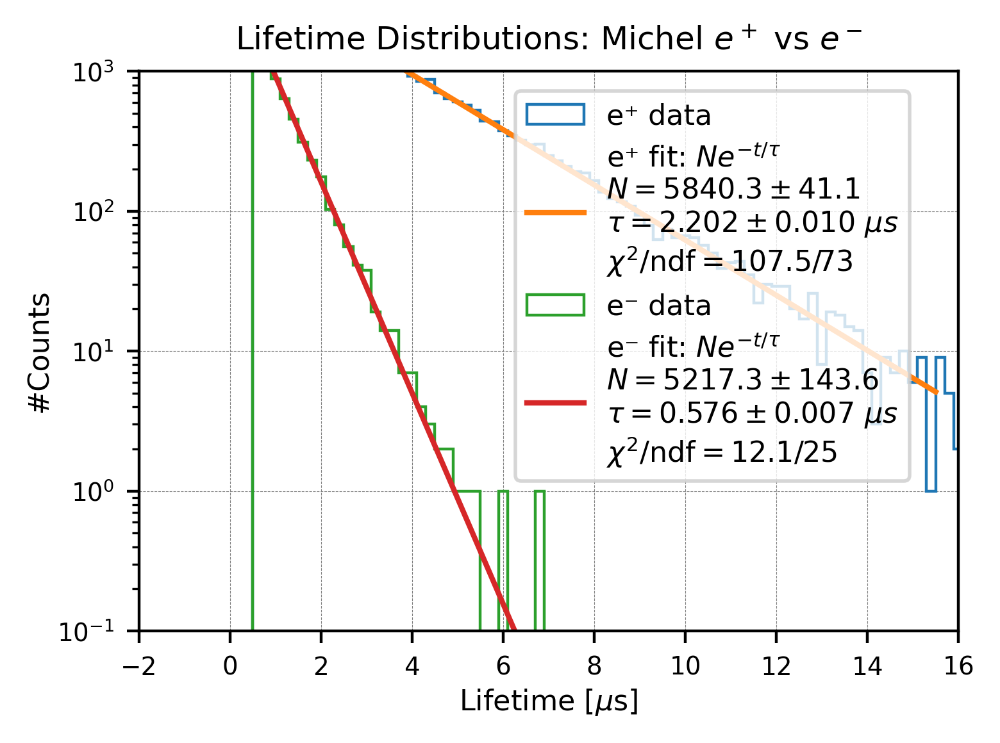

In [34]:

energyDis = [ev.energy for ev in true_newClass]


# Seperate Michel e^- and e^+------------------------------
life_positron = []
life_electron = []

for ev in true_newClass:
    pdg = ev.pdg
    life = ev.true_lifetime / 1000.0 # in unit of us---

    if pdg < 0:
        life_positron.append(life)
    elif pdg > 0:
        life_electron.append(life)

print("\nMichel e^+: ", len(life_positron), "/", len(true_newClass), 
      "({:.2f}%)".format(len(life_positron)/len(true_newClass)*100))
print("Michel e^-: ", len(life_electron), "/", len(true_newClass), 
      "({:.2f}%)".format(len(life_electron)/len(true_newClass)*100))
print("#e^+ / #e^-: ", len(life_positron), "/", len(life_electron),
      "({:.2f})".format(len(life_positron)/len(life_electron)))



#Fitting seperating for Michel e^+ and e^-=============================================================

# --- single exponential ---
def exp1(t, N, tau):
    return N * np.exp(-t / tau)

# --- plotting / binning setup ---
plt.figure(figsize=(4, 3), dpi=400)
bin_width = 0.2
range_min, range_max = 0.5, 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

# --- helper: weighted fit (σ = sqrt(y)), skip zeros, draw ---
def fit_and_draw(sample, label_prefix, fit_range=(0.5, 15.5)):#Fitting range here![us]----
    # histogram
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    # choose fit window & drop zero bins
    m = (bin_centers >= fit_range[0]) & (bin_centers <= fit_range[1])
    x_all = bin_centers[m]
    y_all = counts[m]
    nz = y_all > 0
    x_fit = x_all[nz]
    y_fit = y_all[nz]

    # abort gracefully if too few points
    if len(y_fit) < 3:
        plt.hist(sample, bins=bins, range=(range_min, range_max),
                 histtype='step', linewidth=0.8, label=f"{label_prefix} MC data")
        return (np.nan, np.nan, np.nan, np.nan, np.nan)

    sigma = np.sqrt(y_fit)

    # safe initial guesses & bounds
    N0, tau0 = float(np.max(y_fit)), 2.0
    bounds = ([0.0, 1e-6], [np.inf, np.inf])

    # weighted least squares
    popt, pcov = curve_fit(
        exp1, x_fit, y_fit, p0=[N0, tau0],
        sigma=sigma, absolute_sigma=True,
        bounds=bounds, maxfev=20000
    )
    N_fit, tau_fit = popt
    N_err, tau_err = np.sqrt(np.diag(pcov))

    # chi2/ndf
    y_mod = exp1(x_fit, *popt)
    r = (y_fit - y_mod) / sigma
    chi2 = float(np.sum(r**2))
    ndf = max(len(x_fit) - len(popt), 1)
    chi2_ndf = chi2 / ndf

    # smooth curve
    x_smooth = np.linspace(fit_range[0], fit_range[1], 500)
    y_smooth = exp1(x_smooth, *popt)

    # draw histogram (step)
    plt.hist(sample, bins=bins, range=(range_min, range_max),
             histtype='step', linewidth=0.8, label=f"{label_prefix} data")

    # draw fit
    plt.plot(
        x_smooth, y_smooth,
        label=(fr"{label_prefix} fit: $Ne^{{-t/\tau}}$" + "\n"
               + rf"$N={N_fit:.1f}\pm{N_err:.1f}$" + "\n"
               + rf"$\tau={tau_fit:.3f}\pm{tau_err:.3f}\ \mu s$" + "\n"
               + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$")
    )

    return (N_fit, tau_fit, N_err, tau_err, chi2_ndf)

# ---- run for both lists ----
N_p, tau_p, dN_p, dtau_p, chi2ndf_p = fit_and_draw(np.asarray(life_positron), "e⁺")
N_n, tau_n, dN_n, dtau_n, chi2ndf_n = fit_and_draw(np.asarray(life_electron), "e⁻")

# --- final plot cosmetics (kept similar to your style) ---
plt.xlim(-2, 16)
plt.ylim(0.1, 1000)
plt.yscale('log')
plt.xlabel('Lifetime [$\mu$s]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.tick_params(labelsize=7)
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Lifetime Distributions: Michel $e^+$ vs $e^-$', fontsize=9)
plt.legend(loc='upper center', bbox_to_anchor=(0.7, 0.99),
           fontsize=9, ncol=1, prop={'size': 8})
plt.tight_layout()
plt.show()












#### Bin-integrated fittings: (Best)

/Users/shuaixiangzhang/miniconda3/envs/cern_root/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


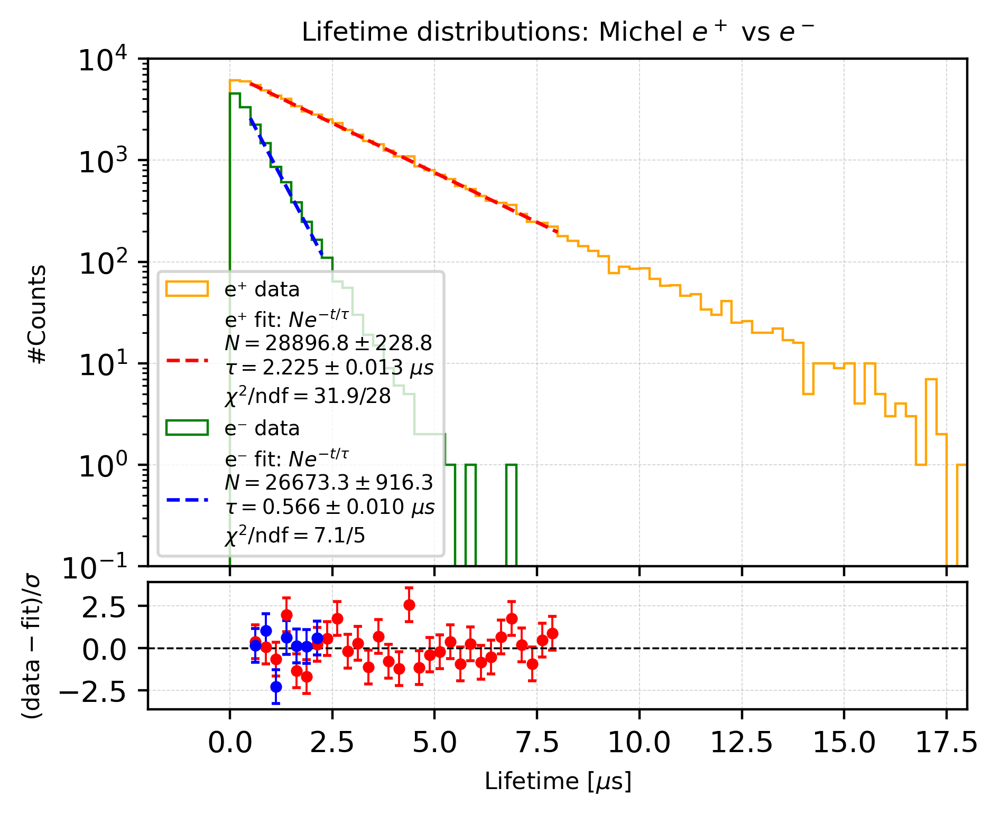


Bin contents for e⁺:
  Bin [0.00, 0.25] (center=0.12): 6094
  Bin [0.25, 0.50] (center=0.38): 5985
  Bin [0.50, 0.75] (center=0.62): 5485
  Bin [0.75, 1.00] (center=0.88): 4882
  Bin [1.00, 1.25] (center=1.12): 4316
  Bin [1.25, 1.50] (center=1.38): 4020
  Bin [1.50, 1.75] (center=1.62): 3404
  Bin [1.75, 2.00] (center=1.88): 3019
  Bin [2.00, 2.25] (center=2.12): 2792
  Bin [2.25, 2.50] (center=2.38): 2514
  Bin [2.50, 2.75] (center=2.62): 2306
  Bin [2.75, 3.00] (center=2.88): 1977
  Bin [3.00, 3.25] (center=3.12): 1786
  Bin [3.25, 3.50] (center=3.38): 1541
  Bin [3.50, 3.75] (center=3.62): 1443
  Bin [3.75, 4.00] (center=3.88): 1239
  Bin [4.00, 4.25] (center=4.12): 1092
  Bin [4.25, 4.50] (center=4.38): 1096
  Bin [4.50, 4.75] (center=4.62): 870
  Bin [4.75, 5.00] (center=4.88): 797
  Bin [5.00, 5.25] (center=5.12): 716
  Bin [5.25, 5.50] (center=5.38): 655
  Bin [5.50, 5.75] (center=5.62): 555
  Bin [5.75, 6.00] (center=5.88): 521
  Bin [6.00, 6.25] (center=6.12): 443
  Bin [6.2

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from matplotlib.gridspec import GridSpec

# --- bin-integrated exponential model ---
def exp1_integrated(bin_edges, N, tau):
    """
    Predict counts in each bin [a,b] using the integral of N*exp(-t/tau).
    """
    a = bin_edges[:-1]
    b = bin_edges[1:]
    return N * tau * (np.exp(-a/tau) - np.exp(-b/tau))

# --- fitting helper (χ² least squares with bin integration) ---
def fit_and_draw(ax, ax_resid, sample, label_prefix, fit_range=(0.05, 15.5),
                 hist_color="orange", fit_color="red"):
    # histogram
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    # fit window mask
    m = (centers >= fit_range[0]) & (centers <= fit_range[1])
    y = counts[m]
    edges_fit = bin_edges[m.nonzero()[0][0] : m.nonzero()[0][-1] + 2]  # edges covering fit window

    if len(y) < 3:
        ax.hist(sample, bins=bins, range=(range_min, range_max),
                histtype='step', linewidth=0.8,
                label=f"{label_prefix} data", color=hist_color)
        return None

    sigma = np.sqrt(np.maximum(y, 1.0))

    # fit using integrated model
    N0, tau0 = np.sum(y), 2.0
    popt, pcov = curve_fit(
        lambda edges, N, tau: exp1_integrated(edges, N, tau),
        edges_fit, y,
        p0=[N0, tau0], sigma=sigma, absolute_sigma=True,
        bounds=([0, 1e-6], [np.inf, np.inf]), maxfev=20000
    )
    N_fit, tau_fit = popt
    N_err, tau_err = np.sqrt(np.diag(pcov))

    # chi²/ndf
    y_model = exp1_integrated(edges_fit, *popt)
    pulls = (y - y_model) / sigma
    chi2 = np.sum(pulls**2)
    ndf = len(y) - len(popt)

    # smooth fit curve (Option B: scaled PDF)
    N_tot = np.sum(counts)   # total entries in histogram
    x_smooth = np.linspace(fit_range[0], fit_range[1], 400)
    y_smooth = (N_tot/tau_fit) * np.exp(-x_smooth/tau_fit) * bin_width

    # draw histogram
    ax.hist(sample, bins=bins, range=(range_min, range_max),
            histtype='step', linewidth=0.8,
            label=f"{label_prefix} data", color=hist_color)

    # draw smooth fit curve
    ax.plot(x_smooth, y_smooth,
            label=(fr"{label_prefix} fit: $Ne^{{-t/\tau}}$" + "\n"
                   + rf"$N={N_fit:.1f}\pm{N_err:.1f}$" + "\n"
                   + rf"$\tau={tau_fit:.3f}\pm{tau_err:.3f}\ \mu s$" + "\n"
                   + rf"$\chi^2/\mathrm{{ndf}} = {chi2:.1f}/{ndf}$"),
            color=fit_color, linestyle="--", linewidth=1.2)

    # residuals (pulls)
    ax_resid.axhline(0, color="black", linewidth=0.6, linestyle="--")
    bin_centers_fit = 0.5 * (edges_fit[:-1] + edges_fit[1:])
    ax_resid.errorbar(bin_centers_fit, pulls, yerr=np.ones_like(pulls), fmt='o',
                      color=fit_color, markersize=3, elinewidth=0.7, capsize=1.5)

    return tau_fit, tau_err, chi2, ndf


# ----------------------------------------------------
# Plot with residuals panel
# ----------------------------------------------------
bin_width = 0.25
range_min, range_max = 0.0, 20
bins = np.arange(range_min, range_max + bin_width, bin_width)

fig = plt.figure(figsize=(5, 4), dpi=400, constrained_layout=True)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

ax = fig.add_subplot(gs[0])
ax_resid = fig.add_subplot(gs[1], sharex=ax)

# Fit e+ (orange hist, red fit) and e- (green hist, blue fit)
fit_and_draw(ax, ax_resid, np.asarray(life_positron), "e⁺",
             fit_range=(0.5, 8.0), hist_color="orange", fit_color="red")
fit_and_draw(ax, ax_resid, np.asarray(life_electron), "e⁻",
             fit_range=(0.5, 2.25), hist_color="green", fit_color="blue")

# Style top plot
ax.set_ylim(0.1, 10000)
ax.set_yscale("log")
ax.tick_params(labelbottom=False)
ax.set_xlabel("")
ax.set_ylabel("#Counts", fontsize=8)
ax.set_title("Lifetime distributions: Michel $e^+$ vs $e^-$", fontsize=9)
ax.legend(fontsize=7)
ax.grid(linestyle="--", linewidth=0.3, alpha=0.6)

# Style residuals
ax_resid.set_xlim(-2, 18)
ax_resid.set_xlabel("Lifetime [$\mu$s]", fontsize=8)
ax_resid.set_ylabel(r"$(\mathrm{data} - \mathrm{fit})/\sigma$", fontsize=8)
ax_resid.grid(linestyle="--", linewidth=0.3, alpha=0.6)

plt.show()







# ----------------------------------------------------
# Print bin contents for both histograms
# ----------------------------------------------------
def print_bin_contents(sample, label):
    counts, bin_edges = np.histogram(sample, bins=bins, range=(range_min, range_max))
    centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    print(f"\nBin contents for {label}:")
    for c, xlow, xhigh, center in zip(counts, bin_edges[:-1], bin_edges[1:], centers):
        print(f"  Bin [{xlow:.2f}, {xhigh:.2f}] (center={center:.2f}): {c}")

# Call for e+ and e-
print_bin_contents(life_positron, "e⁺")
print_bin_contents(life_electron, "e⁻")


#### Energy distribution:

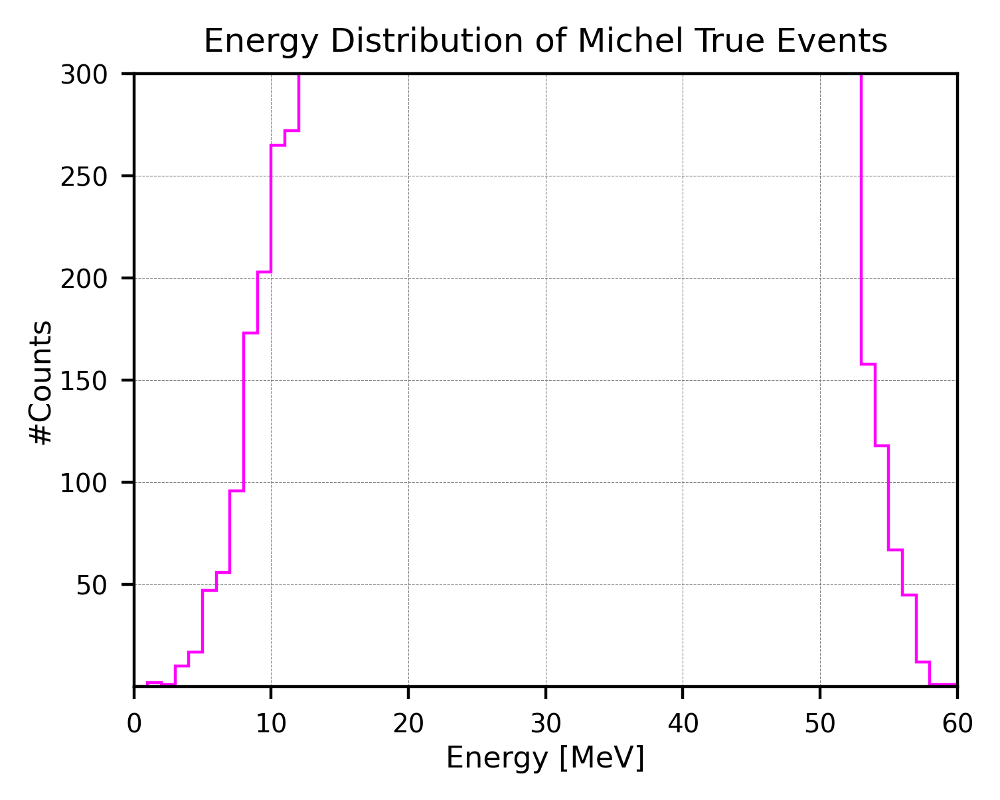

In [36]:
#True Energy distribution==================================================
plt.figure(figsize=(4,3),dpi=400)
bin_width = 1.0
range_min = -20
range_max = 100
bins = np.arange(range_min, range_max + bin_width, bin_width)

final_trueE = [ev.energy for ev in true_newClass]
plt.hist(final_trueE, bins=bins, range=(range_min, range_max), edgecolor='magenta', 
         histtype='step', linewidth=0.8)

plt.xlim(0, 60)
plt.xlabel('Energy [MeV]', labelpad=2, fontsize=8)
plt.ylabel('#Counts', labelpad=1, fontsize=8)
plt.ylim(0.1, 300)
#plt.yscale('log')
plt.tick_params(labelsize=7)#set the size of ticks---
plt.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
plt.title('Energy Distribution of Michel True Events', fontsize=9)
plt.show()  


### lifetime efficiency calculation:
#### The curve of initial fitting (truth of initial MC reco) with the truth of final dataset

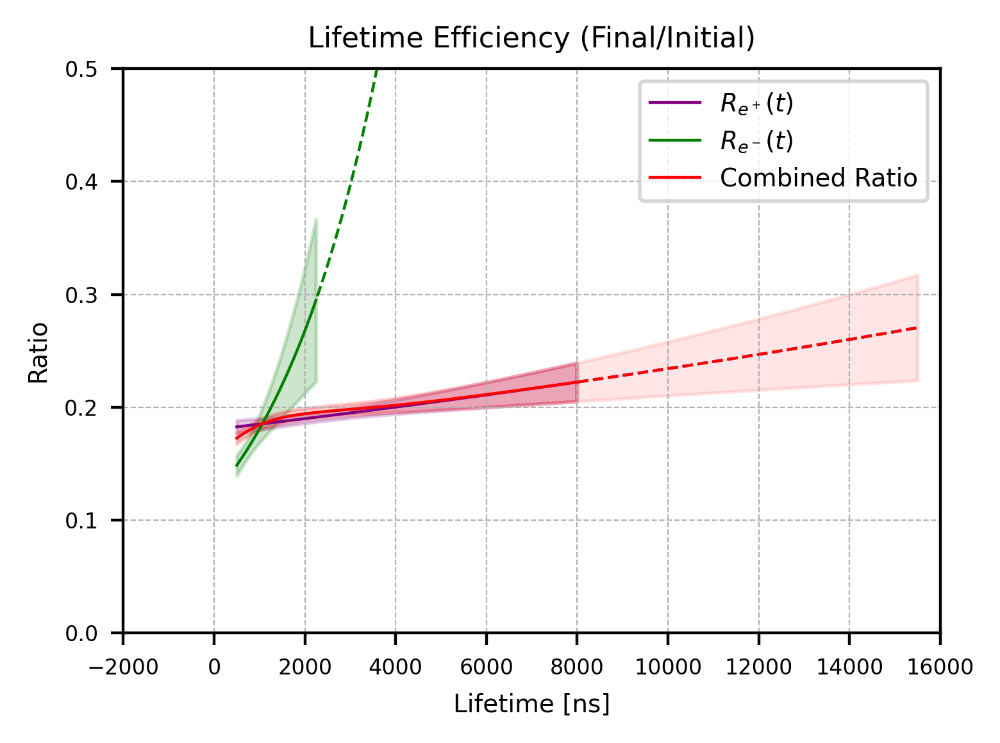

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Normalized exponential pdf
def f(t, tau):
    return (1.0 / tau) * np.exp(-t / tau)

def df_dtau(t, tau):
    ft = f(t, tau)
    return ft * (-1.0/tau + t/(tau**2))

# ========= parameters with uncertainties =========
# e+
tau1_pos, dtau1_pos = 2187.0, 23.0
tau2_pos, dtau2_pos = 2320.0, 65.0
n1_pos, dn1_pos = 13416, np.sqrt(13416)
n2_pos, dn2_pos = 2564, np.sqrt(2564)

# e-
tau1_neg, dtau1_neg = 566.0, 15.0
tau2_neg, dtau2_neg = 728.0, 79.0
n1_neg, dn1_neg = 2797, np.sqrt(2797)
n2_neg, dn2_neg = 439, np.sqrt(439)

# Lifetime range in ns
t = np.linspace(500, 15500, 500)

# ----------- Single-species ratio and uncertainty -----------
def R_ratio(t, n1, n2, tau1, tau2):
    return (n2 / n1) * (tau1 / tau2) * np.exp(-t * (1/tau2 - 1/tau1))

def R_error(t, n1, n2, tau1, tau2, dn1, dn2, dtau1, dtau2):
    R = R_ratio(t, n1, n2, tau1, tau2)
    dR_dn1   = -R / n1
    dR_dn2   =  R / n2
    dR_dtau1 = R * (1.0/tau1 - t/(tau1**2))
    dR_dtau2 = R * (-1.0/tau2 + t/(tau2**2))
    sigma2 = (dR_dn1*dn1)**2 + (dR_dn2*dn2)**2 + (dR_dtau1*dtau1)**2 + (dR_dtau2*dtau2)**2
    return np.sqrt(sigma2)

# e+ and e- ratios + errors
R_pos = R_ratio(t, n1_pos, n2_pos, tau1_pos, tau2_pos)
R_pos_err = R_error(t, n1_pos, n2_pos, tau1_pos, tau2_pos,
                    dn1_pos, dn2_pos, dtau1_pos, dtau2_pos)

R_neg = R_ratio(t, n1_neg, n2_neg, tau1_neg, tau2_neg)
R_neg_err = R_error(t, n1_neg, n2_neg, tau1_neg, tau2_neg,
                    dn1_neg, dn2_neg, dtau1_neg, dtau2_neg)

# ----------- Combined ratio and uncertainty -----------
f1p = f(t, tau1_pos); df1p = df_dtau(t, tau1_pos)
f1n = f(t, tau1_neg); df1n = df_dtau(t, tau1_neg)
f2p = f(t, tau2_pos); df2p = df_dtau(t, tau2_pos)
f2n = f(t, tau2_neg); df2n = df_dtau(t, tau2_neg)

F_init  = n1_pos * f1p + n1_neg * f1n
F_final = n2_pos * f2p + n2_neg * f2n
R_combined = F_final / F_init

invB = 1.0 / F_init
# derivatives wrt parameters
dR_dn2p   = f2p * invB
dR_dn2n   = f2n * invB
dR_dtau2p = (n2_pos * df2p) * invB
dR_dtau2n = (n2_neg * df2n) * invB
dR_dn1p   = -R_combined * f1p * invB
dR_dn1n   = -R_combined * f1n * invB
dR_dtau1p = -R_combined * (n1_pos * df1p) * invB
dR_dtau1n = -R_combined * (n1_neg * df1n) * invB

# error propagation
sigma2_comb = (dR_dn2p*dn2_pos)**2 + (dR_dn2n*dn2_neg)**2 \
            + (dR_dtau2p*dtau2_pos)**2 + (dR_dtau2n*dtau2_neg)**2 \
            + (dR_dn1p*dn1_pos)**2 + (dR_dn1n*dn1_neg)**2 \
            + (dR_dtau1p*dtau1_pos)**2 + (dR_dtau1n*dtau1_neg)**2
R_combined_err = np.sqrt(sigma2_comb)

# ----------- Plot -----------
plt.figure(figsize=(4,3), dpi=400)

# cutoffs
cut_pos = 8000   # ns for e+
cut_neg = 2250   # ns for e-
cut_comb = 8000  # combined trusted range

mask_pos = t <= cut_pos
mask_neg = t <= cut_neg
mask_comb = t <= cut_comb

# e+
plt.plot(t[mask_pos], R_pos[mask_pos], color="purple", lw=0.8, ls="-", label=r"$R_{e^+}(t)$")
plt.fill_between(t[mask_pos], R_pos[mask_pos]-R_pos_err[mask_pos],
                 R_pos[mask_pos]+R_pos_err[mask_pos], color="purple", alpha=0.2)
plt.plot(t[~mask_pos], R_pos[~mask_pos], color="purple", lw=0.8, ls="--")

# e-
plt.plot(t[mask_neg], R_neg[mask_neg], color="green", lw=0.8, ls="-", label=r"$R_{e^-}(t)$")
plt.fill_between(t[mask_neg], R_neg[mask_neg]-R_neg_err[mask_neg],
                 R_neg[mask_neg]+R_neg_err[mask_neg], color="green", alpha=0.2)
plt.plot(t[~mask_neg], R_neg[~mask_neg], color="green", lw=0.8, ls="--")

# combined
plt.plot(t[mask_comb], R_combined[mask_comb], color="red", lw=0.8, ls="-", label="Combined Ratio")
plt.fill_between(t[mask_comb], R_combined[mask_comb]-R_combined_err[mask_comb],
                 R_combined[mask_comb]+R_combined_err[mask_comb],
                 color="red", alpha=0.2)

# dashed extrapolation beyond 8000 ns
plt.plot(t[~mask_comb], R_combined[~mask_comb], color="red", lw=0.8, ls="--")
plt.fill_between(t[~mask_comb], R_combined[~mask_comb]-R_combined_err[~mask_comb],
                 R_combined[~mask_comb]+R_combined_err[~mask_comb],
                 color="red", alpha=0.1)  # weaker shading

# cosmetics
plt.xlabel("Lifetime [ns]", fontsize=7)
plt.ylabel("Ratio", fontsize=7)
plt.tick_params(labelsize=6)
plt.xlim(-2000, 16000)
plt.ylim(0, 0.5)
plt.title("Lifetime Efficiency (Final/Initial)", fontsize=8)
plt.grid(True, linestyle="--", lw=0.4)
plt.legend(fontsize=7, loc="upper right")
plt.tight_layout()
plt.show()


#### Apply efficiency curve

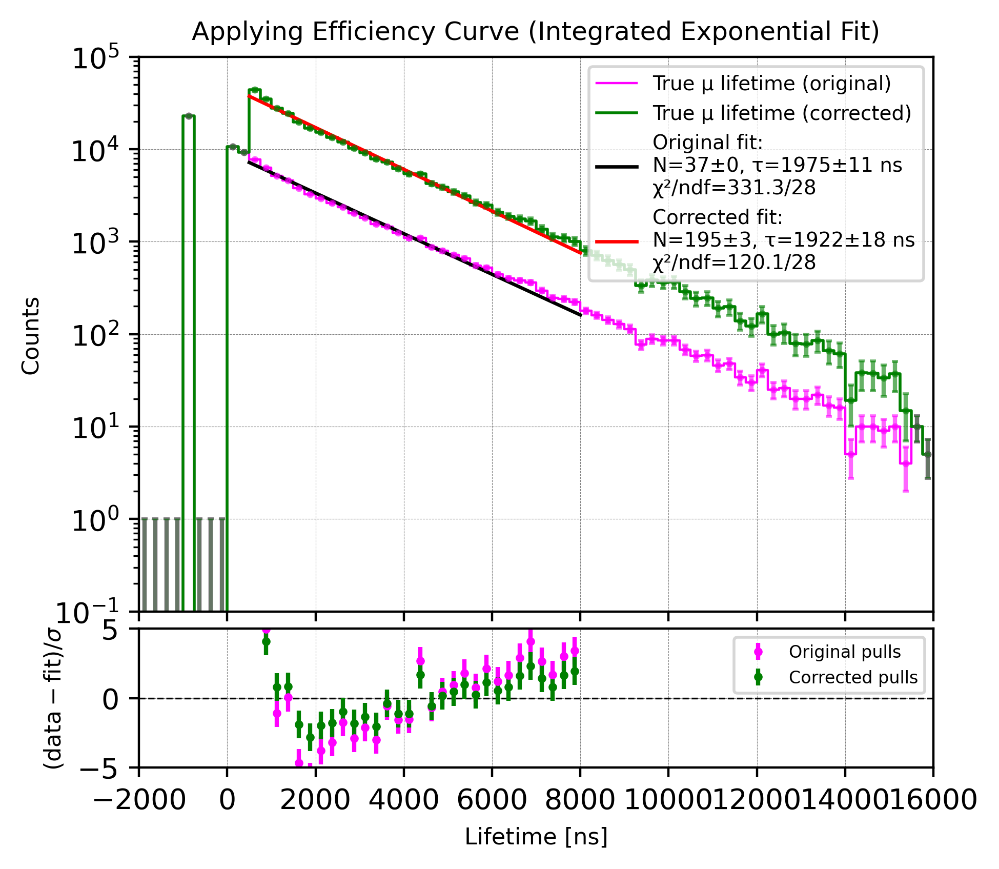

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from matplotlib.gridspec import GridSpec

# Histogram parameters
bin_width = 250
range_min = -16000
range_max = 16000
bins = np.arange(range_min, range_max + bin_width, bin_width)

# --- Compute histogram (True μ lifetime, uncorrected) ---
counts, bin_edges = np.histogram(lifetime_update_ns2, bins=bins, range=(range_min, range_max))
counts_initial = counts.copy()
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Interpolate efficiency curve and error onto bin centers
R_interp = np.interp(bin_centers, t, R_combined)
R_err_interp = np.interp(bin_centers, t, R_combined_err)

# Apply correction only in effective range [500, 15500]
mask = (bin_centers >= 500) & (bin_centers <= 15500)
corrected_counts = counts.astype(float)
corrected_counts[mask] = counts[mask] / R_interp[mask]

# --- Uncertainties ---
unc_initial = np.sqrt(counts_initial)

# Corrected uncertainties: Poisson + efficiency error
unc_corrected = np.zeros_like(corrected_counts, dtype=float)
unc_corrected[mask] = np.sqrt(
    (np.sqrt(counts[mask]) / R_interp[mask])**2 +
    ((counts[mask] * R_err_interp[mask]) / (R_interp[mask]**2))**2
)
unc_corrected[~mask] = np.sqrt(counts[~mask])  # outside range, same as original

unc_initial   = np.where(unc_initial == 0, 1.0, unc_initial)
unc_corrected = np.where(unc_corrected == 0, 1.0, unc_corrected)

# ----------- Bin-integrated exponential model -----------
def exp1_integrated(edges, N, tau):
    """Expected counts in bins defined by edges [a,b]."""
    a = edges[:-1]
    b = edges[1:]
    return N * tau * (np.exp(-a/tau) - np.exp(-b/tau))

def fit_histogram(bin_edges, counts, sigma, mask, label, color):
    # restrict to mask (using bin centers for range, but keep edges for integration)
    centers = 0.5*(bin_edges[:-1] + bin_edges[1:])
    m = mask & (counts > 0)
    y = counts[m]
    err = sigma[m]
    edges_fit = np.concatenate([ [bin_edges[np.where(m)[0][0]]],
                                 bin_edges[np.where(m)[0]+1] ])

    # initial guesses
    N0 = np.sum(y)
    tau0 = 2000.0
    p0 = [N0, tau0]

    popt, pcov = curve_fit(
        lambda edges, N, tau: exp1_integrated(edges, N, tau),
        edges_fit, y, p0=p0, sigma=err,
        absolute_sigma=True, maxfev=20000,
        bounds=([0,1e-6],[np.inf,np.inf])
    )
    perr = np.sqrt(np.diag(pcov))

    # model prediction and pulls
    y_fit = exp1_integrated(edges_fit, *popt)
    pulls = (y - y_fit) / err
    chi2 = np.sum(pulls**2)
    ndf = len(y) - len(popt)

    legend_text = (f"{label} fit:\n"
                   f"N={popt[0]:.0f}±{perr[0]:.0f}, "
                   f"τ={popt[1]:.0f}±{perr[1]:.0f} ns\n"
                   f"χ²/ndf={chi2:.1f}/{ndf}")

    # return also bin centers for pulls
    return popt, perr, legend_text, centers[m], pulls

# Effective fit ranges (allow separate ones)
fit_mask_init = (bin_centers >= 500) & (bin_centers <= 8000)
fit_mask_corr = (bin_centers >= 500) & (bin_centers <= 8000)

# Perform fits
popt_init, perr_init, legend_init, x_init, pulls_init = fit_histogram(bin_edges, counts_initial, unc_initial, fit_mask_init, "Original", "magenta")
popt_corr, perr_corr, legend_corr, x_corr, pulls_corr = fit_histogram(bin_edges, corrected_counts, unc_corrected, fit_mask_corr, "Corrected", "green")

# ----------- Plotting with residuals panel -----------
fig = plt.figure(figsize=(5, 4.5), dpi=400)
gs = GridSpec(2, 1, height_ratios=[4, 1], hspace=0.05)

ax = fig.add_subplot(gs[0])
ax_resid = fig.add_subplot(gs[1], sharex=ax)

# --- Top panel ---
ax.step(bin_centers, counts_initial, where="mid", color="magenta", linewidth=0.8,
        label="True μ lifetime (original)")
ax.errorbar(bin_centers, counts_initial, yerr=unc_initial, fmt='o', color="magenta",
            markersize=1.5, capsize=1.0, alpha=0.6)

ax.step(bin_centers, corrected_counts, where="mid", color="green", linewidth=1.0,
        label="True μ lifetime (corrected)")
ax.errorbar(bin_centers, corrected_counts, yerr=unc_corrected, fmt='o', color="green",
            markersize=1.5, capsize=1.0, alpha=0.6)

# Plot fits (overlay smooth curve consistent with histogram counts)
fit_x = np.linspace(500, 8000, 400)
ax.plot(fit_x, popt_init[0] * np.exp(-fit_x / popt_init[1]) * bin_width,
        color="black", lw=1.2, label=legend_init)
ax.plot(fit_x, popt_corr[0] * np.exp(-fit_x / popt_corr[1]) * bin_width,
        color="red", lw=1.2, label=legend_corr)


ax.set_ylim(0.1, 100000)
ax.set_yscale('log')
ax.set_ylabel("Counts", fontsize=8)
ax.set_xlim(-2000, 16000)
ax.set_title("Applying Efficiency Curve (Integrated Exponential Fit)", fontsize=9)
ax.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax.legend(fontsize=7, loc="upper right", frameon=True)
ax.tick_params(labelbottom=False)

# --- Bottom panel ---
ax_resid.axhline(0, color="black", linewidth=0.6, linestyle="--")
ax_resid.errorbar(x_init, pulls_init, yerr=np.ones_like(pulls_init),
                  fmt='o', color="magenta", markersize=2, label="Original pulls")
ax_resid.errorbar(x_corr, pulls_corr, yerr=np.ones_like(pulls_corr),
                  fmt='o', color="green", markersize=2, label="Corrected pulls")

ax_resid.set_xlabel("Lifetime [ns]", fontsize=8)
ax_resid.set_ylabel(r"$(\mathrm{data}-\mathrm{fit})/\sigma$", fontsize=8)
ax_resid.set_xlim(-2000, 16000)
ax_resid.set_ylim(-5, 5)
ax_resid.grid(color='gray', linestyle='--', linewidth=0.2, zorder=0)
ax_resid.legend(fontsize=6, loc="upper right")

plt.show()

